# Protein Sequence Classification: Machine Learning

## Import Libraries

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from collections import Counter
import re
from tqdm import tqdm
import random

import tensorflow as tf
# tf.config.run_functions_eagerly(True)
import torch


In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# To ensure reproducibility
# for keras operations that use random numbers internally
random_seed = 42
random.seed(random_seed)
torch.manual_seed(random_seed)
torch.cuda.manual_seed_all(random_seed)
np.random.seed(random_seed)
tf.random.set_seed(random_seed)

## Loading cleaned protein sequence data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/protein_seq_classification/pdb/pdb_protein_seq_clean.csv')
data = pd.read_csv('pdb_protein_seq_clean.csv')
# data.head()

## Machine learning Models

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
# from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import make_scorer, f1_score, accuracy_score, confusion_matrix, classification_report, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.metrics import multilabel_confusion_matrix


import warnings
warnings.filterwarnings('ignore')

In [ ]:
# split dataset into training and testing set
random_seed = 42
X_training, X_testing,y_training,y_testing = train_test_split(data['clean_sequence'], data['classification'], test_size = 0.2, shuffle = True, stratify = data['classification'], random_state = random_seed)

In [ ]:
# label/integer encoding output variable: (y)
le = LabelEncoder()

y_training = le.fit_transform(y_training)
y_testing = le.transform(y_testing)

In [ ]:
import joblib
labelencoder = {'le': le}
joblib.dump(labelencoder, "label_encoder.joblib")

['label_encoder.joblib']

In [ ]:
le.inverse_transform(y_training)

array(['transferase', 'chaperone', 'translation', ..., 'chaperone',
       'hydrolase', 'hydrolase'], dtype=object)

In [ ]:
# creating list of all 75 classes
labels = le.classes_
print(labels)

['allergen' 'antibiotic hydrolase' 'antibiotic transferase'
 'antimicrobial protein' 'apoptosis' 'biosynthetic protein'
 'biotin-binding protein' 'blood clotting' 'calcium-binding protein'
 'cell adhesion' 'cell cycle' 'cell invasion' 'chaperone'
 'contractile protein' 'cytokine' 'de novo protein' 'dna binding protein'
 'electron transport' 'endocytosis' 'endocytosis/exocytosis'
 'flavoprotein' 'fluorescent protein' 'gene regulation'
 'growth factor hormone' 'hormone' 'hormone receptor' 'hydrolase'
 'hydrolase inhibitor' 'immune system' 'immunoglobulin' 'isomerase'
 'isomerase inhibitor' 'lectin' 'ligase' 'ligase inhibitor'
 'lipid binding protein' 'lipid transport' 'luminescent protein' 'lyase'
 'lyase inhibitor' 'membrane protein' 'metal binding protein'
 'metal transport' 'motor protein' 'nuclear protein' 'oxidoreductase'
 'oxidoreductase inhibitor' 'oxygen storage' 'oxygen transport'
 'peptide binding protein' 'phosphotransferase' 'photosynthesis'
 'plant protein' 'protein binding'

#### USING UNI-GRAMS

In [ ]:
# Create a Count Vectorizer to gather the unique elements in sequence
vect_1 = CountVectorizer(analyzer = 'char', ngram_range = (1,1))      # using uni-grams

# Fit and Transform CountVectorizer
vect_1.fit(X_training)
X_train_1 = vect_1.transform(X_training)
X_test_1 = vect_1.transform(X_testing)


In [ ]:
X_train_1[0]

<1x20 sparse matrix of type '<class 'numpy.int64'>'
	with 20 stored elements in Compressed Sparse Row format>

In [ ]:
X_train_1[0].todense()

matrix([[20,  4, 15, 20, 14, 19,  6, 18, 19, 27,  7, 12, 15, 14,  7, 17,
         21, 18,  6, 10]])

In [ ]:
vect_1.get_feature_names_out()

array(['a', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'k', 'l', 'm', 'n', 'p',
       'q', 'r', 's', 't', 'v', 'w', 'y'], dtype=object)

##### KNeighborsClassifier

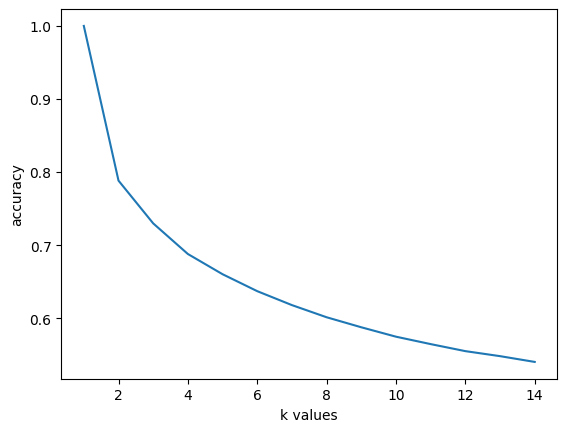

In [ ]:
# Finding k values in range(1,15)
score_list = []
for each in range(1,15):
    knn = KNeighborsClassifier(n_neighbors = each)
    knn.fit(X_train_1, y_training)
    score_list.append(knn.score(X_train_1, y_training))

plt.plot(range(1,15),score_list)
plt.xlabel("k values")
plt.ylabel("accuracy")
plt.show()

In [ ]:
# Define the scoring metrics
scoring = {'accuracy': 'accuracy', 'f1_weighted': make_scorer(f1_score, average='weighted'), 'f1_macro': make_scorer(f1_score, average='macro')}

In [ ]:
# KNeighborsClassifier
# It took approximately 3-4 hours to train the model
params_knn = {'n_neighbors': list(range(2,10)),
         'weights': ['uniform', 'distance'],
         'leaf_size': list(range(10,20))
        }
knn1 = KNeighborsClassifier()
gs_knn1 = RandomizedSearchCV(knn1, param_distributions=params_knn, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)
gs_knn1.fit(X_train_1, y_training)
#See the best results:
# Best parameter set
print('Best parameters found:\n', gs_knn1.best_params_)
print('Best score found:\n', gs_knn1.best_score_)

Best parameters found:
 {'weights': 'distance', 'n_neighbors': 5, 'leaf_size': 13}
Best score found:
 0.6778714108089035


In [ ]:
# Extract the results
results = gs_knn1.cv_results_

# Calculate mean and std for accuracy
accuracy_mean = results['mean_test_accuracy'].mean()
accuracy_std = results['std_test_accuracy'].mean()

# Calculate mean and std for weighted F1 score
f1_mean = results['mean_test_f1_weighted'].mean()
f1_std = results['std_test_f1_weighted'].mean()

# Calculate mean and std for macro F1 score
f1_macro_mean = results['mean_test_f1_macro'].mean()
f1_macro_std = results['std_test_f1_macro'].mean()


print(f"Accuracy: {accuracy_mean:.3f} ± {accuracy_std:.3f}")
print(f"F1 Score (weighted): {f1_mean:.3f} ± {f1_std:.3f}")
print(f"F1 Score (macro): {f1_macro_mean:.3f} ± {f1_macro_std:.3f}")


Accuracy: 0.678 ± 0.002
F1 Score (weighted): 0.673 ± 0.002
F1 Score (macro): 0.553 ± 0.001


In [ ]:
# best_knn1 = KNeighborsClassifier(n_neighbors=5, leaf_size = 13, weights = 'distance')
# best_knn1.fit(X_train_1, y_training)

best_knn1 = gs_knn1.best_estimator_
best_knn1

KNeighborsClassifier(leaf_size=13, weights='distance')

In [ ]:
knn_pred1 = best_knn1.predict(X_test_1)
acc_knn1 = accuracy_score(knn_pred1, y_testing)
print('accuracy: %s' % acc_knn1)
f1_knn1 = f1_score(y_testing, knn_pred1, average='weighted')
print('f1 score: %s' % f1_knn1)

f1_macro_knn1 = f1_score(y_testing, knn_pred1, average='macro')

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, knn_pred1, target_names=labels))


accuracy: 0.7162694825154594
f1 score: 0.7121785251474734
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.83      0.54      0.65        28
    antibiotic hydrolase       0.54      0.50      0.52        26
  antibiotic transferase       0.38      0.30      0.33        20
   antimicrobial protein       0.60      0.49      0.54        37
               apoptosis       0.60      0.67      0.63       107
    biosynthetic protein       0.68      0.61      0.65        83
  biotin-binding protein       0.88      0.96      0.92        24
          blood clotting       0.60      0.67      0.63        67
 calcium-binding protein       0.41      0.71      0.52        24
           cell adhesion       0.68      0.60      0.64       287
              cell cycle       0.57      0.49      0.53       234
           cell invasion       0.69      0.43      0.53        21
               chap

In [ ]:
accuracy_list1 = []
f1_list1 = []
macro_f1_list1 = []
# accuracy_list1.append(acc_knn1)
# f1_list1.append(f1_knn1)
# macro_f1_list1.append(f1_macro_knn1)



accuracy_list1.append(0.72)
f1_list1.append(0.71)
macro_f1_list1.append(0.60)


In [ ]:
# # confusion matrix
cm_knn1 = confusion_matrix(y_testing, knn_pred1)#.astype(int)
cm_df_knn1 = pd.DataFrame(cm_knn1, columns = pd.Index(labels, name = 'Predicted Label:'), index = pd.Index(labels, name='Actual Label:'))
# cm_df_knn1

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_knn1 = confusion_matrix(y_testing, knn_pred1)#.astype(int)
sns.heatmap(cm_knn1, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
multi_cm_knn1 = multilabel_confusion_matrix(y_testing, knn_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_knn1

In [ ]:
# Plotting confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_knn1):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### MultinomialNB

In [ ]:
# Naive Bayes Model
# It took approximately 2-3 hours to train the model
params_nb = {'alpha': [0.001, 0.01, 0.1, 0.5, 1.0],
        }

nb1 = MultinomialNB(fit_prior=True)
gs_nb1 = RandomizedSearchCV(nb1, param_distributions=params_nb, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)
gs_nb1.fit(X_train_1, y_training)
#See the best results:
# Best paramete set
print('Best parameters found:\n', gs_nb1.best_params_)
print('Best score found:\n', gs_nb1.best_score_)

Best parameters found:
 {'alpha': 0.001}
Best score found:
 0.16610011697931118


In [ ]:
best_nb1 = MultinomialNB(alpha = 0.001)
best_nb1.fit(X_train_1, y_training)

best_nb1 = gs_nb1.best_estimator_
best_nb1

MultinomialNB(alpha=0.001)

In [ ]:
NB_pred1 = best_nb1.predict(X_test_1)
acc_nb1 = accuracy_score(NB_pred1, y_testing)
print('accuracy: %s' % acc_nb1)
f1_nb1 = f1_score(y_testing, NB_pred1, average='weighted')
print('f1 score: %s' % f1_nb1)
macro_f1_nb1 = f1_score(y_testinf, NB_pred1, average='macro')

# accuracy_list1.append(acc_nb1)
# f1_list1.append(f1_nb1)
# macro_f1_list1.append(macro_f1_nb1)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, NB_pred1, target_names=labels))

accuracy: 0.1747730806784074
f1 score: 0.16913987247081672
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.11      0.21      0.14        28
    antibiotic hydrolase       0.04      0.54      0.08        26
  antibiotic transferase       0.01      0.25      0.02        20
   antimicrobial protein       0.02      0.30      0.04        37
               apoptosis       0.09      0.04      0.05       107
    biosynthetic protein       0.00      0.00      0.00        83
  biotin-binding protein       0.22      0.83      0.35        24
          blood clotting       0.06      0.13      0.08        67
 calcium-binding protein       0.11      0.75      0.19        24
           cell adhesion       0.24      0.06      0.09       287
              cell cycle       0.25      0.03      0.05       234
           cell invasion       0.01      0.05      0.01        21
               cha

In [ ]:
accuracy_list1.append(0.17)
f1_list1.append(0.17)
macro_f1_list1.append(0.10)

In [ ]:
# # confusion matrix
cm_nb1 = confusion_matrix(y_testing, NB_pred1)# .astype(int)
cm_df_nb1 = pd.DataFrame(cm_nb1, columns = pd.Index(labels, name = 'Predicted Label:'), index = pd.Index(labels, name='Actual Label:'))
# cm_df_nb1

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_nb1 = confusion_matrix(y_testing, NB_pred1)#.astype(int)
sns.heatmap(cm_nb1, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
multi_cm_nb1 = multilabel_confusion_matrix(y_testing, NB_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_nb1

In [ ]:
# plotting confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_nb1):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### Logistic Regression

In [ ]:
# Logistic Regression Classifier
# It took approximately 1 hours to train the model
params_lr = {
    'penalty': ['l1', 'l2', 'elasticnet'],
    'C': [0.001, 0.01, 1.0, 5.0],
    'solver': ['lbfgs', 'newton-cg', 'sag', 'saga'],
}

logreg1 = LogisticRegression(max_iter=300, class_weight = 'balanced', random_state=random_seed, verbose = 1)
gs_lr1 = RandomizedSearchCV(logreg1, param_distributions=params_lr, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)

gs_lr1.fit(X_train_1, y_training)
#See the best results:
# Best paramete set
print('Best parameters found:\n', gs_lr1.best_params_)
print('Best score found:\n', gs_lr1.best_score_)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  7.1min finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed: 13.0min finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed: 19.1min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Best parameters found:
 {'solver': 'newton-cg', 'penalty': 'l2', 'C': 1.0}
Best score found:
 0.10202698741014671


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed: 12.6min finished


In [ ]:
# best_lr1 = LogisticRegression(max_iter=300, solver = 'newton-cg', penalty = 'l2', class_weight = 'balanced', C = 1.0, random_state=random_seed, verbose = 1)
# best_lr1.fit(X_train_1, y_training)

best_lr1 = gs_lr1.best_estimator_
best_lr1

LogisticRegression(class_weight='balanced', max_iter=300, random_state=42,
                   solver='newton-cg', verbose=1)

In [ ]:
lr_pred1 = best_lr1.predict(X_test_1)
acc_lr1 = accuracy_score(lr_pred1, y_testing)
print('accuracy: %s' % acc_lr1)
f1_lr1 = f1_score(y_testing, lr_pred1, average='weighted')
print('f1 score: %s' % f1_lr1)
macro_f1_lr1 = f1_score(y_testing, lr_pred1, average='macro')

# accuracy_list1.append(acc_lr1)
# f1_list1.append(f1_lr1)
# macro_f1_list1.append(macro_f1_lr1)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, lr_pred1, target_names=labels))

accuracy: 0.10013380103424584
f1 score: 0.09400546418732993
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.02      0.39      0.04        28
    antibiotic hydrolase       0.02      0.69      0.04        26
  antibiotic transferase       0.01      0.40      0.02        20
   antimicrobial protein       0.03      0.57      0.05        37
               apoptosis       0.08      0.23      0.12       107
    biosynthetic protein       0.01      0.01      0.01        83
  biotin-binding protein       0.28      0.92      0.43        24
          blood clotting       0.05      0.24      0.09        67
 calcium-binding protein       0.04      0.83      0.08        24
           cell adhesion       0.16      0.13      0.15       287
              cell cycle       0.12      0.10      0.11       234
           cell invasion       0.04      0.43      0.07        21
               ch

In [ ]:
accuracy_list1.append(0.10)
f1_list1.append(0.09)
macro_f1_list1.append(0.09)

In [ ]:
# # confusion matrix
cm_lr1 = confusion_matrix(y_testing, lr_pred1)# .astype(int)
cm_df_lr1 = pd.DataFrame(cm_lr1, columns = pd.Index(labels, name = 'Predicted Label:'), index = pd.Index(labels, name='Actual Label:'))
# cm_df_lr1

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_lr1 = confusion_matrix(y_testing, lr_pred1)#.astype(int)
sns.heatmap(cm_lr1, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
multi_cm_lr1 = multilabel_confusion_matrix(y_testing, lr_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_lr1

In [ ]:
# plotting confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_lr1):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### MLP Classifier

In [ ]:
# MLPClassifier
# It took approximately 4-5 hours to train the model
params_mlp = {
    'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,), (100,100,100)],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate': ['invscaling','constant','adaptive'],
}

mlp1 = MLPClassifier(max_iter=300, activation='relu', solver='adam', random_state=random_seed)
gs_mlp1 = RandomizedSearchCV(mlp1, param_distributions=params_mlp, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)

gs_mlp1.fit(X_train_1, y_training)

In [ ]:
# Best paramete set
print('Best parameters found:\n', gs_mlp1.best_params_)
print('Best score found:\n', gs_mlp1.best_score_)

Best parameters found:
{'learning_rate': 'invscaling', 'hidden_layer_sizes': (100, 100, 100), 'alpha': 0.01}
Best score found:
 0.5366158174201038


In [ ]:
# best_mlp1 = MLPClassifier(alpha = 0.01, hidden_layer_sizes = (100,100,100), max_iter=300, activation='relu', solver='adam', learning_rate = 'invscaling', random_state=random_seed)
# best_mlp1.fit(X_train_1, y_training)

best_mlp1 = gs_mlp1.best_estimator_
best_mlp1

MLPClassifier(alpha=0.01, hidden_layer_sizes=(100, 100, 100),
              learning_rate='invscaling', max_iter=300, random_state=42)

In [ ]:
mlp_pred1 = best_mlp1.predict(X_test_1)
acc_mlp1 = accuracy_score(mlp_pred1, y_testing)
print('accuracy: %s' % acc_mlp1)
f1_mlp1 = f1_score(y_testing, mlp_pred1, average='weighted')
print('f1 score: %s' % f1_mlp1)
macro_f1_mlp1 = f1_score(y_testing, mlp_pred1, average='macro')

# accuracy_list1.append(acc_mlp1)
# f1_list1.append(f1_mlp1)
# macro_f1_list1.append(macro_f1_mlp1)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, mlp_pred1, target_names=labels))

accuracy: 0.5671717354355766
f1 score: 0.5535648253960832
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.44      0.39      0.42        28
    antibiotic hydrolase       0.10      0.04      0.06        26
  antibiotic transferase       0.67      0.10      0.17        20
   antimicrobial protein       0.57      0.32      0.41        37
               apoptosis       0.42      0.50      0.46       107
    biosynthetic protein       0.40      0.20      0.27        83
  biotin-binding protein       0.75      1.00      0.86        24
          blood clotting       0.49      0.40      0.44        67
 calcium-binding protein       0.29      0.42      0.34        24
           cell adhesion       0.37      0.41      0.39       287
              cell cycle       0.47      0.27      0.35       234
           cell invasion       0.29      0.10      0.14        21
               chap

In [ ]:
accuracy_list1.append(0.57)
f1_list1.append(0.55)
macro_f1_list1.append(0.40)

In [ ]:
# confusion matrix
cm_mlp1 = confusion_matrix(y_testing, mlp_pred1)#.astype(int)
cm_df_mlp1 = pd.DataFrame(cm_mlp1, columns = labels, index = labels)
# cm_df_mlp1

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_mlp1 = confusion_matrix(y_testing, mlp_pred1)#.astype(int)
sns.heatmap(cm_mlp1, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
multi_cm_mlp1 = multilabel_confusion_matrix(y_testing, mlp_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_mlp1

In [ ]:
# plotting confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_mlp1):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### Decision Tree Classifier

In [ ]:
#Decision Tree Classifier
# It took approximately 2-3 hours to train the model
params_dtc = {
    'criterion': ['gini', 'entropy', 'log_loss'],
    'splitter': ['best', 'random'],
}

dtc1 = DecisionTreeClassifier(min_samples_split=2, class_weight = 'balanced', random_state=random_seed)
gs_dtc1 = RandomizedSearchCV(dtc1, param_distributions=params_dtc, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)

gs_dtc1.fit(X_train_1, y_training)
# Best paramete set
print('Best parameters found:\n', gs_dtc1.best_params_)
print('Best score found:\n', gs_dtc1.best_score_)

Best parameters found:
 {'splitter': 'best', 'criterion': 'entropy'}
Best score found:
 0.570871950187717


In [ ]:
# best_dtc1 = DecisionTreeClassifier(criterion = 'entropy', splitter = 'best', min_samples_split = 2, class_weight = 'balanced', random_state=random_seed)
# best_dtc1.fit(X_train_1, y_training)

best_dtc1 = gs_dtc1.best_estimator_
best_dtc1

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       random_state=42)

In [ ]:
dtc_pred1 = best_dtc1.predict(X_test_1)
acc_dtc1 = accuracy_score(dtc_pred1, y_testing)
print('accuracy: %s' % acc_dtc1)
f1_dtc1 = f1_score(y_testing, dtc_pred1, average='weighted')
print('f1 score: %s' % f1_dtc1)
macro_f1_dtc1 = f1_score(y_testing, dtc_pred1, average='macro')

# accuracy_list1.append(acc_dtc1)
# f1_list1.append(f1_dtc1)
# macro_f1_list1.append(macro_f1_dtc1)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, dtc_pred1, target_names=labels))


accuracy: 0.6457527212237371
f1 score: 0.6488013082188214
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.52      0.46      0.49        28
    antibiotic hydrolase       0.26      0.69      0.38        26
  antibiotic transferase       0.17      0.35      0.23        20
   antimicrobial protein       0.57      0.43      0.49        37
               apoptosis       0.53      0.63      0.57       107
    biosynthetic protein       0.49      0.57      0.53        83
  biotin-binding protein       0.79      0.96      0.87        24
          blood clotting       0.33      0.75      0.46        67
 calcium-binding protein       0.27      0.75      0.40        24
           cell adhesion       0.52      0.48      0.50       287
              cell cycle       0.48      0.56      0.52       234
           cell invasion       0.21      0.24      0.22        21
               chap

In [ ]:
accuracy_list1.append(0.65)
f1_list1.append(0.65)
macro_f1_list1.append(0.53)

In [ ]:
# confusion matrix
cm_dtc1 = confusion_matrix(y_testing, dtc_pred1)#.astype(int)
cm_df_dtc1 = pd.DataFrame(cm_dtc1, columns = labels, index = labels)
# cm_df_dtc1

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_dtc1 = confusion_matrix(y_testing, dtc_pred1)#.astype(int)
sns.heatmap(cm_dtc1, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
multi_cm_dtc1 = multilabel_confusion_matrix(y_testing, dtc_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_dtc1

In [ ]:
# plotting confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_dtc1):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### Random Forest Classifier

In [ ]:
#Random Forest Classifier
# It took approximately 2-3 hours to train the model
params_rfc = {
    'n_estimators': [10,20,30,40,50,100],
    'criterion': ['gini', 'entropy'],

}

rfc1 = RandomForestClassifier(min_samples_split = 2, class_weight = 'balanced', verbose = 1, random_state=random_seed)
gs_rfc1 = RandomizedSearchCV(rfc1, param_distributions=params_rfc, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)

gs_rfc1.fit(X_train_1, y_training)
# Best paramete set
print('Best parameters found:\n', gs_rfc1.best_params_)
print('Best score found:\n', gs_rfc1.best_score_)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   30.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   30.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapse

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  5.7min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    4.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed:  2.1min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  5.6min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  5.5min finished
[Parallel(n_jobs=1)]: Us

Best parameters found:
 {'n_estimators': 100, 'criterion': 'entropy'}
Best score found:
 0.6471322714998469


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  4.8min finished


In [ ]:
# best_rfc1 = RandomForestClassifier(n_estimators = 100, min_samples_split = 2, criterion = 'entropy', verbose = 1, class_weight = 'balanced', random_state=random_seed)
# best_rfc1.fit(X_train_1, y_training)

best_rfc1 = gs_rfc1.best_estimator_
best_rfc1

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  4.8min finished


RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       random_state=42, verbose=1)

In [ ]:
rfc_pred1 = best_rfc1.predict(X_test_1)
acc_rfc1 = accuracy_score(rfc_pred1, y_testing)
print('accuracy: %s' % acc_rfc1)
f1_rfc1 = f1_score(y_testing, rfc_pred1, average='weighted')
print('f1 score: %s' % f1_rfc1)
macro_f1_rfc1 = f1_score(y_testing, rfc_pred1, average='macro')

# accuracy_list1.append(acc_rfc1)
# f1_list1.append(f1_rfc1)
# macro_f1_list1.append(macro_f1_rfc1)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, rfc_pred1, target_names=labels))


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


accuracy: 0.7138104364806712
f1 score: 0.7138843152449607
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.83      0.68      0.75        28
    antibiotic hydrolase       0.27      0.65      0.39        26
  antibiotic transferase       0.22      0.40      0.28        20
   antimicrobial protein       0.79      0.51      0.62        37
               apoptosis       0.73      0.67      0.70       107
    biosynthetic protein       0.76      0.61      0.68        83
  biotin-binding protein       0.82      0.96      0.88        24
          blood clotting       0.41      0.76      0.53        67
 calcium-binding protein       0.41      0.75      0.53        24
           cell adhesion       0.80      0.54      0.65       287
              cell cycle       0.69      0.60      0.64       234
           cell invasion       0.71      0.24      0.36        21
               chap

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    2.1s finished


In [ ]:
accuracy_list1.append(0.71)
f1_list1.append(0.71)
macro_f1_list1.append(0.62)

In [ ]:
# confusion matrix
cm_rfc1 = confusion_matrix(y_testing, rfc_pred1)#.astype(int)
cm_df_rfc1 = pd.DataFrame(cm_rfc1, columns = labels, index = labels)
# cm_df_rfc1

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_rfc1 = confusion_matrix(y_testing, rfc_pred1)#.astype(int)
sns.heatmap(cm_rfc1, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
multi_cm_rfc1 = multilabel_confusion_matrix(y_testing, rfc_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_rfc1

In [ ]:
# plotting confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_rfc1):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### XGBoost Classifier

In [ ]:
!pip install xgboost

In [ ]:
from xgboost import XGBClassifier

In [ ]:
np.unique(y_training)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74])

In [ ]:
from sklearn.utils import class_weight

cw = class_weight.compute_class_weight('balanced', classes = np.unique(y_training) ,y = y_training)

print(cw)


[12.93660819 14.04546032 18.20707819  9.96468468  3.45380172  4.42874875
 15.68907801  5.46212346 15.2038488   1.28352771  1.57561254 17.98504065
  1.37829283  4.63765199  5.99501355  3.74307953  1.21181046  0.76691281
 14.18051282 13.05109145 17.76835341  4.88335541  2.44978959  9.10353909
  9.04768916 14.89670034  0.07416512  0.25374627  0.20623316  6.64312312
  0.72080808 12.93660819 11.34441026  0.777424    8.88417671  3.77179881
 10.68676329  7.92888889  0.40762115  5.62890585  0.80809498  1.34928942
  3.6235217   3.3670624  12.93660819  0.12621081  1.97690795  3.5366267
  2.99750678  7.72132635 17.14852713  1.65333333  5.46212346  0.82992309
  1.53302841 14.45856209  6.76501529 14.89670034 17.35027451  2.10081671
  0.52670476 15.04870748  1.15126724  1.36806432  1.67587879  0.41287047
 15.68907801  3.27727407  0.11127845  0.6473983   3.48646178  0.49060989
  0.50026232  0.66822534  1.49117627]


In [ ]:
#XGBoost Classifier
# It took approximately 3-4 hours to train the model
params_xgb = {
    'n_estimators': [100,200,300,400,500],
    'max_depth': [3, 5, 7],  # maximum depth for each tree
    'learning_rate':[0.0001, 0.001, 0.01, 0.1]
}

xgb1 = XGBClassifier(gamma = 0.1, tree_method = 'hist', random_state=random_seed)
gs_xgb1 = RandomizedSearchCV(xgb1, param_distributions=params_xgb, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)

gs_xgb1.fit(X_train_1, y_training)
# Best paramete set
print('Best parameters found:\n', gs_xgb1.best_params_)
print('Best score found:\n', gs_xgb1.best_score_)

Best parameters found:
 {'n_estimators': 400, 'max_depth': 7, 'learning_rate': 0.1}
Best score found:
 0.6556578411877144


In [ ]:
# best_xgb1 = XGBClassifier(n_estimators = 400, gamma = 0.1, max_depth = 7, tree_method = 'hist', learning_rate = 0.1, random_state=random_seed, n_jobs = -1)
# best_xgb1.fit(X_train_1, y_training)
best_xgb1 = gs_xgb1.best_estimator_
best_xgb1

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=400, n_jobs=-1, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [ ]:
xgb_pred1 = best_xgb1.predict(X_test_1)
acc_xgb1 = accuracy_score(xgb_pred1, y_testing)
print('accuracy: %s' % acc_xgb1)
f1_xgb1 = f1_score(y_testing, xgb_pred1, average='weighted')
print('f1 score: %s' % f1_xgb1)
macro_f1_xgb1 = f1_score(y_testing, xgb_pred1, average='macro')

# accuracy_list1.append(acc_xgb1)
# f1_list1.append(f1_xgb1)
# macro_f1_list1.append(macro_f1_xgb1)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, xgb_pred1, target_names=labels))


accuracy: 0.7070480598850034
f1 score: 0.701233024279639
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.76      0.57      0.65        28
    antibiotic hydrolase       0.62      0.38      0.48        26
  antibiotic transferase       0.45      0.25      0.32        20
   antimicrobial protein       0.76      0.43      0.55        37
               apoptosis       0.79      0.61      0.69       107
    biosynthetic protein       0.79      0.49      0.61        83
  biotin-binding protein       0.86      1.00      0.92        24
          blood clotting       0.78      0.57      0.66        67
 calcium-binding protein       0.48      0.54      0.51        24
           cell adhesion       0.72      0.53      0.61       287
              cell cycle       0.68      0.50      0.58       234
           cell invasion       0.75      0.14      0.24        21
               chape

In [ ]:
accuracy_list1.append(0.71)
f1_list1.append(0.70)

macro_f1_list1.append(0.61)

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_xgb1 = confusion_matrix(y_testing, xgb_pred1)#.astype(int)
sns.heatmap(cm_xgb1, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_xgb1 = confusion_matrix(y_testing, xgb_pred1)#.astype(int)
cm_df_xgb1 = pd.DataFrame(cm_xgb1, columns = labels, index = labels)
# cm_df_xgb1

In [ ]:
multi_cm_xgb1 = multilabel_confusion_matrix(y_testing, xgb_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_xgb1

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_xgb1):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### Voting Classifier

In [ ]:
!pip install xgboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 12.3 MB/s eta 0:00:00a 0:00:01


In [ ]:
# group / ensemble of models
estimator1 = []
estimator1.append(('RFC', RandomForestClassifier(n_estimators = 100, min_samples_split = 2, criterion = 'entropy', verbose = 1, class_weight = 'balanced', random_state=random_seed, n_jobs = -1)))
estimator1.append(('KNN', KNeighborsClassifier(n_neighbors=5, leaf_size = 13, weights = 'distance', n_jobs = -1)))
estimator1.append(('XGB', XGBClassifier(booster = 'gbtree', n_estimators = 500, gamma = 0.1, max_depth = 7, tree_method = 'hist', learning_rate = 0.1, random_state=random_seed, n_jobs = -1)))

In [ ]:
# Voting Classifier with soft voting
# It took approximately 3-4 hours to train the model
vot_soft1 = VotingClassifier(estimators = estimator1, voting ='soft', n_jobs = -1)
vot_soft1.fit(X_train_1, y_training)
vots_pred1 = vot_soft1.predict(X_test_1)

# using accuracy_score metric to predict accuracy and f1_score to predict f1 score
acc_vots1 = accuracy_score(y_testing, vots_pred1)
print("Hard Voting Score % s" % acc_vots1)
f1_vots1 = f1_score(y_testing, vots_pred1, average='weighted')
print('f1 score weighted: %s' % f1_vots1)
macro_f1_vots1 = f1_score(y_testing, vots_pred1, average='macro')

# accuracy_list1.append(acc_vots1)
# f1_list1.append(f1_vots1)
# macro_f1_list1.append(macro_f1_vots1)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, vots_pred1, target_names=labels))

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   27.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.2min finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.4s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    1.1s finished


Hard Voting Score 0.7339529165009221
f1 score weighted: 0.7306307650002024
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.89      0.57      0.70        28
    antibiotic hydrolase       0.50      0.50      0.50        26
  antibiotic transferase       0.44      0.35      0.39        20
   antimicrobial protein       0.69      0.49      0.57        37
               apoptosis       0.69      0.66      0.68       107
    biosynthetic protein       0.80      0.63      0.70        83
  biotin-binding protein       0.85      0.96      0.90        24
          blood clotting       0.67      0.66      0.66        67
 calcium-binding protein       0.45      0.75      0.56        24
           cell adhesion       0.72      0.60      0.66       287
              cell cycle       0.65      0.60      0.63       234
           cell invasion       0.73      0.38      0.50        21
  

In [ ]:
accuracy_list1.append(0.73)
f1_list1.append(0.73)

macro_f1_list1.append(0.63)

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_vots1 = confusion_matrix(y_testing, vots_pred1)#.astype(int)
sns.heatmap(cm_vots1, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_vots1 = confusion_matrix(y_testing, vots_pred1)#.astype(int)
cm_df_vots1 = pd.DataFrame(cm_vots1, columns = labels, index = labels)
# cm_df_vots1

In [ ]:
multi_cm_vots1 = multilabel_confusion_matrix(y_testing, vots_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_vots1

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_vots1):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### Stacking Classifier

In [ ]:
# It took approximately 3-4 hours to train the model
meta_model1 = StackingClassifier(
    estimators=[
        ('KNN', KNeighborsClassifier(n_neighbors=5, leaf_size = 13, weights = 'distance', n_jobs = -1)),
        ('RFC', RandomForestClassifier(n_estimators = 100, min_samples_split = 2, criterion = 'entropy', verbose = 1, class_weight = 'balanced', random_state=random_seed, n_jobs = -1)),
        ('XGB', XGBClassifier(booster = 'gbtree', n_estimators = 400, gamma = 0.1, max_depth = 7, tree_method = 'hist', learning_rate = 0.1, random_state=random_seed, n_jobs = -1))
    ],
    final_estimator=XGBClassifier(booster = 'gbtree', n_estimators = 400, gamma = 0.1, max_depth = 7, tree_method = 'hist', learning_rate = 0.1, random_state=random_seed, n_jobs = -1), # LogisticRegression(solver = 'newton-cg', penalty = 'l2', class_weight = 'balanced', C = 1.0, random_state=random_seed, verbose = 1, n_jobs = -1)
    stack_method = 'auto',
    cv = 3,
    n_jobs = -1
)
meta_model1.fit(X_train_1, y_training)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:   27.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.2min finished
[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  7.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  7.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  7.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    5.0s finished
[Parallel(n_jo

StackingClassifier(cv=3,
                   estimators=[('KNN',
                                KNeighborsClassifier(leaf_size=13, n_jobs=-1,
                                                     weights='distance')),
                               ('RFC',
                                RandomForestClassifier(class_weight='balanced',
                                                       criterion='entropy',
                                                       n_jobs=-1,
                                                       random_state=42,
                                                       verbose=1)),
                               ('XGB',
                                XGBClassifier(base_score=None, booster='gbtree',
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree...
                                                 gpu_id=None, grow_policy=None,
                                                 importance_type=None,
                                                 interaction_constraints=None,
                                                 learning_rate=0.1,
                                                 max_bin=None,
                                                 max_cat_threshold=None,
                                                 max_cat_to_onehot=None,
                                                 max_delta_step=None,
                                                 max_depth=7, max_leaves=None,
                                                 min_child_weight=None,
                                                 missing=nan,
                                                 monotone_constraints=None,
                                                 n_estimators=400, n_jobs=-1,
                                                 num_parallel_tree=None,
                                                 predictor=None,
                                                 random_state=42, ...),
                   n_jobs=-1)

In [ ]:
meta_pred1 = meta_model1.predict(X_test_1)
# using accuracy_score
acc_meta1 = accuracy_score(y_testing, meta_pred1)
print("Accuracy Score: %s" % acc_meta1)
f1_meta1 = f1_score(y_testing, meta_pred1, average='weighted')
print('f1 score weighted: %s' % f1_meta1)
macro_f1_meta1 = f1_score(y_testing, meta_pred1, average='macro')

# accuracy_list1.append(acc_meta1)
# f1_list1.append(f1_meta1)
# macro_f1_list1.append(macro_f1_meta1)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, meta_pred1, target_names=labels))

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.2s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    0.9s finished


Accuracy Score: 0.7341698911510505
f1 score weighted: 0.7310015296877501
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.77      0.61      0.68        28
    antibiotic hydrolase       0.75      0.35      0.47        26
  antibiotic transferase       0.29      0.10      0.15        20
   antimicrobial protein       0.61      0.46      0.52        37
               apoptosis       0.85      0.65      0.74       107
    biosynthetic protein       0.78      0.59      0.67        83
  biotin-binding protein       0.88      0.96      0.92        24
          blood clotting       0.69      0.61      0.65        67
 calcium-binding protein       0.52      0.54      0.53        24
           cell adhesion       0.68      0.62      0.65       287
              cell cycle       0.69      0.52      0.59       234
           cell invasion       0.71      0.24      0.36        21
    

In [ ]:
accuracy_list1.append(0.73)
f1_list1.append(0.73)

macro_f1_list1.append(0.61)

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_meta1 = confusion_matrix(y_testing, meta_pred1)#.astype(int)
sns.heatmap(cm_meta1, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_meta1 = confusion_matrix(y_testing, meta_pred1)#.astype(int)
cm_df_meta1 = pd.DataFrame(cm_meta1, columns = labels, index = labels)
# cm_df_meta1

In [ ]:
multi_cm_meta1 = multilabel_confusion_matrix(y_testing, meta_pred1, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_meta1

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_meta1):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

#### USING BI-GRAMS

In [ ]:
# Create a Count Vectorizer to gather the unique elements in sequence
vect_2 = CountVectorizer(analyzer = 'char', ngram_range = (2,2))      # using bi-grams

# Fit and Transform CountVectorizer
vect_2.fit(X_training)
X_train_2 = vect_2.transform(X_training)
X_test_2 = vect_2.transform(X_testing)


In [ ]:
X_train_2[0]

<1x400 sparse matrix of type '<class 'numpy.int64'>'
	with 191 stored elements in Compressed Sparse Row format>

In [ ]:
X_train_2[0].todense()

matrix([[2, 1, 0, 1, 1, 1, 0, 1, 1, 4, 0, 3, 0, 1, 0, 2, 0, 2, 0, 0, 0,
         0, 0, 0, 1, 2, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
         0, 3, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 2, 2, 0, 2, 2, 1, 0,
         1, 2, 2, 0, 0, 3, 1, 0, 0, 0, 1, 0, 2, 4, 1, 0, 0, 0, 0, 0, 1,
         1, 1, 0, 1, 0, 0, 0, 1, 2, 2, 2, 0, 0, 2, 1, 0, 2, 0, 1, 0, 2,
         1, 2, 2, 0, 3, 1, 1, 0, 1, 0, 0, 0, 1, 2, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0,
         1, 0, 2, 1, 0, 5, 2, 0, 0, 1, 2, 0, 0, 1, 0, 1, 3, 1, 0, 0, 1,
         1, 3, 0, 0, 2, 0, 1, 2, 1, 1, 0, 1, 2, 0, 2, 3, 0, 1, 1, 2, 2,
         1, 0, 1, 3, 3, 1, 1, 2, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1,
         1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 5, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1,
         0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 2, 0, 1, 1, 0, 2, 2, 2, 1, 0,
         0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 3, 0, 0, 0, 0, 0, 2, 0, 0, 2, 0,
         0, 1, 2, 2, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0

In [ ]:
vect_2.get_feature_names_out()

array(['aa', 'ac', 'ad', 'ae', 'af', 'ag', 'ah', 'ai', 'ak', 'al', 'am',
       'an', 'ap', 'aq', 'ar', 'as', 'at', 'av', 'aw', 'ay', 'ca', 'cc',
       'cd', 'ce', 'cf', 'cg', 'ch', 'ci', 'ck', 'cl', 'cm', 'cn', 'cp',
       'cq', 'cr', 'cs', 'ct', 'cv', 'cw', 'cy', 'da', 'dc', 'dd', 'de',
       'df', 'dg', 'dh', 'di', 'dk', 'dl', 'dm', 'dn', 'dp', 'dq', 'dr',
       'ds', 'dt', 'dv', 'dw', 'dy', 'ea', 'ec', 'ed', 'ee', 'ef', 'eg',
       'eh', 'ei', 'ek', 'el', 'em', 'en', 'ep', 'eq', 'er', 'es', 'et',
       'ev', 'ew', 'ey', 'fa', 'fc', 'fd', 'fe', 'ff', 'fg', 'fh', 'fi',
       'fk', 'fl', 'fm', 'fn', 'fp', 'fq', 'fr', 'fs', 'ft', 'fv', 'fw',
       'fy', 'ga', 'gc', 'gd', 'ge', 'gf', 'gg', 'gh', 'gi', 'gk', 'gl',
       'gm', 'gn', 'gp', 'gq', 'gr', 'gs', 'gt', 'gv', 'gw', 'gy', 'ha',
       'hc', 'hd', 'he', 'hf', 'hg', 'hh', 'hi', 'hk', 'hl', 'hm', 'hn',
       'hp', 'hq', 'hr', 'hs', 'ht', 'hv', 'hw', 'hy', 'ia', 'ic', 'id',
       'ie', 'if', 'ig', 'ih', 'ii', 'ik', 'il', 'i

##### KNeighborsClassifier

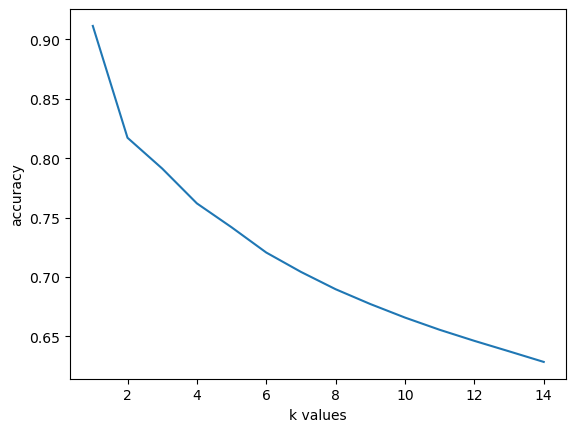

In [ ]:
# Finding k values in range(1,15)
score_list = []
for each in range(1,15):
    knn = KNeighborsClassifier(n_neighbors = each)
    knn.fit(X_train_2, y_training)
    score_list.append(knn.score(X_train_2, y_training))

plt.plot(range(1,15),score_list)
plt.xlabel("k values")
plt.ylabel("accuracy")
plt.show()

In [ ]:
# KNeighborsClassifier
# It took approximately 6 hours to train the model
params_knn = {'n_neighbors': list(range(2,10)),
         'weights': ['uniform', 'distance'],
         'leaf_size': list(range(10,20))
        }
knn2 = KNeighborsClassifier()
gs_knn2 = RandomizedSearchCV(knn2, param_distributions=params_knn, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)
gs_knn2.fit(X_train_2, y_training)
#See the best results:
# Best paramete set
print('Best parameters found:\n', gs_knn2.best_params_)
print('Best score found:\n', gs_knn2.best_score_)

Best parameters found:
 {'weights': 'distance', 'n_neighbors': 4, 'leaf_size': 16}
Best score found:
 0.68791346700599


In [ ]:
# Extract the results
results = gs_knn2.cv_results_

# Calculate mean and std for accuracy
accuracy_mean = results['mean_test_accuracy'].mean()
accuracy_std = results['std_test_accuracy'].mean()

# Calculate mean and std for weighted F1 score
f1_mean = results['mean_test_f1_weighted'].mean()
f1_std = results['std_test_f1_weighted'].mean()

# Calculate mean and std for macro F1 score
f1_macro_mean = results['mean_test_f1_macro'].mean()
f1_macro_std = results['std_test_f1_macro'].mean()


print(f"Accuracy: {accuracy_mean:.3f} ± {accuracy_std:.3f}")
print(f"F1 Score (weighted): {f1_mean:.3f} ± {f1_std:.3f}")
print(f"F1 Score (macro): {f1_macro_mean:.3f} ± {f1_macro_std:.3f}")

Accuracy: 0.688 ± 0.002
F1 Score (weighted): 0.686 ± 0.001
F1 Score (macro): 0.551 ± 0.002


In [ ]:
# best_knn2 = KNeighborsClassifier(n_neighbors=4, leaf_size = 16, weights = 'distance')
# best_knn2.fit(X_train_2, y_training)

best_knn2 = gs_knn2.best_estimator_
best_knn2

KNeighborsClassifier(leaf_size=16, n_neighbors=4, weights='distance')

In [ ]:
knn_pred2 = best_knn2.predict(X_test_2)
acc_knn2 = accuracy_score(knn_pred2, y_testing)
print('accuracy: %s' % acc_knn2)
f1_knn2 = f1_score(y_testing, knn_pred2, average='weighted')
print('f1 score: %s' % f1_knn2)
macro_f1_knn2 = f1_score(y_testing, knn_pred2, average='macro')

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, knn_pred2, target_names=labels))


accuracy: 0.7313130582576935
f1 score: 0.7288532843539131
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.81      0.61      0.69        28
    antibiotic hydrolase       0.43      0.50      0.46        26
  antibiotic transferase       0.35      0.35      0.35        20
   antimicrobial protein       0.41      0.41      0.41        37
               apoptosis       0.63      0.72      0.67       107
    biosynthetic protein       0.60      0.64      0.62        83
  biotin-binding protein       0.92      0.96      0.94        24
          blood clotting       0.59      0.67      0.63        67
 calcium-binding protein       0.33      0.54      0.41        24
           cell adhesion       0.67      0.63      0.65       287
              cell cycle       0.54      0.64      0.59       234
           cell invasion       0.71      0.48      0.57        21
               chap

In [ ]:
accuracy_list2 = []
f1_list2 = []
macro_f1_list2 = []

# accuracy_list2.append(acc_knn2)
# f1_list2.append(f1_knn2)
# macro_f1_list2.append(macro_f1_knn2)

accuracy_list2.append(0.73)
f1_list2.append(0.73)
macro_f1_list2.append(0.60)


In [ ]:
# confusion matrix
cm_knn2 = confusion_matrix(y_testing, knn_pred2)#.astype(int)
cm_df_knn2 = pd.DataFrame(cm_knn2, columns = labels, index = labels)
# cm_df_knn2

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_knn2 = confusion_matrix(y_testing, knn_pred2)#.astype(int)
sns.heatmap(cm_knn2, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
multi_cm_knn2 = multilabel_confusion_matrix(y_testing, knn_pred2, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_knn2

In [ ]:
# plotting confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_knn2):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### MultinomialNB

In [ ]:
# Naive Bayes Model
# It took approximately 2-3 hours to train the model
params_nb = {'alpha': [0.001, 0.01, 0.1, 0.5, 1.0],
        }
nb2 = MultinomialNB()
gs_nb2 = RandomizedSearchCV(nb2, param_distributions=params_nb, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)
gs_nb2.fit(X_train_2, y_training)
#See the best results:
# Best paramete set
print('Best parameters found:\n', gs_nb2.best_params_)
print('Best score found:\n', gs_nb2.best_score_)


Best parameters found:
 {'alpha': 0.001}
Best score found:
 0.2330301190823351


In [ ]:
# best_nb2 = MultinomialNB(alpha = 0.001)
# best_nb2.fit(X_train_2, y_training)

best_nb2 = gs_nb2.best_estimator_
best_nb2

MultinomialNB(alpha=0.001)

In [ ]:
NB_pred2 = best_nb2.predict(X_test_2)
acc_nb2 = accuracy_score(NB_pred2, y_testing)
print('accuracy: %s' % acc_nb2)
f1_nb2 = f1_score(y_testing, NB_pred2, average='weighted')
print('f1 score: %s' % f1_nb2)

# accuracy_list2.append(acc_nb2)
# f1_list2.append(f1_nb2)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, NB_pred2, target_names=labels))


accuracy: 0.24547065417857014
f1 score: 0.25613627288301
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.33      0.50      0.39        28
    antibiotic hydrolase       0.08      0.62      0.14        26
  antibiotic transferase       0.02      0.55      0.04        20
   antimicrobial protein       0.06      0.46      0.11        37
               apoptosis       0.40      0.37      0.38       107
    biosynthetic protein       0.02      0.08      0.03        83
  biotin-binding protein       0.74      0.83      0.78        24
          blood clotting       0.14      0.57      0.23        67
 calcium-binding protein       0.16      0.83      0.26        24
           cell adhesion       0.21      0.23      0.22       287
              cell cycle       0.18      0.18      0.18       234
           cell invasion       0.06      0.33      0.10        21
               chape

In [ ]:
accuracy_list2.append(0.25)
f1_list2.append(0.26)
macro_f1_list2.append(0.24)

In [ ]:
# confusion matrix
cm_nb2 = confusion_matrix(y_testing, NB_pred2)#.astype(int)
cm_df_nb2 = pd.DataFrame(cm_nb2, columns = labels, index = labels)
# cm_df_nb2

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_nb2 = confusion_matrix(y_testing, NB_pred2)#.astype(int)
sns.heatmap(cm_nb2, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
multi_cm_nb2 = multilabel_confusion_matrix(y_testing, NB_pred2, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_nb2

In [ ]:
# plotting confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_nb2):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### Logistic Regression

In [ ]:
# Logistic Regression Classifier
# It took approximately 7-8 hours to train the model
params_lr = {
    'penalty': ['l1', 'l2', 'elasticnet'],
    'C': [0.001, 0.01, 1.0, 5.0],
    'solver': ['lbfgs', 'newton-cg', 'sag', 'saga'],
}

logreg2 = LogisticRegression(max_iter=300, class_weight = 'balanced', random_state=random_seed, verbose = 1, n_jobs = -1)
gs_lr2 = RandomizedSearchCV(logreg2, param_distributions=params_lr, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)

gs_lr2.fit(X_train_2, y_training)
#See the best results:
# Best paramete set
print('Best parameters found:\n', gs_lr2.best_params_)
print('Best score found:\n', gs_lr2.best_score_)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed: 222.1min finished
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed: 225.8min finished
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed: 232.4min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Best parameters found:
 {'solver': 'newton-cg', 'penalty': 'l2', 'C': 1.0}
Best score found:
 0.32296035583744503


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed: 357.1min finished


In [ ]:
# best_lr2 = LogisticRegression(max_iter=300, solver = 'newton-cg', penalty = 'l2', class_weight = None, C = 1.0, random_state=random_seed, verbose = 1, n_jobs = -1)
# best_lr2.fit(X_train_2, y_training)
best_lr2 = gs_lr2.best_estimator_
best_lr2

LogisticRegression(class_weight='balanced', max_iter=300, n_jobs=-1,
                   random_state=42, solver='newton-cg', verbose=1)

In [ ]:
# lr_pred = gs_lr.predict(X_test_df)
lr_pred2 = best_lr2.predict(X_test_2)
acc_lr2 = accuracy_score(lr_pred2, y_testing)
print('accuracy: %s' % acc_lr2)
f1_lr2 = f1_score(y_testing, lr_pred2, average='weighted')
print('f1 score: %s' % f1_lr2)
macro_f1_lr2 = f1_score(y_testing, lr_pred2, average='macro')

# accuracy_list2.append(acc_lr2)
# f1_list2.append(f1_lr2)
# macro_f1_list2.append(macro_f1_lr2)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, lr_pred2, target_names=labels))


accuracy: 0.32199038079051095
f1 score: 0.32353729910035456
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.18      0.68      0.28        28
    antibiotic hydrolase       0.13      0.88      0.23        26
  antibiotic transferase       0.09      0.50      0.15        20
   antimicrobial protein       0.16      0.46      0.23        37
               apoptosis       0.18      0.61      0.27       107
    biosynthetic protein       0.05      0.34      0.09        83
  biotin-binding protein       0.73      1.00      0.84        24
          blood clotting       0.17      0.82      0.29        67
 calcium-binding protein       0.19      0.83      0.31        24
           cell adhesion       0.24      0.35      0.29       287
              cell cycle       0.28      0.37      0.32       234
           cell invasion       0.06      0.48      0.11        21
               ch

In [ ]:
accuracy_list2.append(0.32)
f1_list2.append(0.32)
macro_f1_list2.append(0.29)

In [ ]:
# confusion matrix
cm_lr2 = confusion_matrix(y_testing, lr_pred2)#.astype(int)
cm_df_lr2 = pd.DataFrame(cm_lr2, columns = labels, index = labels)
# cm_df_lr2

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_lr2 = confusion_matrix(y_testing, lr_pred2)#.astype(int)
sns.heatmap(cm_lr2, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()


In [ ]:
multi_cm_lr2 = multilabel_confusion_matrix(y_testing, lr_pred2, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_lr2

In [ ]:
# plotting confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_lr2):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### MLP Classifier

In [ ]:
# MLPClassifier
# It took approximately 6-7 hours to train the model
params_mlp = {
    'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,), (100,100,100)],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate': ['invscaling','constant','adaptive'],
}

mlp2 = MLPClassifier(max_iter=300, activation='relu', solver='adam', random_state=random_seed)
gs_mlp2 = RandomizedSearchCV(mlp2, param_distributions=params_mlp, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)

gs_mlp2.fit(X_train_2, y_training)

In [ ]:
# Best paramete set
print('Best parameters found:\n', gs_mlp2.best_params_)
print('Best score found:\n', gs_mlp2.best_score_)

Best parameters found:
 {'learning_rate': 'invscaling', 'hidden_layer_sizes': (100, 100, 100), 'alpha': 0.01}
Best score found:
 0.5976963765319283


In [ ]:
best_mlp2 = MLPClassifier(alpha = 0.01, hidden_layer_sizes = (100,100,100), max_iter=300, activation='relu', solver='adam', learning_rate = 'invscaling', random_state=random_seed)
best_mlp2.fit(X_train_2, y_training)

best_mlp2 = gs_mlp2.best_estimator_
best_mlp2

MLPClassifier(alpha=0.01, hidden_layer_sizes=(100, 100, 100),
              learning_rate='invscaling', max_iter=300, random_state=42)

In [ ]:
mlp_pred2 = best_mlp2.predict(X_test_2)
acc_mlp2 = accuracy_score(mlp_pred2, y_testing)
print('accuracy: %s' % acc_mlp2)
f1_mlp2 = f1_score(y_testing, mlp_pred2, average='weighted')
print('f1 score: %s' % f1_mlp2)
macro_f1_mlp2 = f1_score(y_testing, mlp_pred2, average='macro')

# accuracy_list2.append(acc_mlp2)
# f1_list2.append(f1_mlp2)
# macro_f1_list2.append(macro_f1_mlp2)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, mlp_pred2, target_names=labels))

accuracy: 0.6522619607275884
f1 score: 0.6483146097017917
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.58      0.39      0.47        28
    antibiotic hydrolase       0.54      0.27      0.36        26
  antibiotic transferase       0.29      0.30      0.29        20
   antimicrobial protein       0.46      0.32      0.38        37
               apoptosis       0.59      0.56      0.58       107
    biosynthetic protein       0.41      0.40      0.40        83
  biotin-binding protein       0.77      1.00      0.87        24
          blood clotting       0.47      0.57      0.52        67
 calcium-binding protein       0.32      0.29      0.30        24
           cell adhesion       0.50      0.52      0.51       287
              cell cycle       0.42      0.31      0.35       234
           cell invasion       0.33      0.24      0.28        21
               chap

In [ ]:
accuracy_list2.append(0.65)
f1_list2.append(0.65)
macro_f1_list2.append(0.49)

In [ ]:
# confusion matrix
cm_mlp2 = confusion_matrix(y_testing, mlp_pred2)#.astype(int)
cm_df_mlp2 = pd.DataFrame(cm_mlp2, columns = labels, index = labels)
# cm_df_mlp2

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_mlp2 = confusion_matrix(y_testing, mlp_pred2)#.astype(int)
sns.heatmap(cm_mlp2, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
multi_cm_mlp2 = multilabel_confusion_matrix(y_testing, mlp_pred2, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_mlp2

In [ ]:
# plotting confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_mlp2):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### Decision Tree Classifier

In [ ]:
#Decision Tree Classifier
# It took approximately 5-6 hours to train the model
params_dtc = {
    'criterion': ['gini', 'entropy', 'log_loss'],
    'splitter': ['best', 'random'],
}

dtc2 = DecisionTreeClassifier(min_samples_split=2, class_weight = 'balanced', random_state=random_seed)
gs_dtc2 = RandomizedSearchCV(dtc2, param_distributions=params_dtc, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)

gs_dtc2.fit(X_train_2, y_training)
# Best paramete set
print('Best parameters found:\n', gs_dtc2.best_params_)
print('Best score found:\n', gs_dtc2.best_score_)

Best parameters found:
 {'splitter': 'best', 'criterion': 'gini'}
Best score found:
 0.5773000627851818


In [ ]:
best_dtc2 = DecisionTreeClassifier(criterion = 'gini', splitter = 'best', min_samples_split = 2, class_weight = 'balanced', random_state=random_seed)
best_dtc2.fit(X_train_2, y_training)

best_dtc2 = gs_dtc2.best_estimator_
best_dtc2

DecisionTreeClassifier(class_weight='balanced', random_state=42)

In [ ]:
dtc_pred2 = best_dtc2.predict(X_test_2)
acc_dtc2 = accuracy_score(dtc_pred2, y_testing)
print('accuracy: %s' % acc_dtc2)
f1_dtc2 = f1_score(y_testing, dtc_pred2, average='weighted')
print('f1 score: %s' % f1_dtc2)
macro_f1_dtc2 = f1_score(y_testing, dtc_pred2, average='macro')

# accuracy_list2.append(acc_dtc2)
# f1_list2.append(f1_dtc2)
# macro_f1_list2.append(macro_f1_dtc2)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, dtc_pred2, target_names=labels))

accuracy: 0.65092395038513
f1 score: 0.654561322164834
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.64      0.50      0.56        28
    antibiotic hydrolase       0.25      0.65      0.36        26
  antibiotic transferase       0.21      0.40      0.27        20
   antimicrobial protein       0.61      0.46      0.52        37
               apoptosis       0.53      0.65      0.59       107
    biosynthetic protein       0.48      0.58      0.53        83
  biotin-binding protein       0.76      0.92      0.83        24
          blood clotting       0.32      0.76      0.45        67
 calcium-binding protein       0.25      0.71      0.37        24
           cell adhesion       0.56      0.49      0.53       287
              cell cycle       0.51      0.58      0.54       234
           cell invasion       0.30      0.29      0.29        21
               chapero

In [ ]:
accuracy_list2.append(0.65)
f1_list2.append(0.65)
macro_f1_list2.append(0.53)

In [ ]:
# confusion matrix
cm_dtc2 = confusion_matrix(y_testing, dtc_pred2)#.astype(int)
cm_df_dtc2 = pd.DataFrame(cm_dtc2, columns = labels, index = labels)
# cm_df_dtc2

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_dtc2 = confusion_matrix(y_testing, dtc_pred2)#.astype(int)
sns.heatmap(cm_dtc2, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
multi_cm_dtc2 = multilabel_confusion_matrix(y_testing, dtc_pred2, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_dtc2

In [ ]:
# plotting confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_dtc2):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### Random Forest Classifier

In [ ]:
#Random Forest Classifier
# It took approximately 5-6 hours to train the model
params_rfc = {
    'n_estimators': [10,20,30,40,50,100],
    'criterion': ['gini', 'entropy'],

}

rfc2 = RandomForestClassifier(min_samples_split = 2, class_weight = 'balanced', verbose = 1, random_state=random_seed)
gs_rfc2 = RandomizedSearchCV(rfc2, param_distributions=params_rfc, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)

gs_rfc2.fit(X_train_2, y_training)
# Best paramete set
print('Best parameters found:\n', gs_rfc2.best_params_)
print('Best score found:\n', gs_rfc2.best_score_)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   30.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:   30.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapse

[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  5.7min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    4.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed:  2.1min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  5.6min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  5.5min finished
[Parallel(n_jobs=1)]: Us

Best parameters found:
 {'n_estimators': 100, 'criterion': 'entropy'}
Best score found:
 0.6471322714998469


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  4.8min finished


In [ ]:
# Best paramete set
print('Best parameters found:\n', gs_rfc2.best_params_)
print('Best score found:\n', gs_rfc2.best_score_)

Best parameters found:
 {'n_estimators': 100, 'criterion': 'entropy'}
Best score found:
 0.6471322714998469


In [ ]:
# best_rfc2 = RandomForestClassifier(n_estimators = 100, min_samples_split = 2, criterion = 'entropy', verbose = 1, class_weight = 'balanced', random_state=random_seed, n_jobs = -1)
# best_rfc2.fit(X_train_2, y_training)

best_rfc2 = gs_rfc2.best_estimator_
best_rfc2

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  5.7min finished


RandomForestClassifier(class_weight='balanced', criterion='entropy', n_jobs=-1,
                       random_state=42, verbose=1)

In [ ]:
rfc_pred2 = best_rfc2.predict(X_test_2)
acc_rfc2 = accuracy_score(rfc_pred2, y_testing)
print('accuracy: %s' % acc_rfc2)
f1_rfc2 = f1_score(y_testing, rfc_pred2, average='weighted')
print('f1 score: %s' % f1_rfc2)
macro_f1_rfc2 = f1_score(y_testing, rfc_pred2, average='macro')

# accuracy_list2.append(acc_rfc2)
# f1_list2.append(f1_rfc2)
# macro_f1_list2.append(macro_f1_rfc2)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, rfc_pred2, target_names=labels))

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.6s


accuracy: 0.7061439988428019
f1 score: 0.7061677294995634
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.89      0.61      0.72        28
    antibiotic hydrolase       0.29      0.69      0.40        26
  antibiotic transferase       0.24      0.45      0.31        20
   antimicrobial protein       0.74      0.38      0.50        37
               apoptosis       0.74      0.68      0.71       107
    biosynthetic protein       0.75      0.63      0.68        83
  biotin-binding protein       0.82      0.96      0.88        24
          blood clotting       0.40      0.76      0.53        67
 calcium-binding protein       0.45      0.75      0.56        24
           cell adhesion       0.85      0.55      0.67       287
              cell cycle       0.69      0.61      0.64       234
           cell invasion       0.89      0.38      0.53        21
               chap

[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    1.4s finished


In [ ]:
accuracy_list2.append(0.71)
f1_list2.append(0.71)
macro_f1_list2.append(0.63)

In [ ]:
# confusion matrix
cm_rfc2 = confusion_matrix(y_testing, rfc_pred2)#.astype(int)
cm_df_rfc2 = pd.DataFrame(cm_rfc2, columns = labels, index = labels)
# cm_df_rfc2

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_rfc2 = confusion_matrix(y_testing, rfc_pred2)#.astype(int)
sns.heatmap(cm_rfc2, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
multi_cm_rfc2 = multilabel_confusion_matrix(y_testing, rfc_pred2, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_rfc2

In [ ]:
# plotting confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_rfc2):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### XGBoost Classifier

In [ ]:
#XGBoost Classifier
# It took approximately 5-6 hours to train the model
params_xgb = {
    'n_estimators': [100,200,300, 400,500],
    'max_depth': [3, 5, 7],  # maximum depth for each tree
    'learning_rate':[0.001, 0.01, 0.1]
}

xgb2 = XGBClassifier(booster = 'gbtree', gamma = 0.1, tree_method = 'hist', random_state=random_seed)
gs_xgb2 = RandomizedSearchCV(xgb2, param_distributions=params_xgb, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)

gs_xgb2.fit(X_train_2, y_training)

RandomizedSearchCV(cv=3,
                   estimator=XGBClassifier(base_score=None, booster='gbtree',
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric=None, feature_types=None,
                                           gamma=0.1, gpu_id=None,
                                           grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning_r...
                                           n_estimators=100, n_jobs=None,
                                           num_parallel_tree=None,
                                           predictor=None, random_state=42, ...),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'learning_rate': [0.1],
                                        'max_depth': [7],
                                        'n_estimators': [500]},
                   random_state=42, refit='accuracy', return_train_score=True,
                   scoring={'accuracy': 'accuracy',
                            'f1_macro': make_scorer(f1_score, average=macro),
                            'f1_weighted': make_scorer(f1_score, average=weighted)})

In [ ]:
# Best paramete set
print('Best parameters found:\n', gs_xgb2.best_params_)
print('Best score found:\n', gs_xgb2.best_score_)

Best parameters found:
 {'n_estimators': 500, 'max_depth': 7, 'learning_rate': 0.1}
Best score found:
 0.6916497973927727


In [ ]:
# Extract the results
results = gs_xgb2.cv_results_

# Calculate mean and std for accuracy
accuracy_mean = results['mean_test_accuracy'].mean()
accuracy_std = results['std_test_accuracy'].mean()

# Calculate mean and std for weighted F1 score
f1_mean = results['mean_test_f1_weighted'].mean()
f1_std = results['std_test_f1_weighted'].mean()

# Calculate mean and std for macro F1 score
f1_macro_mean = results['mean_test_f1_macro'].mean()
f1_macro_std = results['std_test_f1_macro'].mean()


print(f"Accuracy: {accuracy_mean:.3f} ± {accuracy_std:.3f}")
print(f"F1 Score (weighted): {f1_mean:.3f} ± {f1_std:.3f}")
print(f"F1 Score (macro): {f1_macro_mean:.3f} ± {f1_macro_std:.3f}")

Accuracy: 0.692 ± 0.002
F1 Score (weighted): 0.685 ± 0.002
F1 Score (macro): 0.591 ± 0.002


In [ ]:
# best_xgb2 = XGBClassifier(booster = 'gbtree', n_estimators = 500, gamma = 0.1, max_depth = 7, tree_method = 'hist', learning_rate = 0.1, random_state=random_seed, n_jobs = -1)
# best_xgb2.fit(X_train_2, y_training)
best_xgb2 = gs_xgb2.best_estimator_
best_xgb2

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=500, n_jobs=-1, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [ ]:
xgb_pred2 = best_xgb2.predict(X_test_2)
acc_xgb2 = accuracy_score(xgb_pred2, y_testing)
print('accuracy: %s' % acc_xgb2)
f1_xgb2 = f1_score(y_testing, xgb_pred2, average='weighted')
print('f1 score: %s' % f1_xgb2)
macro_f1_xgb2 = f1_score(y_testing, xgb_pred2, average='macro')

# accuracy_list2.append(acc_xgb2)
# f1_list2.append(f1_xgb2)
# macro_f1_list2.append(macro_f1_xgb2)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, xgb_pred2, target_names=labels))

accuracy: 0.732723393483528
f1 score: 0.7276600535810414
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.88      0.54      0.67        28
    antibiotic hydrolase       0.65      0.42      0.51        26
  antibiotic transferase       0.55      0.30      0.39        20
   antimicrobial protein       0.88      0.41      0.56        37
               apoptosis       0.84      0.68      0.75       107
    biosynthetic protein       0.79      0.59      0.68        83
  biotin-binding protein       0.88      0.96      0.92        24
          blood clotting       0.71      0.60      0.65        67
 calcium-binding protein       0.61      0.46      0.52        24
           cell adhesion       0.82      0.56      0.67       287
              cell cycle       0.69      0.58      0.63       234
           cell invasion       1.00      0.24      0.38        21
               chape

In [ ]:
accuracy_list2.append(0.73)
f1_list2.append(0.73)

macro_f1_list2.append(0.64)

In [ ]:
# save the classification report into .csv format
# xgb2_report = classification_report(y_testing, xgb_pred2, target_names=labels, output_dict=True)
# xgb2_report.update({"accuracy": {"precision": None, "recall": None, "f1-score": xgb2_report["accuracy"], "support": xgb2_report['macro avg']['support']}})

# xgb2_df = pd.DataFrame(xgb2_report).transpose()
# xgb2_df.to_csv('xgb2_report.csv', index = False)

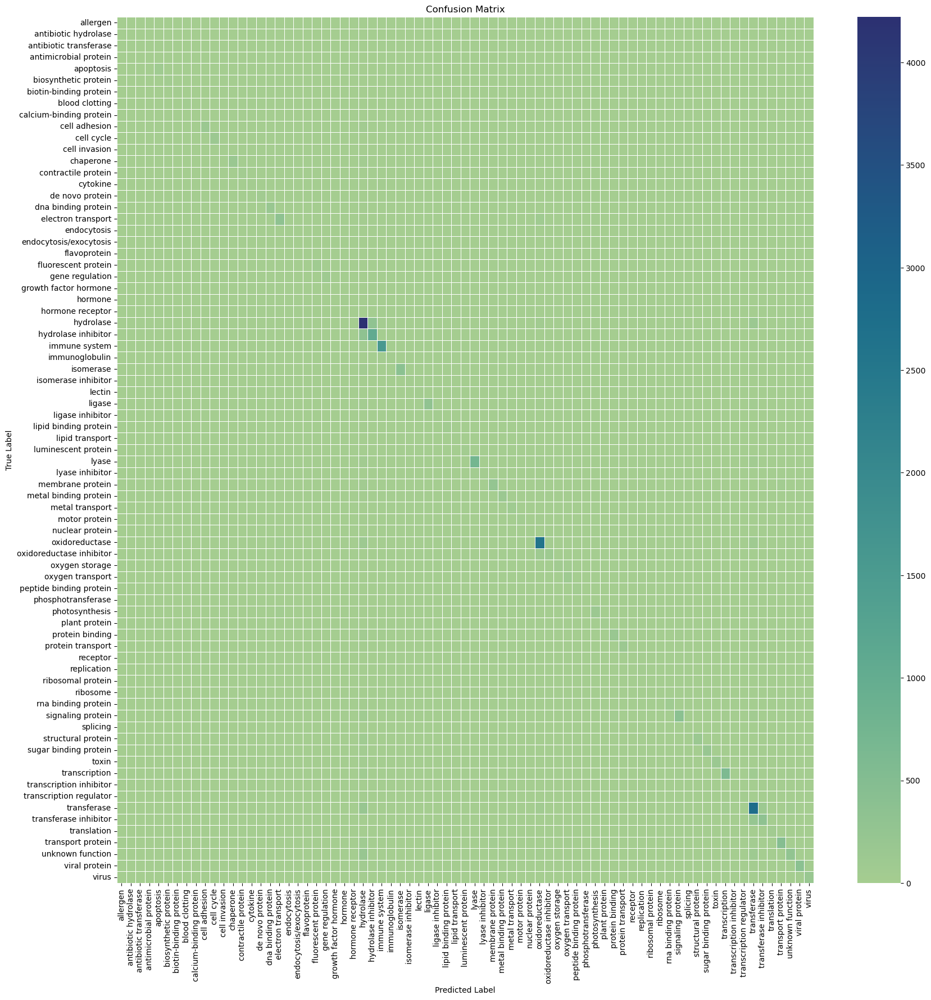

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_xgb2 = confusion_matrix(y_testing, xgb_pred2)#.astype(int)
sns.heatmap(cm_xgb2, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_xgb2 = confusion_matrix(y_testing, xgb_pred2)#.astype(int)
cm_df_xgb2 = pd.DataFrame(cm_xgb2, columns = labels, index = labels)
cm_df_xgb2

,allergen,antibiotic hydrolase,antibiotic transferase,antimicrobial protein,apoptosis,biosynthetic protein,biotin-binding protein,blood clotting,calcium-binding protein,cell adhesion,...,transcription,transcription inhibitor,transcription regulator,transferase,transferase inhibitor,translation,transport protein,unknown function,viral protein,virus
allergen,15,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,2,0,0
antibiotic hydrolase,0,11,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
antibiotic transferase,0,0,6,0,0,0,0,0,0,0,...,0,0,0,13,0,0,0,1,0,0
antimicrobial protein,0,0,0,15,0,0,0,0,0,0,...,3,0,0,1,0,0,1,1,0,0
apoptosis,0,0,0,0,73,0,0,0,0,0,...,4,0,0,5,0,0,0,3,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
translation,0,0,0,0,0,1,0,0,0,0,...,2,0,0,11,0,63,0,4,0,0
transport protein,0,0,0,1,0,0,0,0,0,3,...,9,0,0,40,0,1,467,9,1,0
unknown function,0,0,0,0,1,0,1,0,0,1,...,25,0,1,112,0,0,5,293,2,0
viral protein,0,0,0,0,0,0,0,0,0,0,...,4,0,0,18,0,0,3,4,381,21


In [ ]:
multi_cm_xgb2 = multilabel_confusion_matrix(y_testing, xgb_pred2, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
multi_cm_xgb2

array([[[27623,     2],
        [   13,    15]],

       [[27621,     6],
        [   15,    11]],

       [[27628,     5],
        [   14,     6]],

       [[27614,     2],
        [   22,    15]],

       [[27532,    14],
        [   34,    73]],

       [[27557,    13],
        [   34,    49]],

       [[27626,     3],
        [    1,    23]],

       [[27570,    16],
        [   27,    40]],

       [[27622,     7],
        [   13,    11]],

       [[27331,    35],
        [  125,   162]],

       [[27359,    60],
        [   99,   135]],

       [[27632,     0],
        [   16,     5]],

       [[27371,    14],
        [   91,   177]],

       [[27570,     4],
        [   32,    47]],

       [[27575,    16],
        [   34,    28]],

       [[27543,    12],
        [   37,    61]],

       [[27300,    49],
        [  120,   184]],

       [[27063,   109],
        [  136,   345]],

       [[27623,     4],
        [   10,    16]],

       [[27617,     8],
        [   12,    16]],



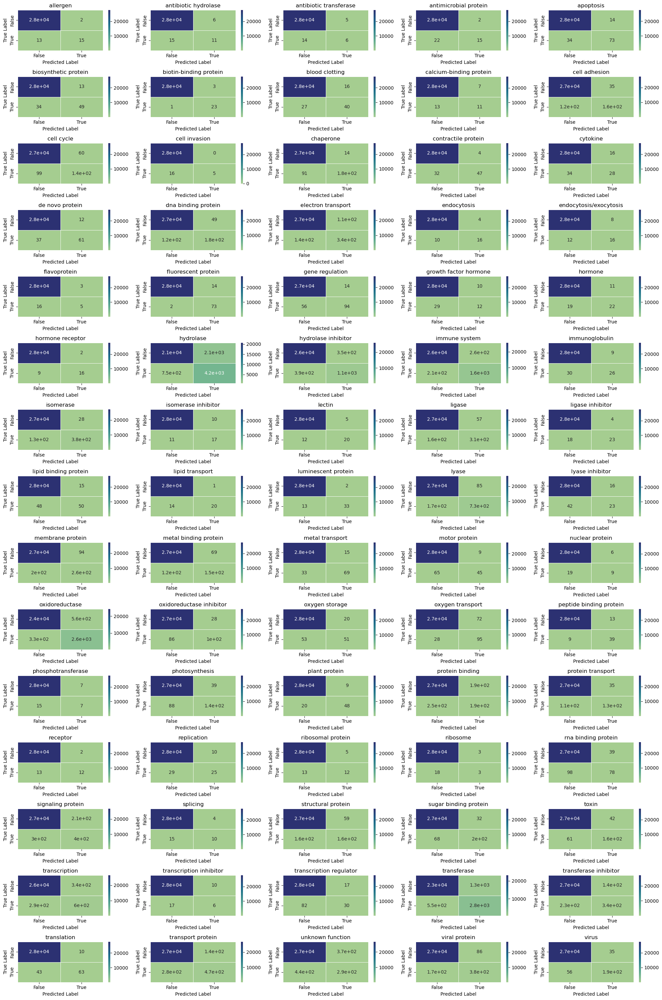

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_xgb2):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### Voting Classifier

In [ ]:
# group / ensemble of models
estimator2 = []
estimator2.append(('RFC', RandomForestClassifier(n_estimators = 100, min_samples_split = 2, criterion = 'entropy', verbose = 1, class_weight = 'balanced', random_state=random_seed, n_jobs = -1)))
estimator2.append(('KNN', KNeighborsClassifier(n_neighbors=4, leaf_size = 16, weights = 'distance', n_jobs = -1)))
estimator2.append(('XGB', XGBClassifier(booster = 'gbtree', n_estimators = 500, gamma = 0.1, max_depth = 7, tree_method = 'hist', learning_rate = 0.1, random_state=random_seed, n_jobs = -1)))

In [ ]:
# Voting Classifier with soft voting
# It took approximately 5-6 hours to train the model
vot_soft2 = VotingClassifier(estimators = estimator2, voting ='soft', n_jobs = -1)
vot_soft2.fit(X_train_2, y_training)
vots_pred2 = vot_soft2.predict(X_test_2)

# using accuracy_score metric to predict accuracy and f1_score to predict f1 score
acc_vots2 = accuracy_score(y_testing, vots_pred2)
print("Hard Voting Score % s" % acc_vots2)
f1_vots2 = f1_score(y_testing, vots_pred2, average='weighted')
print('f1 score weighted: %s' % f1_vots2)
macro_f1_vots2 = f1_score(y_testing, vots_pred2, average='macro')

# accuracy_list2.append(acc_vots2)
# f1_list2.append(f1_vots2)
# macro_f1_list2.append(macro_f1_vots2)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, vots_pred2, target_names=labels))

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  2.4min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  6.2min finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.4s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    1.0s finished


Hard Voting Score 0.7431743391313782
f1 score weighted: 0.7395061468595918
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.90      0.68      0.78        28
    antibiotic hydrolase       0.48      0.50      0.49        26
  antibiotic transferase       0.37      0.35      0.36        20
   antimicrobial protein       0.70      0.43      0.53        37
               apoptosis       0.73      0.72      0.72       107
    biosynthetic protein       0.75      0.64      0.69        83
  biotin-binding protein       0.92      0.96      0.94        24
          blood clotting       0.67      0.66      0.66        67
 calcium-binding protein       0.56      0.58      0.57        24
           cell adhesion       0.77      0.61      0.68       287
              cell cycle       0.66      0.60      0.63       234
           cell invasion       0.89      0.38      0.53        21
  

In [ ]:
accuracy_list2.append(0.74)
f1_list2.append(0.74)

macro_f1_list2.append(0.64)

In [ ]:
# save the classification report into .csv format
# vots2_report = classification_report(y_testing, vots_pred2, target_names=labels, output_dict=True)
# vots2_report.update({"accuracy": {"precision": None, "recall": None, "f1-score": vots2_report["accuracy"], "support": vots2_report['macro avg']['support']}})

# vots2_df = pd.DataFrame(vots2_report).transpose()
# vots2_df.to_csv('vots2_report.csv', index = False)

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_vots2 = confusion_matrix(y_testing, vots_pred2)#.astype(int)
sns.heatmap(cm_vots2, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_vots2 = confusion_matrix(y_testing, vots_pred2)#.astype(int)
cm_df_vots2 = pd.DataFrame(cm_vots2, columns = labels, index = labels)
# cm_df_vots2

In [ ]:
multi_cm_vots2 = multilabel_confusion_matrix(y_testing, vots_pred2, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_vots2

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_vots2):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### Stacking Classifier

In [ ]:
# It took approximately 5-6 hours to train the model
meta_model2 = StackingClassifier(
    estimators=[
        ('KNN', KNeighborsClassifier(n_neighbors=4, leaf_size = 16, weights = 'distance', n_jobs = -1)),
        ('RFC', RandomForestClassifier(n_estimators = 100, min_samples_split = 2, criterion = 'entropy', verbose = 1, class_weight = 'balanced', random_state=random_seed, n_jobs = -1)),
        ('XGB', XGBClassifier(booster = 'gbtree', n_estimators = 500, gamma = 0.1, max_depth = 7, tree_method = 'hist', learning_rate = 0.1, random_state=random_seed, n_jobs = -1))
    ],
    final_estimator=XGBClassifier(booster = 'gbtree', n_estimators = 500, gamma = 0.1, max_depth = 7, tree_method = 'hist', learning_rate = 0.1, random_state=random_seed, n_jobs = -1), # LogisticRegression(solver = 'newton-cg', penalty = 'l2', class_weight = 'balanced', C = 1.0, random_state=random_seed, verbose = 1, n_jobs = -1)
    stack_method = 'auto',
    cv = 3,
    n_jobs = -1
)
meta_model2.fit(X_train_2, y_training)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  6.3min finished
[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 24.8min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 24.8min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.7s finished
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.4s finished
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 24.9min finished
[Parallel(n_jobs=1)]: Usi

StackingClassifier(cv=3,
                   estimators=[('KNN',
                                KNeighborsClassifier(leaf_size=16, n_jobs=-1,
                                                     n_neighbors=4,
                                                     weights='distance')),
                               ('RFC',
                                RandomForestClassifier(class_weight='balanced',
                                                       criterion='entropy',
                                                       n_jobs=-1,
                                                       random_state=42,
                                                       verbose=1)),
                               ('XGB',
                                XGBClassifier(base_score=None, booster='gbtree',
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              co...
                                                 gpu_id=None, grow_policy=None,
                                                 importance_type=None,
                                                 interaction_constraints=None,
                                                 learning_rate=0.1,
                                                 max_bin=None,
                                                 max_cat_threshold=None,
                                                 max_cat_to_onehot=None,
                                                 max_delta_step=None,
                                                 max_depth=7, max_leaves=None,
                                                 min_child_weight=None,
                                                 missing=nan,
                                                 monotone_constraints=None,
                                                 n_estimators=500, n_jobs=-1,
                                                 num_parallel_tree=None,
                                                 predictor=None,
                                                 random_state=42, ...),
                   n_jobs=-1)

In [ ]:
meta_pred2 = meta_model2.predict(X_test_2)
# using accuracy_score
acc_meta2 = accuracy_score(y_testing, meta_pred2)
print("Accuracy Score: %s" % acc_meta2)
f1_meta2 = f1_score(y_testing, meta_pred2, average='weighted')
print('f1 score weighted: %s' % f1_meta2)
macro_f1_meta2 = f1_score(y_testing, meta_pred2, average='macro')

# accuracy_list2.append(acc_meta2)
# f1_list2.append(f1_meta2)
# macro_f1_list2.append(macro_f1_meta2)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, meta_pred2, target_names=labels))

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.3s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    1.0s finished


Accuracy Score: 0.745344085632662
f1 score weighted: 0.7423332276409087
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.90      0.64      0.75        28
    antibiotic hydrolase       0.73      0.31      0.43        26
  antibiotic transferase       0.60      0.15      0.24        20
   antimicrobial protein       0.70      0.43      0.53        37
               apoptosis       0.85      0.69      0.76       107
    biosynthetic protein       0.79      0.58      0.67        83
  biotin-binding protein       0.85      0.92      0.88        24
          blood clotting       0.72      0.66      0.69        67
 calcium-binding protein       0.58      0.46      0.51        24
           cell adhesion       0.71      0.63      0.67       287
              cell cycle       0.66      0.58      0.62       234
           cell invasion       0.86      0.29      0.43        21
     

In [ ]:
accuracy_list2.append(0.75)
f1_list2.append(0.74)

macro_f1_list2.append(0.62)

In [ ]:
# save the classification report into .csv format
# meta2_report = classification_report(y_testing, meta_pred2, target_names=labels, output_dict=True)
# meta2_report.update({"accuracy": {"precision": None, "recall": None, "f1-score": meta2_report["accuracy"], "support": meta2_report['macro avg']['support']}})

# meta2_df = pd.DataFrame(meta2_report).transpose()
# meta2_df.to_csv('meta2_report.csv', index = False)

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_meta2 = confusion_matrix(y_testing, meta_pred2)#.astype(int)
sns.heatmap(cm_meta2, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_meta2 = confusion_matrix(y_testing, meta_pred2)#.astype(int)
cm_df_meta2 = pd.DataFrame(cm_meta2, columns = labels, index = labels)
# cm_df_meta2

In [ ]:
multi_cm_meta2 = multilabel_confusion_matrix(y_testing, meta_pred2, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_meta2

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_meta2):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

#### USING 3-GRAMS

In [ ]:
# Create a Count Vectorizer to gather the unique elements in sequence
vect_3 = CountVectorizer(analyzer = 'char', ngram_range = (3,3))      # using 3-grams

# Fit and Transform CountVectorizer
vect_3.fit(X_training)
X_train_3 = vect_3.transform(X_training)
X_test_3 = vect_3.transform(X_testing)


In [ ]:
X_train_3[0]

<1x8000 sparse matrix of type '<class 'numpy.int64'>'
	with 275 stored elements in Compressed Sparse Row format>

In [ ]:
X_train_3[0].todense()

matrix([[0, 0, 0, ..., 0, 0, 0]])

In [ ]:
vect_3.get_feature_names_out()

array(['aaa', 'aac', 'aad', ..., 'yyv', 'yyw', 'yyy'], dtype=object)

##### KNeighborsClassifier

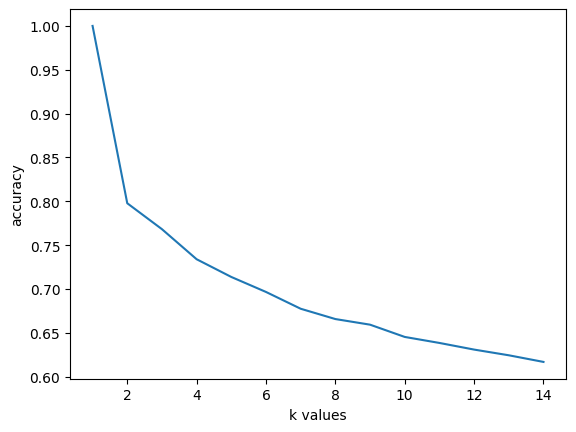

In [ ]:
# Findind k values in range(1,15)
score_list = []
for each in range(1,15):
    knn = KNeighborsClassifier(n_neighbors = each)
    knn.fit(X_train_3, y_training)
    score_list.append(knn.score(X_train_3, y_training))

plt.plot(range(1,15),score_list)
plt.xlabel("k values")
plt.ylabel("accuracy")
plt.show()

In [ ]:
# KNeighborsClassifier
# It took approximately 9-10 hours to train the model
params_knn = {'n_neighbors': list(range(2,10)),
         'weights': ['uniform', 'distance'],
         'leaf_size': list(range(10,20))
        }

knn3 = KNeighborsClassifier()
gs_knn3 = RandomizedSearchCV(knn3, param_distributions=params_knn, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)
gs_knn3.fit(X_train_3, y_training)

RandomizedSearchCV(cv=3, estimator=KNeighborsClassifier(), n_iter=50, n_jobs=-1,
                   param_distributions={'leaf_size': [13], 'n_neighbors': [3],
                                        'weights': ['distance']},
                   random_state=42, refit='accuracy', return_train_score=True,
                   scoring={'accuracy': 'accuracy',
                            'f1_macro': make_scorer(f1_score, average=macro),
                            'f1_weighted': make_scorer(f1_score, average=weighted)})

In [ ]:
print('Best parameters found:\n', gs_knn3.best_params_)
print('Best score found:\n', gs_knn3.best_score_)

Best parameters found:
 {'weights': 'distance', 'n_neighbors': 3, 'leaf_size': 13}
Best score found:
 0.6517250277936547


In [ ]:
# Extract the results
results = gs_knn3.cv_results_

# Calculate mean and std for accuracy
accuracy_mean = results['mean_test_accuracy'].mean()
accuracy_std = results['std_test_accuracy'].mean()

# Calculate mean and std for weighted F1 score
f1_mean = results['mean_test_f1_weighted'].mean()
f1_std = results['std_test_f1_weighted'].mean()

# Calculate mean and std for macro F1 score
f1_macro_mean = results['mean_test_f1_macro'].mean()
f1_macro_std = results['std_test_f1_macro'].mean()


print(f"Accuracy: {accuracy_mean:.3f} ± {accuracy_std:.3f}")
print(f"F1 Score (weighted): {f1_mean:.3f} ± {f1_std:.3f}")
print(f"F1 Score (macro): {f1_macro_mean:.3f} ± {f1_macro_std:.3f}")

Accuracy: 0.652 ± 0.003
F1 Score (weighted): 0.687 ± 0.018
F1 Score (macro): 0.583 ± 0.002


In [ ]:
# best_knn3 = KNeighborsClassifier(n_neighbors=3, leaf_size = 13, weights = 'distance')
# best_knn3.fit(X_train_3, y_training)

best_knn3 = gs_knn3.best_estimator_
best_knn3

KNeighborsClassifier(leaf_size=13, n_neighbors=3, weights='distance')

In [ ]:
knn_pred3 = best_knn3.predict(X_test_3)
acc_knn3 = accuracy_score(knn_pred3, y_testing)
print('accuracy: %s' % acc_knn3)
f1_knn3 = f1_score(y_testing, knn_pred3, average='weighted')
print('f1 score: %s' % f1_knn3)
macro_f1_knn3 = f1_score(y_testing, knn_pred3, average='macro')

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, knn_pred3, target_names=labels))

accuracy: 0.7008281199146567
f1 score: 0.7364328536254752
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.90      0.68      0.78        28
    antibiotic hydrolase       0.44      0.42      0.43        26
  antibiotic transferase       0.29      0.30      0.29        20
   antimicrobial protein       0.59      0.35      0.44        37
               apoptosis       0.78      0.72      0.75       107
    biosynthetic protein       0.75      0.61      0.68        83
  biotin-binding protein       0.92      0.96      0.94        24
          blood clotting       0.52      0.69      0.59        67
 calcium-binding protein       0.47      0.58      0.52        24
           cell adhesion       0.84      0.61      0.71       287
              cell cycle       0.65      0.64      0.64       234
           cell invasion       0.89      0.38      0.53        21
               chap

In [ ]:
accuracy_list3 = []
f1_list3 = []
macro_f1_list3 = []

# accuracy_list3.append(acc_knn3)
# f1_list3.append(f1_knn3)
# macro_f1_list3.append(macro_f1_knn3)

accuracy_list3.append(0.70)
f1_list3.append(0.74)
macro_f1_list3.append(0.63)

In [ ]:
# confusion matrix
cm_knn3 = confusion_matrix(y_testing, knn_pred3)#.astype(int)
cm_df_knn3 = pd.DataFrame(cm_knn3, columns = labels, index = labels)
cm_df_knn3

,allergen,antibiotic hydrolase,antibiotic transferase,antimicrobial protein,apoptosis,biosynthetic protein,biotin-binding protein,blood clotting,calcium-binding protein,cell adhesion,...,transcription,transcription inhibitor,transcription regulator,transferase,transferase inhibitor,translation,transport protein,unknown function,viral protein,virus
allergen,19,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
antibiotic hydrolase,0,11,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,1,0,0
antibiotic transferase,0,0,6,0,0,0,0,0,0,0,...,1,2,0,10,0,0,0,0,0,0
antimicrobial protein,0,0,0,13,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
apoptosis,0,0,0,0,77,0,0,0,0,0,...,1,0,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
translation,0,0,0,0,0,2,0,0,0,0,...,0,0,0,0,0,67,0,0,0,0
transport protein,0,0,0,1,0,0,0,0,0,2,...,4,0,0,0,0,1,456,1,1,0
unknown function,0,0,1,0,1,0,1,0,0,1,...,16,0,1,7,0,0,2,170,1,0
viral protein,0,0,0,0,0,0,0,0,0,0,...,3,0,1,6,1,0,0,0,399,16


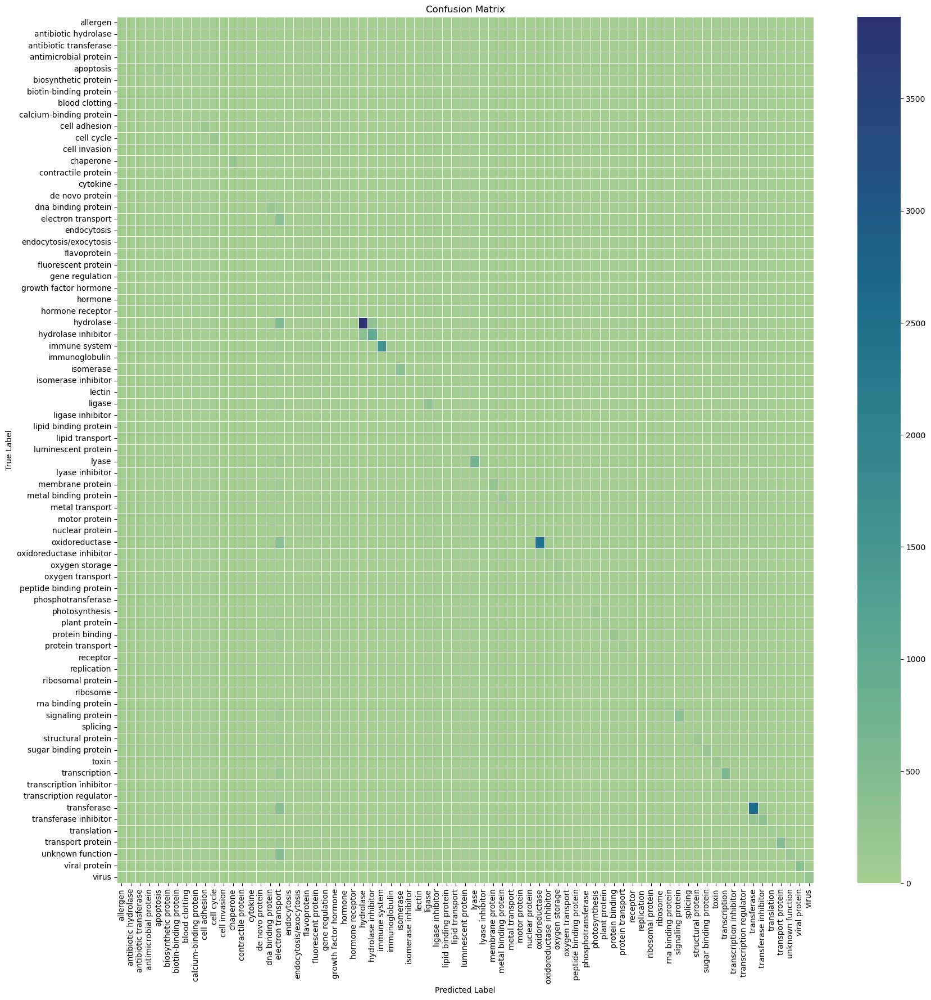

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_knn3 = confusion_matrix(y_testing, knn_pred3)#.astype(int)
sns.heatmap(cm_knn3, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
multi_cm_knn3 = multilabel_confusion_matrix(y_testing, knn_pred3, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
multi_cm_knn3

array([[[27623,     2],
        [    9,    19]],

       [[27613,    14],
        [   15,    11]],

       [[27618,    15],
        [   14,     6]],

       [[27607,     9],
        [   24,    13]],

       [[27524,    22],
        [   30,    77]],

       [[27553,    17],
        [   32,    51]],

       [[27627,     2],
        [    1,    23]],

       [[27544,    42],
        [   21,    46]],

       [[27613,    16],
        [   10,    14]],

       [[27333,    33],
        [  111,   176]],

       [[27338,    81],
        [   85,   149]],

       [[27631,     1],
        [   13,     8]],

       [[27366,    19],
        [   85,   183]],

       [[27565,     9],
        [   33,    46]],

       [[27568,    23],
        [   33,    29]],

       [[27522,    33],
        [   42,    56]],

       [[27313,    36],
        [  117,   187]],

       [[23308,  3864],
        [  107,   374]],

       [[27622,     5],
        [   10,    16]],

       [[27613,    12],
        [   12,    16]],



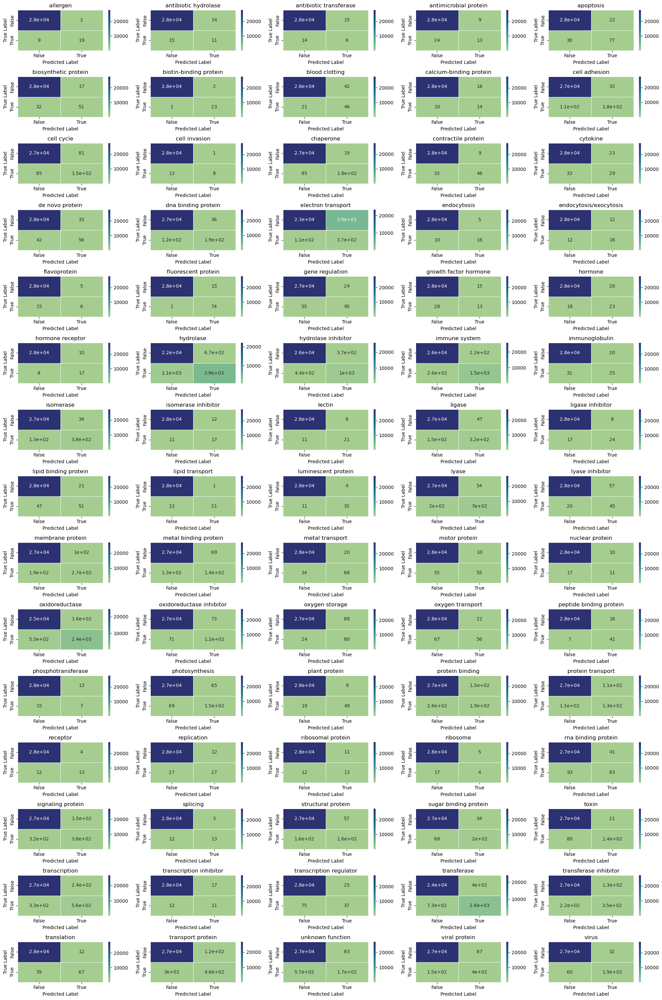

In [ ]:
# plotting confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_knn3):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### MultinomialNB

In [ ]:
# Naive Bayes Model
# It took approximately 7-8 hours to train the model
params_nb = {'alpha': [0.001, 0.01, 0.1, 0.5, 1.0],
        }
nb3 = MultinomialNB()
gs_nb3 = RandomizedSearchCV(nb3, param_distributions=params_nb, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)
gs_nb3.fit(X_train_3, y_training)
#See the best results:
# Best paramete set
print('Best parameters found:\n', gs_nb3.best_params_)
print('Best score found:\n', gs_nb3.best_score_)

Best parameters found:
 {'alpha': 0.001}
Best score found:
 0.42871226028324516


In [ ]:
# Naive Bayes Model
# best_nb3 = MultinomialNB(alpha = 0.001)
# best_nb3.fit(X_train_3, y_training)

best_nb3 = gs_nb3.best_estimator_
best_nb3

MultinomialNB(alpha=0.001)

In [ ]:
NB_pred3 = best_nb3.predict(X_test_3)
acc_nb3 = accuracy_score(NB_pred3, y_testing)
print('accuracy: %s' % acc_nb3)
f1_nb3 = f1_score(y_testing, NB_pred3, average='weighted')
print('f1 score: %s' % f1_nb3)
macro_f1_nb3 = f1_score(y_testing, NB_pred3, average='macro')

# accuracy_list3.append(acc_nb3)
# f1_list3.append(f1_nb3)
# macro_f1_list3.append(macro_f1_nb3)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, NB_pred3, target_names=labels))


accuracy: 0.46479586301667086
f1 score: 0.48029418233230425
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.89      0.61      0.72        28
    antibiotic hydrolase       0.21      0.85      0.33        26
  antibiotic transferase       0.21      0.50      0.29        20
   antimicrobial protein       0.75      0.41      0.53        37
               apoptosis       0.69      0.58      0.63       107
    biosynthetic protein       0.35      0.41      0.38        83
  biotin-binding protein       0.71      0.92      0.80        24
          blood clotting       0.21      0.67      0.32        67
 calcium-binding protein       0.24      0.83      0.37        24
           cell adhesion       0.38      0.58      0.46       287
              cell cycle       0.54      0.36      0.43       234
           cell invasion       0.56      0.48      0.51        21
               ch

In [ ]:
accuracy_list3.append(0.46)
f1_list3.append(0.48)
macro_f1_list3.append(0.47)

In [ ]:
# confusion matrix
cm_nb3 = confusion_matrix(y_testing, NB_pred3)#.astype(int)
cm_df_nb3 = pd.DataFrame(cm_nb3, columns = labels, index = labels)
# cm_df_nb3

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_nb3 = confusion_matrix(y_testing, NB_pred3)#.astype(int)
sns.heatmap(cm_nb3, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
multi_cm_nb3 = multilabel_confusion_matrix(y_testing, NB_pred3, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_nb3

In [ ]:
# plotting confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()

for i, cm in enumerate(multi_cm_nb3):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### Logistic Regression

In [ ]:
# Logistic Regression Classifier
# It took approximately 7-8 hours to train the model
params_lr = {
    'penalty': ['l1', 'l2', 'elasticnet'],
    'C': [0.001, 0.01, 1.0, 5.0],
    'solver': ['lbfgs', 'newton-cg', 'sag', 'saga'],

}

logreg3 = LogisticRegression(penalty = 'l2', max_iter=300, class_weight = 'balanced', random_state=random_seed, verbose = 1, n_jobs = -1)
gs_lr3 = RandomizedSearchCV(logreg3, param_distributions=params_lr, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)

gs_lr3.fit(X_train_3, y_training)
#See the best results:
# Best paramete set
print('Best parameters found:\n', gs_lr3.best_params_)
print('Best score found:\n', gs_lr3.best_score_)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed: 101.2min finished
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed: 107.3min finished
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed: 113.1min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.


Best parameters found:
 {'solver': 'newton-cg', 'penalty': 'l2', 'C': 1.0}
Best score found:
 0.6341042500222206


[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed: 103.2min finished


In [ ]:
# best_lr3 = LogisticRegression(solver = 'newton-cg', penalty = 'l2', class_weight = 'balanced', C = 1.0, max_iter=300, random_state=random_seed, verbose = 1)
# best_lr3.fit(X_train_3, y_training)

best_lr3 = gs_lr3.best_estimator_
best_lr3

LogisticRegression(class_weight='balanced', max_iter=300, n_jobs=-1,
                   random_state=42, solver='newton-cg', verbose=1)

In [ ]:
# lr_pred = gs_lr.predict(X_test_df)
lr_pred3 = best_lr3.predict(X_test_3)
acc_lr3 = accuracy_score(lr_pred3, y_testing)
print('accuracy: %s' % acc_lr3)
f1_lr3 = f1_score(y_testing, lr_pred3, average='weighted')
print('f1 score: %s' % f1_lr3)
macro_f1_lr3 = f1_score(y_testing, lr_pred3, average='macro')

# accuracy_list3.append(acc_lr3)
# f1_list3.append(f1_lr3)
# macro_f1_list3.append(macro_f1_lr3)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, lr_pred3, target_names=labels))

accuracy: 0.6618088453332369
f1 score: 0.6709551175669234
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.83      0.68      0.75        28
    antibiotic hydrolase       0.22      0.81      0.35        26
  antibiotic transferase       0.19      0.45      0.26        20
   antimicrobial protein       0.62      0.49      0.55        37
               apoptosis       0.62      0.71      0.66       107
    biosynthetic protein       0.56      0.65      0.60        83
  biotin-binding protein       0.75      1.00      0.86        24
          blood clotting       0.33      0.81      0.47        67
 calcium-binding protein       0.30      0.83      0.44        24
           cell adhesion       0.65      0.64      0.64       287
              cell cycle       0.54      0.66      0.59       234
           cell invasion       0.59      0.48      0.53        21
               chap

In [ ]:
accuracy_list3.append(0.66)
f1_list3.append(0.67)
macro_f1_list3.append(0.59)

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_lr3 = confusion_matrix(y_testing, lr_pred3)#.astype(int)
sns.heatmap(cm_lr3, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_lr3 = confusion_matrix(y_testing, lr_pred3)#.astype(int)
cm_df_lr3 = pd.DataFrame(cm_lr3, columns = labels, index = labels)
# cm_df_lr3

In [ ]:

multi_cm_lr3 = multilabel_confusion_matrix(y_testing, lr_pred3, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_lr3

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_lr3):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### MLP Classifier

In [ ]:
# MLPClassifier
# It took approximately 7-8 hours to train the model
params_mlp = {
    'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,), (100,100,100)],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate': ['invscaling','constant','adaptive']
}

mlp3 = MLPClassifier(max_iter=300, activation='relu', solver='adam', random_state=random_seed)
gs_mlp3 = RandomizedSearchCV(mlp3, param_distributions=params_mlp, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)

gs_mlp3.fit(X_train_3, y_training)
# Best paramete set
print('Best parameters found:\n', gs_mlp3.best_params_)
print('Best score found:\n', gs_mlp3.best_score_)

Best parameters found:
 {'learning_rate': 'invscaling', 'hidden_layer_sizes': (100,), 'alpha': 0.001}
Best score found:
 0.6612993853683732


In [ ]:
# best_mlp3 = MLPClassifier(alpha = 0.001, hidden_layer_sizes = (100,), max_iter=300, activation='relu', solver='adam', learning_rate = 'invscaling', random_state=random_seed)
# best_mlp3.fit(X_train_3, y_training)

best_mlp3 = gs_mlp3.best_estimator_
best_mlp3

MLPClassifier(alpha=0.001, learning_rate='invscaling', max_iter=300,
              random_state=42)

In [ ]:
mlp_pred3 = best_mlp3.predict(X_test_3)
acc_mlp3 = accuracy_score(mlp_pred3, y_testing)
print('accuracy: %s' % acc_mlp3)
f1_mlp3 = f1_score(y_testing, mlp_pred3, average='weighted')
print('f1 score: %s' % f1_mlp3)
macro_f1_mlp3 = f1_score(y_testing, mlp_pred3, average='macro')

# accuracy_list3.append(acc_mlp3)
# f1_list3.append(f1_mlp3)
# macro_f1_list3.append(macro_f1_mlp3)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, mlp_pred3, target_names=labels))

accuracy: 0.7134849745054787
f1 score: 0.710934806915329
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.84      0.57      0.68        28
    antibiotic hydrolase       0.56      0.35      0.43        26
  antibiotic transferase       0.50      0.35      0.41        20
   antimicrobial protein       0.65      0.41      0.50        37
               apoptosis       0.71      0.66      0.69       107
    biosynthetic protein       0.52      0.60      0.56        83
  biotin-binding protein       0.89      1.00      0.94        24
          blood clotting       0.70      0.63      0.66        67
 calcium-binding protein       0.41      0.58      0.48        24
           cell adhesion       0.67      0.59      0.63       287
              cell cycle       0.52      0.55      0.53       234
           cell invasion       0.58      0.33      0.42        21
               chape

In [ ]:
accuracy_list3.append(0.71)
f1_list3.append(0.71)
macro_f1_list3.append(0.60)

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_mlp3 = confusion_matrix(y_testing, mlp_pred3)#.astype(int)
sns.heatmap(cm_mlp3, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_mlp3 = confusion_matrix(y_testing, mlp_pred3)#.astype(int)
cm_df_mlp3 = pd.DataFrame(cm_mlp3, columns = labels, index = labels)
# cm_df_mlp3

In [ ]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.multilabel_confusion_matrix.html
multi_cm_mlp3 = multilabel_confusion_matrix(y_testing, mlp_pred3, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_mlp3

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_mlp3):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### Decision Tree Classifier

In [ ]:
#Decision Tree Classifier
# It took approximately 7-8 hours to train the model
params_dtc = {
    'criterion': ['gini', 'entropy', 'log_loss'],
    'splitter': ['best', 'random']
}

dtc3 = DecisionTreeClassifier(min_samples_split=2, class_weight = 'balanced', random_state=random_seed)
gs_dtc3 = RandomizedSearchCV(dtc3, param_distributions=params_dtc, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)

gs_dtc3.fit(X_train_3, y_training)
# Best paramete set
print('Best parameters found:\n', gs_dtc3.best_params_)
print('Best score found:\n', gs_dtc3.best_score_)

Best parameters found:
 {'splitter': 'random', 'criterion': 'gini'}
Best score found:
 0.6190330057985693


In [ ]:
# best_dtc3 = DecisionTreeClassifier(criterion = 'gini', splitter = 'random', min_samples_split = 2, class_weight = 'balanced', random_state=random_seed)
# best_dtc3.fit(X_train_3, y_training)

best_dtc3 = gs_dtc3.best_estimator_
best_dtc3

DecisionTreeClassifier(class_weight='balanced', random_state=42,
                       splitter='random')

In [ ]:
dtc_pred3 = best_dtc3.predict(X_test_3)
acc_dtc3 = accuracy_score(dtc_pred3, y_testing)
print('accuracy: %s' % acc_dtc3)
f1_dtc3 = f1_score(y_testing, dtc_pred3, average='weighted')
print('f1 score: %s' % f1_dtc3)
macro_f1_dtc3 = f1_score(y_testing, dtc_pred3, average='macro')

# accuracy_list3.append(acc_dtc3)
# f1_list3.append(f1_dtc3)
# macro_f1_list3.append(macro_f1_dtc3)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, dtc_pred3, target_names=labels))


accuracy: 0.6611940838245398
f1 score: 0.6643833718445307
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.70      0.50      0.58        28
    antibiotic hydrolase       0.25      0.65      0.37        26
  antibiotic transferase       0.21      0.40      0.28        20
   antimicrobial protein       0.37      0.35      0.36        37
               apoptosis       0.53      0.64      0.58       107
    biosynthetic protein       0.55      0.60      0.57        83
  biotin-binding protein       0.74      0.96      0.84        24
          blood clotting       0.35      0.76      0.48        67
 calcium-binding protein       0.25      0.75      0.38        24
           cell adhesion       0.55      0.50      0.52       287
              cell cycle       0.52      0.58      0.55       234
           cell invasion       0.64      0.33      0.44        21
               chap

In [ ]:
accuracy_list3.append(0.66)
f1_list3.append(0.66)
macro_f1_list3.append(0.55)

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_dtc3 = confusion_matrix(y_testing, dtc_pred3)#.astype(int)
sns.heatmap(cm_dtc3, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_dtc3 = confusion_matrix(y_testing, dtc_pred3)#.astype(int)
cm_df_dtc3 = pd.DataFrame(cm_dtc3, columns = labels, index = labels)
# cm_df_dtc3

In [ ]:
multi_cm_dtc3 = multilabel_confusion_matrix(y_testing, dtc_pred3, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_dtc3

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_dtc3):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### Random Forest Classifier

In [ ]:
#Random Forest Classifier
# It took approximately 8-9 hours to train the model
params_rfc = {
    'n_estimators': [10,20,30,40,50,100],
    'criterion': ['gini', 'entropy']
}

rfc3 = RandomForestClassifier(min_samples_split = 2, class_weight = 'balanced', verbose = 1, random_state=random_seed)
gs_rfc3 = RandomizedSearchCV(rfc3, param_distributions=params_rfc, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)

gs_rfc3.fit(X_train_3, y_training)
# Best paramete set
print('Best parameters found:\n', gs_rfc3.best_params_)
print('Best score found:\n', gs_rfc3.best_score_)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:  5.5min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapse

[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed: 23.4min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed:    2.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed: 63.4min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    9.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed: 60.0min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    8.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed: 21.9min finished
[Parallel(n_jobs=1)]: Us

Best parameters found:
 {'n_estimators': 100, 'criterion': 'gini'}
Best score found:
 0.6431723507421356


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed: 56.1min finished


In [ ]:
# Best paramete set
print('Best parameters found:\n', gs_rfc3.best_params_)
print('Best score found:\n', gs_rfc3.best_score_)

Best parameters found:
 {'n_estimators': 100, 'criterion': 'gini'}
Best score found:
 0.6431723507421356


In [ ]:
# best_rfc3 = RandomForestClassifier(n_estimators = 100, min_samples_split = 2, criterion = 'gini', verbose = 1, class_weight = 'balanced', random_state=random_seed, n_jobs = -1)
# best_rfc3.fit(X_train_3, y_training)

best_rfc3 = gs_rfc3.best_estimator_
best_rfc3

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 13.9min finished


RandomForestClassifier(class_weight='balanced', n_jobs=-1, random_state=42,
                       verbose=1)

In [ ]:
rfc_pred3 = best_rfc3.predict(X_test_3)
acc_rfc3 = accuracy_score(rfc_pred3, y_testing)
print('accuracy: %s' % acc_rfc3)
f1_rfc3 = f1_score(y_testing, rfc_pred3, average='weighted')
print('f1 score: %s' % f1_rfc3)
macro_f1_rfc3 = f1_score(y_testing, rfc_pred3, average='macro')

# accuracy_list3.append(acc_rfc3)
# f1_list3.append(f1_rfc3)
# macro_f1_list3.append(macro_f1_rfc3)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, rfc_pred3, target_names=labels))


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.6s


accuracy: 0.7117853397461397
f1 score: 0.7136828614895744
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.90      0.64      0.75        28
    antibiotic hydrolase       0.29      0.69      0.40        26
  antibiotic transferase       0.22      0.40      0.29        20
   antimicrobial protein       0.78      0.38      0.51        37
               apoptosis       0.74      0.70      0.72       107
    biosynthetic protein       0.74      0.63      0.68        83
  biotin-binding protein       0.82      0.96      0.88        24
          blood clotting       0.40      0.76      0.52        67
 calcium-binding protein       0.43      0.75      0.55        24
           cell adhesion       0.87      0.58      0.69       287
              cell cycle       0.69      0.62      0.65       234
           cell invasion       0.89      0.38      0.53        21
               chap

[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    1.5s finished


In [ ]:
accuracy_list3.append(0.71)
f1_list3.append(0.71)
macro_f1_list3.append(0.63)

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_rfc3 = confusion_matrix(y_testing, rfc_pred3)#.astype(int)
sns.heatmap(cm_rfc3, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_rfc3 = confusion_matrix(y_testing, rfc_pred3)#.astype(int)
cm_df_rfc3 = pd.DataFrame(cm_rfc3, columns = labels, index = labels)
# cm_df_rfc3

In [ ]:
multi_cm_rfc3 = multilabel_confusion_matrix(y_testing, rfc_pred3, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_rfc3

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_rfc3):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### XGBoost Classifier

In [ ]:
#XGBoost Classifier
# It took approximately 9-10 hours to train the model

params_xgb = {
    'n_estimators': [100,200,300, 400,500],
    'max_depth': [3, 5, 7],
    'learning_rate':[0.001, 0.01, 0.1]
}

xgb3 = XGBClassifier(booster = 'gbtree', gamma = 0.1, tree_method = 'hist', random_state=random_seed)
gs_xgb3 = RandomizedSearchCV(xgb3, param_distributions=params_xgb, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)

gs_xgb3.fit(X_train_3, y_training)
# Best paramete set
print('Best parameters found:\n', gs_xgb3.best_params_)
print('Best score found:\n', gs_xgb3.best_score_)

Best parameters found:
 {'n_estimators': 500, 'max_depth': 7, 'learning_rate': 0.1}
Best score found:
 0.676289284205794


In [ ]:
# best_xgb3 = XGBClassifier(booster = 'gbtree', n_estimators = 500, gamma = 0.1, max_depth = 7, tree_method = 'hist', learning_rate = 0.1, random_state=random_seed, n_jobs = -1)
# best_xgb3.fit(X_train_3, y_training)

best_xgb3 = gs_xgb3.best_estimator_
best_xgb3

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=500, n_jobs=-1, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [ ]:
xgb_pred3 = best_xgb3.predict(X_test_3)
acc_xgb3 = accuracy_score(xgb_pred3, y_testing)
print('accuracy: %s' % acc_xgb3)
f1_xgb3 = f1_score(y_testing, xgb_pred3, average='weighted')
print('f1 score: %s' % f1_xgb3)
macro_f1_xgb3 = f1_score(y_testing, xgb_pred3, average='macro')

# accuracy_list3.append(acc_xgb3)
# f1_list3.append(f1_xgb3)
# macro_f1_list3.append(macro_f1_xgb3)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, xgb_pred3, target_names=labels))

accuracy: 0.7263226413047409
f1 score: 0.7225312695944511
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.90      0.68      0.78        28
    antibiotic hydrolase       0.55      0.42      0.48        26
  antibiotic transferase       0.50      0.30      0.37        20
   antimicrobial protein       0.76      0.35      0.48        37
               apoptosis       0.84      0.69      0.76       107
    biosynthetic protein       0.73      0.61      0.67        83
  biotin-binding protein       0.89      1.00      0.94        24
          blood clotting       0.69      0.60      0.64        67
 calcium-binding protein       0.48      0.54      0.51        24
           cell adhesion       0.85      0.57      0.68       287
              cell cycle       0.74      0.57      0.64       234
           cell invasion       0.88      0.33      0.48        21
               chap

In [ ]:
accuracy_list3.append(0.73)
f1_list3.append(0.72)

macro_f1_list3.append(0.64)

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_xgb3 = confusion_matrix(y_testing, xgb_pred3)#.astype(int)
sns.heatmap(cm_xgb3, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_xgb3 = confusion_matrix(y_testing, xgb_pred3)#.astype(int)
cm_df_xgb3 = pd.DataFrame(cm_xgb3, columns = labels, index = labels)
# cm_df_xgb3

In [ ]:
multi_cm_xgb3 = multilabel_confusion_matrix(y_testing, xgb_pred3, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_xgb3

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_xgb3):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### Voting Classifier

In [ ]:
# group / ensemble of models
estimator3 = []
estimator3.append(('RFC', RandomForestClassifier(n_estimators = 100, min_samples_split = 2, criterion = 'entropy', verbose = 1, class_weight = 'balanced', random_state=random_seed, n_jobs = -1)))
estimator3.append(('KNN', KNeighborsClassifier(n_neighbors=5, leaf_size = 13, weights = 'distance', n_jobs = -1)))
estimator3.append(('XGB', XGBClassifier(booster = 'gbtree', n_estimators = 500, gamma = 0.1, max_depth = 7, tree_method = 'hist', learning_rate = 0.1, random_state=random_seed, n_jobs = -1)))

In [ ]:
# Voting Classifier with soft voting
# It took approximately 9-10 hours to train the model
vot_soft3 = VotingClassifier(estimators = estimator3, voting ='soft', n_jobs = -1)
vot_soft3.fit(X_train_3, y_training)
vots_pred3 = vot_soft3.predict(X_test_3)

# using accuracy_score metric to predict accuracy and f1_score to predict f1 score
acc_vots3 = accuracy_score(y_testing, vots_pred3)
print("Hard Voting Score % s" % acc_vots3)
f1_vots3 = f1_score(y_testing, vots_pred3, average='weighted')
print('f1 score weighted: %s' % f1_vots3)
macro_f1_vots3 = f1_score(y_testing, vots_pred3, average='macro')

# accuracy_list3.append(acc_vots3)
# f1_list3.append(f1_vots3)
# macro_f1_list3.append(macro_f1_vots3)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, vots_pred3, target_names=labels))

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 14.6min finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.6s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    1.5s finished


Hard Voting Score 0.7341337287093624
f1 score weighted: 0.7310527783578873
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.90      0.68      0.78        28
    antibiotic hydrolase       0.48      0.54      0.51        26
  antibiotic transferase       0.24      0.30      0.27        20
   antimicrobial protein       0.76      0.35      0.48        37
               apoptosis       0.84      0.72      0.77       107
    biosynthetic protein       0.78      0.61      0.69        83
  biotin-binding protein       0.82      0.96      0.88        24
          blood clotting       0.59      0.67      0.63        67
 calcium-binding protein       0.56      0.58      0.57        24
           cell adhesion       0.85      0.60      0.71       287
              cell cycle       0.71      0.60      0.65       234
           cell invasion       0.88      0.33      0.48        21
  

In [ ]:
accuracy_list3.append(0.73)
f1_list3.append(0.73)

macro_f1_list3.append(0.64)

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_vots3 = confusion_matrix(y_testing, vots_pred3)#.astype(int)
sns.heatmap(cm_vots3, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_vots3 = confusion_matrix(y_testing, vots_pred3)#.astype(int)
cm_df_vots3 = pd.DataFrame(cm_vots3, columns = labels, index = labels)
# cm_df_vots3

In [ ]:
multi_cm_vots3 = multilabel_confusion_matrix(y_testing, vots_pred3, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_vots3

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_vots3):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### Stacking Classifier

In [ ]:
# It took approximately 9-10 hours to train the model
meta_model3 = StackingClassifier(
    estimators=[
        ('KNN', KNeighborsClassifier(n_neighbors=3, leaf_size = 13, weights = 'distance', n_jobs = -1)),
        ('RFC', RandomForestClassifier(n_estimators = 100, min_samples_split = 2, criterion = 'entropy', verbose = 1, class_weight = 'balanced', random_state=random_seed, n_jobs = -1)),
        ('XGB', XGBClassifier(booster = 'gbtree', n_estimators = 500, gamma = 0.1, max_depth = 7, tree_method = 'hist', learning_rate = 0.1, random_state=random_seed, n_jobs = -1))
    ],
    final_estimator=XGBClassifier(booster = 'gbtree', n_estimators = 500, gamma = 0.1, max_depth = 7, tree_method = 'hist', learning_rate = 0.1, random_state=random_seed, n_jobs = -1),
    stack_method = 'auto',
    cv = 3,
    n_jobs = -1
)
meta_model3.fit(X_train_3, y_training)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 14.9min finished
[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 54.4min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.9s finished
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 54.6min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    3.6s finished
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 54.6min finished
[Parallel(n_jobs=1)]: Usi

StackingClassifier(cv=3,
                   estimators=[('KNN',
                                KNeighborsClassifier(leaf_size=13, n_jobs=-1,
                                                     n_neighbors=3,
                                                     weights='distance')),
                               ('RFC',
                                RandomForestClassifier(class_weight='balanced',
                                                       criterion='entropy',
                                                       n_jobs=-1,
                                                       random_state=42,
                                                       verbose=1)),
                               ('XGB',
                                XGBClassifier(base_score=None, booster='gbtree',
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              co...
                                                 gpu_id=None, grow_policy=None,
                                                 importance_type=None,
                                                 interaction_constraints=None,
                                                 learning_rate=0.1,
                                                 max_bin=None,
                                                 max_cat_threshold=None,
                                                 max_cat_to_onehot=None,
                                                 max_delta_step=None,
                                                 max_depth=7, max_leaves=None,
                                                 min_child_weight=None,
                                                 missing=nan,
                                                 monotone_constraints=None,
                                                 n_estimators=500, n_jobs=-1,
                                                 num_parallel_tree=None,
                                                 predictor=None,
                                                 random_state=42, ...),
                   n_jobs=-1)

In [ ]:
meta_pred3 = meta_model3.predict(X_test_3)
# using accuracy_score
acc_meta3 = accuracy_score(y_testing, meta_pred3)
print("Accuracy Score: %s" % acc_meta3)
f1_meta3 = f1_score(y_testing, meta_pred3, average='weighted')
print('f1 score weighted: %s' % f1_meta3)
macro_f1_meta3 = f1_score(y_testing, meta_pred3, average='macro')

# accuracy_list3.append(acc_meta3)
# f1_list3.append(f1_meta3)
# macro_f1_list3.append(macro_f1_meta3)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, meta_pred3, target_names=labels))

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.4s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    1.2s finished


Accuracy Score: 0.7401366940295809
f1 score weighted: 0.7371263491879686
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.90      0.68      0.78        28
    antibiotic hydrolase       0.38      0.19      0.26        26
  antibiotic transferase       0.60      0.15      0.24        20
   antimicrobial protein       0.81      0.35      0.49        37
               apoptosis       0.86      0.71      0.78       107
    biosynthetic protein       0.81      0.51      0.62        83
  biotin-binding protein       0.86      1.00      0.92        24
          blood clotting       0.74      0.63      0.68        67
 calcium-binding protein       0.57      0.54      0.55        24
           cell adhesion       0.73      0.66      0.69       287
              cell cycle       0.70      0.58      0.63       234
           cell invasion       0.89      0.38      0.53        21
    

In [ ]:
accuracy_list3.append(0.74)
f1_list3.append(0.74)

macro_f1_list3.append(0.62)

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_meta3 = confusion_matrix(y_testing, meta_pred3)#.astype(int)
sns.heatmap(cm_meta3, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_meta3 = confusion_matrix(y_testing, meta_pred3)#.astype(int)
cm_df_meta3 = pd.DataFrame(cm_meta3, columns = labels, index = labels)
# cm_df_meta3

In [ ]:
multi_cm_meta3 = multilabel_confusion_matrix(y_testing, meta_pred3, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
# multi_cm_meta3

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_meta3):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

#### USING 4-GRAMS

In [ ]:
# Create a Count Vectorizer to gather the unique elements in sequence
vect_4 = CountVectorizer(analyzer = 'char', ngram_range = (4,4))      # using 4-grams

# Fit and Transform CountVectorizer
vect_4.fit(X_training)
X_train_4 = vect_4.transform(X_training)
X_test_4 = vect_4.transform(X_testing)


In [ ]:
X_train_4[0]

<1x159230 sparse matrix of type '<class 'numpy.int64'>'
	with 284 stored elements in Compressed Sparse Row format>

In [ ]:
X_train_4[0].todense()

matrix([[0, 0, 0, ..., 0, 0, 0]])

In [ ]:
vect_4.get_feature_names_out()

array(['aaaa', 'aaac', 'aaad', ..., 'yyyv', 'yyyw', 'yyyy'], dtype=object)

##### KNeighborsClassifier

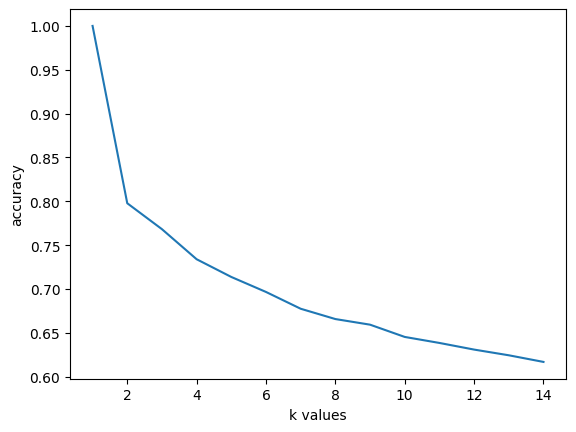

In [ ]:
# Findind k values in range(1,15)
score_list = []
for each in range(1,15):
    knn = KNeighborsClassifier(n_neighbors = each)
    knn.fit(X_train_4, y_training)
    score_list.append(knn.score(X_train_4, y_training))

plt.plot(range(1,15),score_list)
plt.xlabel("k values")
plt.ylabel("accuracy")
plt.show()

In [ ]:
# KNeighborsClassifier
# It took approximately 28 hours to train the model
params_knn = {'n_neighbors':list(range(2,10)),
         'weights': ['uniform', 'distance'],
         'leaf_size': list(range(10,20))
        }
knn4 = KNeighborsClassifier()
gs_knn4 = RandomizedSearchCV(knn4, param_distributions=params_knn, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)
gs_knn4.fit(X_train_4, y_training)
#See the best results:
# Best paramete set
print('Best parameters found:\n', gs_knn4.best_params_)
print('Best score found:\n', gs_knn4.best_score_)

Best parameters found:
 {'weights': 'distance', 'n_neighbors': 3, 'leaf_size': 13}
Best score found:
 0.6445736329322557


In [ ]:
# Extract the results
results = gs_knn4.cv_results_

# Calculate mean and std for accuracy
accuracy_mean = results['mean_test_accuracy'].mean()
accuracy_std = results['std_test_accuracy'].mean()

# Calculate mean and std for weighted F1 score
f1_mean = results['mean_test_f1_weighted'].mean()
f1_std = results['std_test_f1_weighted'].mean()

# Calculate mean and std for macro F1 score
f1_macro_mean = results['mean_test_f1_macro'].mean()
f1_macro_std = results['std_test_f1_macro'].mean()

print(f"Train Accuracy (mean ± std): {accuracy_mean:.3f} ± {accuracy_std:.3f}")
print(f"Train F1 Score (weighted) (mean ± std): {f1_mean:.3f} ± {f1_std:.3f}")
print(f"Train F1 Score (macro) (mean ± std): {f1_macro_mean:.3f} ± {f1_macro_std:.3f}")

Train Accuracy (mean ± std): 0.645 ± 0.003
Train F1 Score (weighted) (mean ± std): 0.686 ± 0.019
Train F1 Score (macro) (mean ± std): 0.584 ± 0.003


In [ ]:
# best_knn4 = KNeighborsClassifier(n_neighbors=3, leaf_size = 13, weights = 'distance')
# best_knn4.fit(X_train_4, y_training)

best_knn4 = gs_knn4.best_estimator_
best_knn4

KNeighborsClassifier(leaf_size=13, n_neighbors=3, weights='distance')

In [ ]:
knn_pred4 = best_knn4.predict(X_test_4)
acc_knn4 = accuracy_score(knn_pred4, y_testing)
print('accuracy: %s' % acc_knn4)
f1_knn4 = f1_score(y_testing, knn_pred4, average='weighted')
print('f1 score: %s' % f1_knn4)
macro_f1_knn4 = f1_score(y_testing, knn_pred4, average='macro')

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, knn_pred4, target_names=labels))


accuracy: 0.6943188804108054
f1 score: 0.7364460205966212
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.89      0.57      0.70        28
    antibiotic hydrolase       0.42      0.42      0.42        26
  antibiotic transferase       0.29      0.30      0.29        20
   antimicrobial protein       0.72      0.35      0.47        37
               apoptosis       0.83      0.72      0.77       107
    biosynthetic protein       0.78      0.60      0.68        83
  biotin-binding protein       0.92      0.96      0.94        24
          blood clotting       0.52      0.67      0.59        67
 calcium-binding protein       0.47      0.58      0.52        24
           cell adhesion       0.86      0.61      0.71       287
              cell cycle       0.68      0.63      0.65       234
           cell invasion       0.89      0.38      0.53        21
               chap

In [ ]:
accuracy_list4 = []
f1_list4 = []
macro_f1_list4 = []

# accuracy_list4.append(acc_knn4)
# f1_list4.append(f1_knn4)
# macro_f1_list4.append(macro_f1_knn4)

accuracy_list4.append(0.69)
f1_list4.append(0.74)
macro_f1_list4.append(0.63)

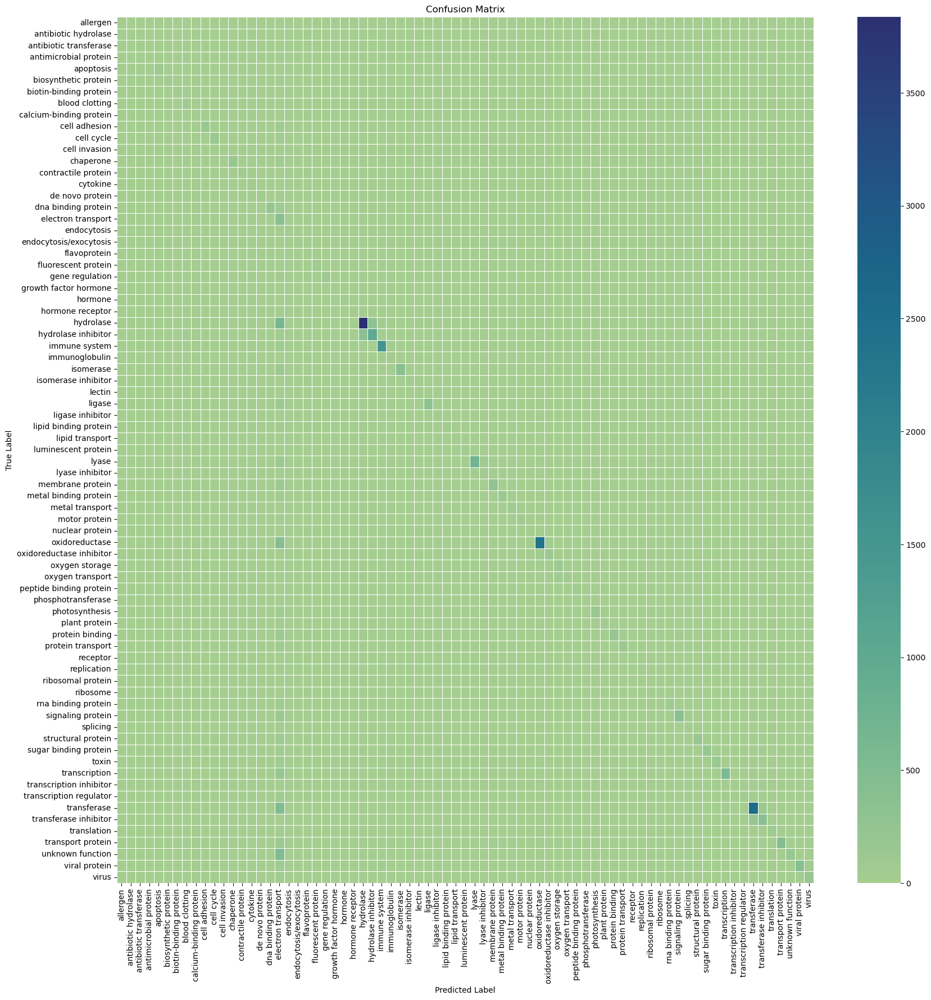

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_knn4 = confusion_matrix(y_testing, knn_pred4)#.astype(int)
sns.heatmap(cm_knn4, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_knn4 = confusion_matrix(y_testing, knn_pred4)#.astype(int)
cm_df_knn4 = pd.DataFrame(cm_knn4, columns = labels, index = labels)
cm_df_knn4

,allergen,antibiotic hydrolase,antibiotic transferase,antimicrobial protein,apoptosis,biosynthetic protein,biotin-binding protein,blood clotting,calcium-binding protein,cell adhesion,...,transcription,transcription inhibitor,transcription regulator,transferase,transferase inhibitor,translation,transport protein,unknown function,viral protein,virus
allergen,16,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
antibiotic hydrolase,0,11,0,0,0,0,0,0,0,0,...,0,0,0,0,2,0,0,1,0,0
antibiotic transferase,0,0,6,0,0,0,0,0,0,0,...,1,2,0,10,0,0,0,0,0,0
antimicrobial protein,0,0,0,13,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
apoptosis,0,0,0,0,77,0,0,0,0,0,...,1,0,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
translation,0,0,0,0,0,2,0,0,0,0,...,0,0,0,0,0,66,0,0,0,0
transport protein,0,0,0,1,0,0,0,0,0,2,...,5,0,0,0,0,1,451,1,0,0
unknown function,0,0,1,0,1,0,1,0,0,1,...,5,0,1,7,0,0,1,165,1,0
viral protein,0,0,0,0,0,0,0,0,0,0,...,2,0,1,6,1,0,0,0,390,16


In [ ]:
multi_cm_knn4 = multilabel_confusion_matrix(y_testing, knn_pred4, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
multi_cm_knn4

array([[[27623,     2],
        [   12,    16]],

       [[27612,    15],
        [   15,    11]],

       [[27618,    15],
        [   14,     6]],

       [[27611,     5],
        [   24,    13]],

       [[27530,    16],
        [   30,    77]],

       [[27556,    14],
        [   33,    50]],

       [[27627,     2],
        [    1,    23]],

       [[27545,    41],
        [   22,    45]],

       [[27613,    16],
        [   10,    14]],

       [[27337,    29],
        [  112,   175]],

       [[27349,    70],
        [   86,   148]],

       [[27631,     1],
        [   13,     8]],

       [[27368,    17],
        [   86,   182]],

       [[27565,     9],
        [   34,    45]],

       [[27569,    22],
        [   33,    29]],

       [[27545,    10],
        [   46,    52]],

       [[27318,    31],
        [  118,   186]],

       [[22750,  4422],
        [   99,   382]],

       [[27623,     4],
        [   10,    16]],

       [[27613,    12],
        [   13,    15]],



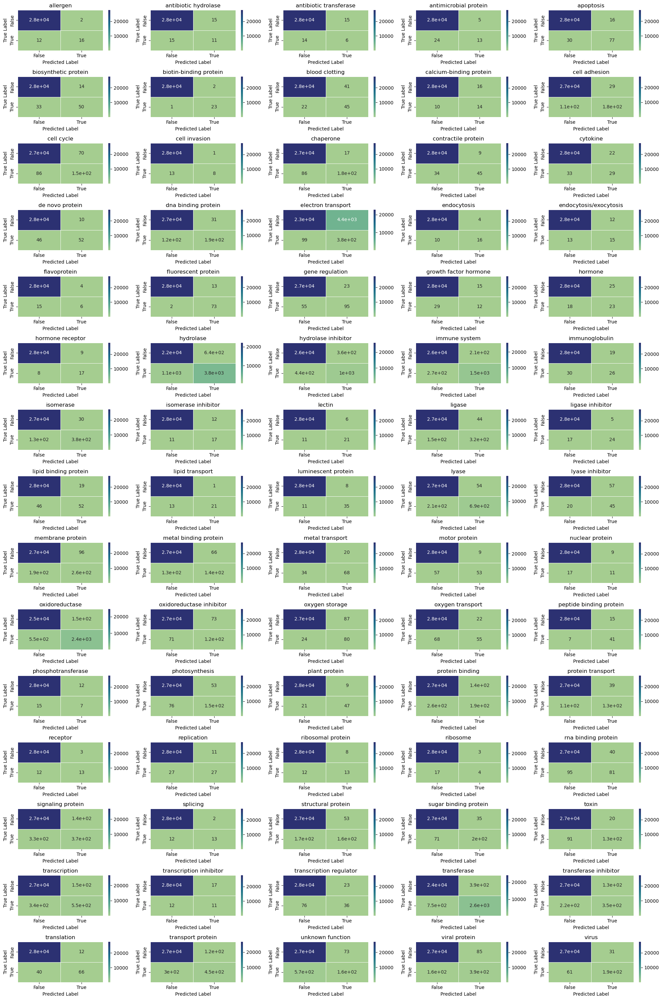

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_knn4):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### MultinomialNB

In [ ]:
# Naive Bayes Model
# It took approximately 28 hours to train the model
params_nb = {'alpha': [0.001, 0.01, 0.1, 0.5, 1.0],
        }
nb4 = MultinomialNB()
gs_nb4 = RandomizedSearchCV(nb4, param_distributions=params_nb, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)
gs_nb4.fit(X_train_4, y_training)
#See the best results:
# Best paramete set
print('Best parameters found:\n', gs_nb4.best_params_)
print('Best score found:\n', gs_nb4.best_score_)

Best parameters found:
 {'alpha': 1.0}
Best score found:
 0.6171886521237987


In [ ]:
# Extract the results
results = gs_nb4.cv_results_

# Calculate mean and std for accuracy
accuracy_mean = results['mean_test_accuracy'].mean()
accuracy_std = results['std_test_accuracy'].mean()

# Calculate mean and std for weighted F1 score
f1_mean = results['mean_test_f1_weighted'].mean()
f1_std = results['std_test_f1_weighted'].mean()

# Calculate mean and std for macro F1 score
f1_macro_mean = results['mean_test_f1_macro'].mean()
f1_macro_std = results['std_test_f1_macro'].mean()


print(f"Accuracy: {accuracy_mean:.3f} ± {accuracy_std:.3f}")
print(f"F1 Score (weighted): {f1_mean:.3f} ± {f1_std:.3f}")
print(f"F1 Score (macro): {f1_macro_mean:.3f} ± {f1_macro_std:.3f}")

Accuracy: 0.617 ± 0.002
F1 Score (weighted): 0.635 ± 0.001
F1 Score (macro): 0.525 ± 0.001


In [ ]:
# Naive Bayes Model
# best_nb4 = MultinomialNB(alpha = 1.0)
# best_nb4.fit(X_train_4, y_training)

best_nb4 = gs_nb4.best_estimator_
best_nb4

MultinomialNB()

In [ ]:
NB_pred4 = best_nb4.predict(X_test_4)
acc_nb4 = accuracy_score(NB_pred4, y_testing)
print('accuracy: %s' % acc_nb4)
f1_nb4 = f1_score(y_testing, NB_pred4, average='weighted')
print('f1 score: %s' % f1_nb4)
macro_f1_nb4 = f1_score(y_testing, NB_pred4, average='macro')

# accuracy_list4.append(acc_nb4)
# f1_list4.append(f1_nb4)
# macro_f1_list4.append(macro_f1_nb4)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, NB_pred4, target_names=labels))

accuracy: 0.6229342205185694
f1 score: 0.6479846117111276
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.59      0.68      0.63        28
    antibiotic hydrolase       0.18      0.77      0.29        26
  antibiotic transferase       0.14      0.40      0.21        20
   antimicrobial protein       0.31      0.49      0.38        37
               apoptosis       0.75      0.68      0.72       107
    biosynthetic protein       0.55      0.59      0.57        83
  biotin-binding protein       0.69      1.00      0.81        24
          blood clotting       0.38      0.78      0.51        67
 calcium-binding protein       0.25      0.46      0.32        24
           cell adhesion       0.72      0.67      0.69       287
              cell cycle       0.60      0.53      0.56       234
           cell invasion       0.37      0.52      0.43        21
               chap

In [ ]:
accuracy_list4.append(0.62)
f1_list4.append(0.65)
macro_f1_list4.append(0.55)

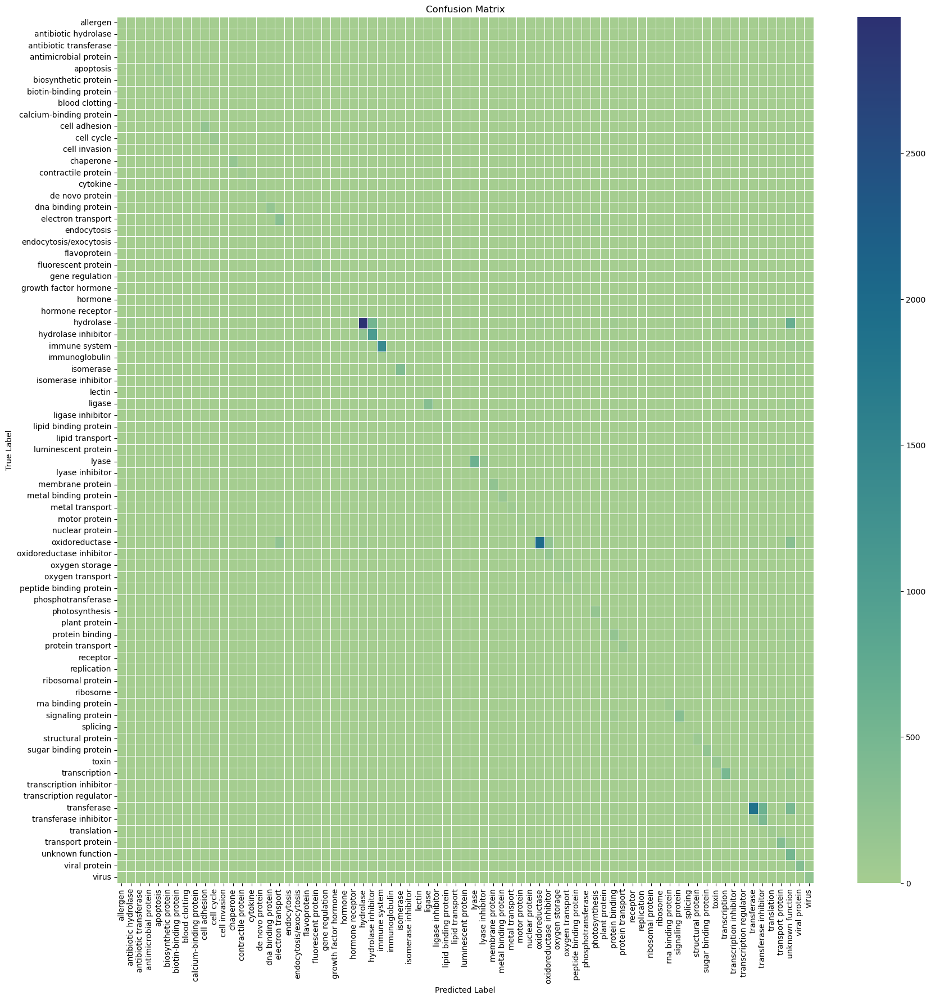

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_nb4 = confusion_matrix(y_testing, NB_pred4)#.astype(int)
sns.heatmap(cm_nb4, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_nb4 = confusion_matrix(y_testing, NB_pred4)#.astype(int)
cm_df_nb4 = pd.DataFrame(cm_nb4, columns = labels, index = labels)
cm_df_nb4

,allergen,antibiotic hydrolase,antibiotic transferase,antimicrobial protein,apoptosis,biosynthetic protein,biotin-binding protein,blood clotting,calcium-binding protein,cell adhesion,...,transcription,transcription inhibitor,transcription regulator,transferase,transferase inhibitor,translation,transport protein,unknown function,viral protein,virus
allergen,19,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,2,0,0
antibiotic hydrolase,0,20,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
antibiotic transferase,0,0,8,0,0,0,0,0,1,0,...,0,3,0,6,0,0,1,1,0,0
antimicrobial protein,0,0,0,18,0,0,0,0,0,0,...,0,0,1,0,0,0,1,1,0,0
apoptosis,0,0,1,0,73,0,0,0,0,0,...,0,0,0,4,1,0,0,8,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
translation,0,0,0,0,0,2,0,0,0,0,...,0,0,0,3,0,64,0,20,0,0
transport protein,0,0,0,5,0,1,0,0,0,3,...,1,0,1,17,0,1,350,78,0,0
unknown function,0,1,1,1,1,1,4,0,1,1,...,5,0,5,56,0,0,2,512,0,0
viral protein,1,1,0,0,1,3,0,0,0,1,...,0,0,0,17,2,0,1,54,350,33


In [ ]:
multi_cm_nb4 = multilabel_confusion_matrix(y_testing, NB_pred4, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
multi_cm_nb4

array([[[27612,    13],
        [    9,    19]],

       [[27535,    92],
        [    6,    20]],

       [[27584,    49],
        [   12,     8]],

       [[27576,    40],
        [   19,    18]],

       [[27522,    24],
        [   34,    73]],

       [[27530,    40],
        [   34,    49]],

       [[27618,    11],
        [    0,    24]],

       [[27502,    84],
        [   15,    52]],

       [[27596,    33],
        [   13,    11]],

       [[27290,    76],
        [   96,   191]],

       [[27335,    84],
        [  110,   124]],

       [[27613,    19],
        [   10,    11]],

       [[27362,    23],
        [   90,   178]],

       [[27537,    37],
        [   17,    62]],

       [[27540,    51],
        [   17,    45]],

       [[27510,    45],
        [   41,    57]],

       [[27250,    99],
        [  122,   182]],

       [[26902,   270],
        [  171,   310]],

       [[27613,    14],
        [    9,    17]],

       [[27601,    24],
        [   11,    17]],



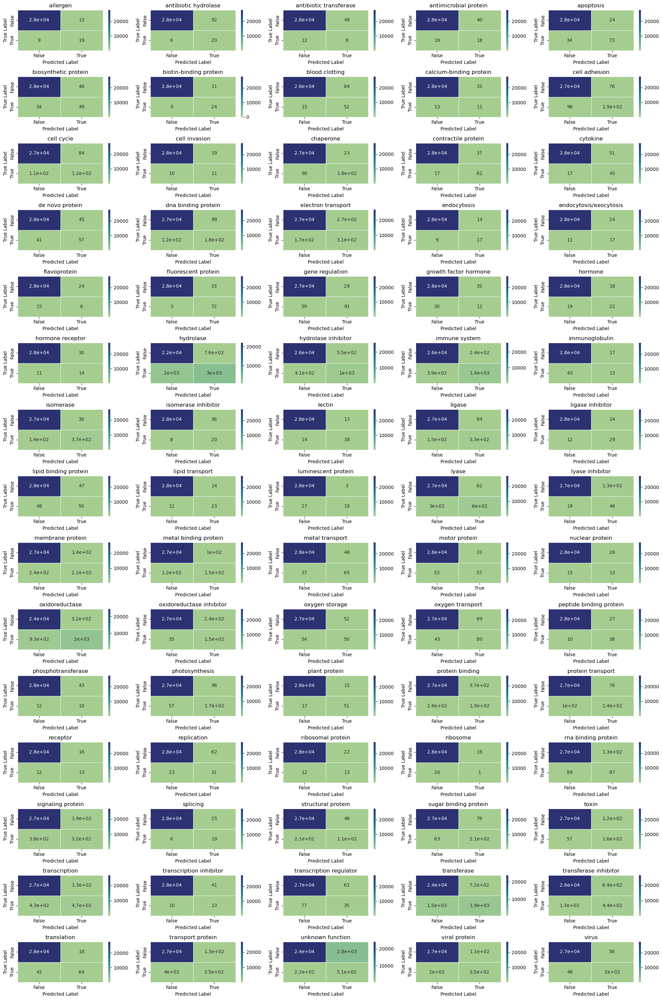

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_nb4):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### Logistic Regression

In [ ]:
# Logistic Regression Classifier
# It took approximately 40 hours to train the model
params_lr = {
    'penalty': ['l1', 'l2', 'elasticnet'],
    'C': [0.001, 0.01, 1.0, 5.0],
    'solver': ['lbfgs', 'newton-cg', 'sag', 'saga'],
}

logreg4 = LogisticRegression(max_iter=300, class_weight = 'balanced', random_state=random_seed, verbose = 1, n_jobs = -1)
gs_lr4 = RandomizedSearchCV(logreg4, param_distributions=params_lr, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)

# fit the model
gs_lr4.fit(X_train_4, y_training)
#See the best results:
# Best paramete set
print('Best parameters found:\n', gs_lr4.best_params_)
print('Best score found:\n', gs_lr4.best_score_)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed: 504.4min finished
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed: 557.2min finished
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed: 586.1min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed: 484.6min finished


Best parameters found:
 {'solver': 'newton-cg', 'penalty': 'l2', 'C': 1.0}
Best score found:
 0.674725184713084


In [ ]:
# Extract the results
results = gs_lr4.cv_results_

# Calculate mean and std for accuracy
accuracy_mean = results['mean_test_accuracy'].mean()
accuracy_std = results['std_test_accuracy'].mean()

# Calculate mean and std for weighted F1 score
f1_mean = results['mean_test_f1_weighted'].mean()
f1_std = results['std_test_f1_weighted'].mean()

# Calculate mean and std for macro F1 score
f1_macro_mean = results['mean_test_f1_macro'].mean()
f1_macro_std = results['std_test_f1_macro'].mean()


print(f"Accuracy: {accuracy_mean:.3f} ± {accuracy_std:.3f}")
print(f"F1 Score (weighted): {f1_mean:.3f} ± {f1_std:.3f}")
print(f"F1 Score (macro): {f1_macro_mean:.3f} ± {f1_macro_std:.3f}")

Accuracy: 0.675 ± 0.003
F1 Score (weighted): 0.684 ± 0.003
F1 Score (macro): 0.582 ± 0.002


In [ ]:
# best_lr4 = LogisticRegression(max_iter=300, solver = 'newton-cg', penalty = 'l2', class_weight = 'balanced', C = 1.0, random_state=random_seed, verbose = 1, n_jobs = -1)
# best_lr4.fit(X_train_4, y_training)

best_lr4 = gs_lr4.best_estimator_
best_lr4

LogisticRegression(class_weight='balanced', max_iter=300, n_jobs=-1,
                   random_state=42, solver='newton-cg', verbose=1)

In [ ]:
# lr_pred = gs_lr.predict(X_test_df)
lr_pred4 = best_lr4.predict(X_test_4)
acc_lr4 = accuracy_score(lr_pred4, y_testing)
print('accuracy: %s' % acc_lr4)
f1_lr4 = f1_score(y_testing, lr_pred4, average='weighted')
print('f1 score: %s' % f1_lr4)
macro_f1_lr4 = f1_score(y_testing, lr_pred4, average='macro')

# accuracy_list4.append(acc_lr4)
# f1_list4.append(f1_lr4)
# macro_f1_list4.append(macro_f1_lr4)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, lr_pred4, target_names=labels))

accuracy: 0.7103388420786172
f1 score: 0.7187546892816951
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.90      0.68      0.78        28
    antibiotic hydrolase       0.23      0.81      0.36        26
  antibiotic transferase       0.20      0.45      0.28        20
   antimicrobial protein       0.75      0.41      0.53        37
               apoptosis       0.68      0.73      0.70       107
    biosynthetic protein       0.63      0.65      0.64        83
  biotin-binding protein       0.75      1.00      0.86        24
          blood clotting       0.35      0.82      0.49        67
 calcium-binding protein       0.28      0.79      0.42        24
           cell adhesion       0.77      0.66      0.71       287
              cell cycle       0.65      0.65      0.65       234
           cell invasion       0.62      0.38      0.47        21
               chap

In [ ]:
accuracy_list4.append(0.71)
f1_list4.append(0.72)
macro_f1_list4.append(0.62)

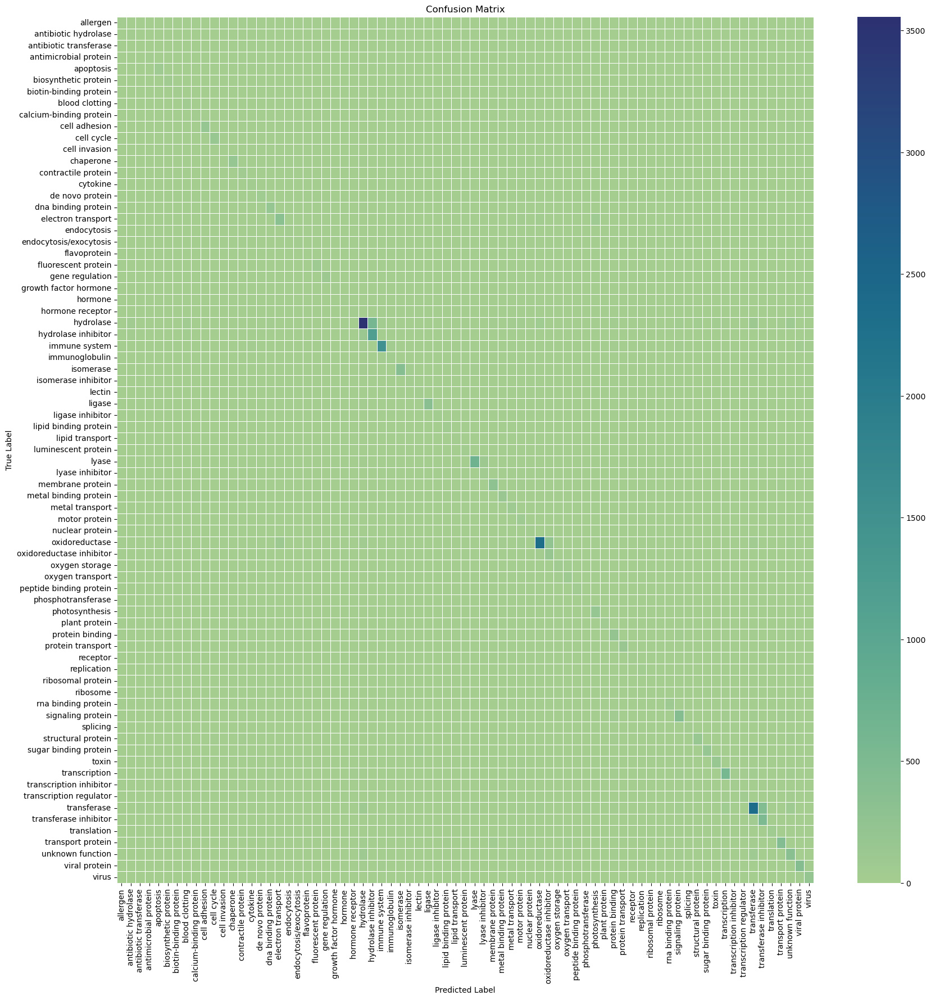

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_lr4 = confusion_matrix(y_testing, lr_pred4)#.astype(int)
sns.heatmap(cm_lr4, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
# plt.savefig('pics/pdb_confusionmatrix_lr_model1.jpg', dpi = 300, bbox_inches='tight')
plt.show()

In [ ]:
# confusion matrix
cm_lr4 = confusion_matrix(y_testing, lr_pred4)#.astype(int)
cm_df_lr4 = pd.DataFrame(cm_lr4, columns = labels, index = labels)
cm_df_lr4

,allergen,antibiotic hydrolase,antibiotic transferase,antimicrobial protein,apoptosis,biosynthetic protein,biotin-binding protein,blood clotting,calcium-binding protein,cell adhesion,...,transcription,transcription inhibitor,transcription regulator,transferase,transferase inhibitor,translation,transport protein,unknown function,viral protein,virus
allergen,19,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,3,0,0
antibiotic hydrolase,0,21,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
antibiotic transferase,0,0,9,0,0,0,0,0,0,0,...,0,2,0,9,0,0,0,0,0,0
antimicrobial protein,0,0,0,15,0,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
apoptosis,0,0,0,0,78,0,0,0,0,0,...,2,0,0,2,1,0,0,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
translation,0,0,0,0,0,2,0,0,0,0,...,1,0,0,3,0,67,0,4,0,0
transport protein,0,0,0,1,0,0,0,0,1,2,...,10,0,0,16,0,1,425,10,1,0
unknown function,0,0,1,0,1,1,4,0,1,1,...,32,0,1,82,0,0,7,354,3,1
viral protein,0,0,0,0,1,0,0,0,0,3,...,2,0,1,12,1,0,0,8,415,24


In [ ]:
multi_cm_lr4 = multilabel_confusion_matrix(y_testing, lr_pred4, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
multi_cm_lr4

array([[[27623,     2],
        [    9,    19]],

       [[27557,    70],
        [    5,    21]],

       [[27597,    36],
        [   11,     9]],

       [[27611,     5],
        [   22,    15]],

       [[27509,    37],
        [   29,    78]],

       [[27538,    32],
        [   29,    54]],

       [[27621,     8],
        [    0,    24]],

       [[27482,   104],
        [   12,    55]],

       [[27581,    48],
        [    5,    19]],

       [[27310,    56],
        [   98,   189]],

       [[27338,    81],
        [   81,   153]],

       [[27627,     5],
        [   13,     8]],

       [[27360,    25],
        [   78,   190]],

       [[27555,    19],
        [   24,    55]],

       [[27558,    33],
        [   25,    37]],

       [[27533,    22],
        [   37,    61]],

       [[27256,    93],
        [  117,   187]],

       [[27016,   156],
        [  153,   328]],

       [[27623,     4],
        [    9,    17]],

       [[27612,    13],
        [   11,    17]],



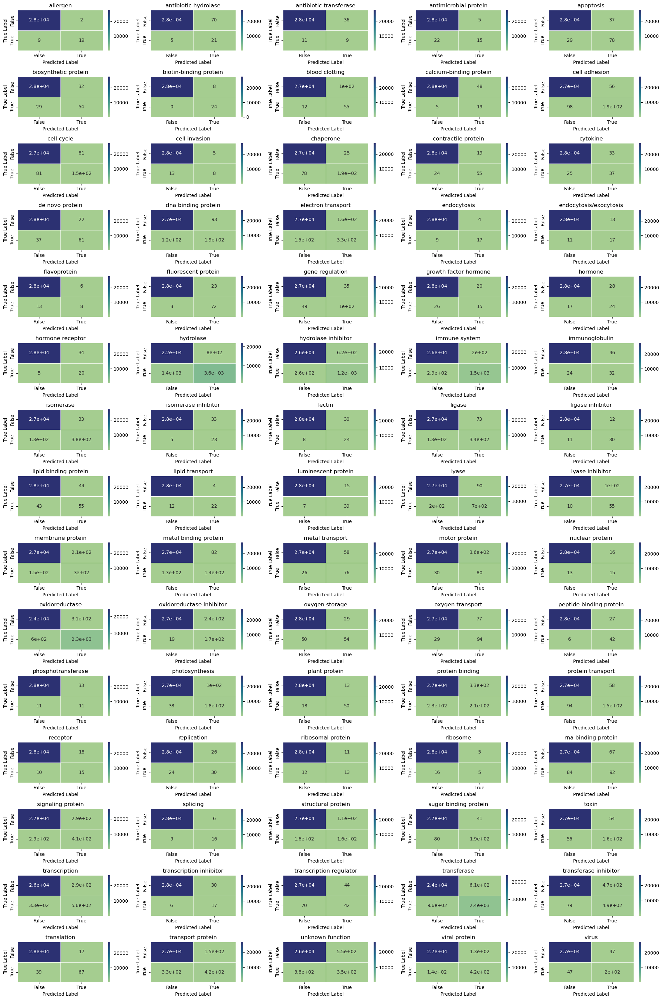

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_lr4):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
# plt.savefig('pics/pdb_confusionmatrix_lr_model2.jpg', dpi = 300, bbox_inches='tight')
plt.show()

##### MLP Classifier

In [ ]:
# MLPClassifier
# It took approximately 39-40 hours to train the model
params_mlp = {
    'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,), (100,100,100)],
    'alpha': [0.0001, 0.001, 0.01],
    'learning_rate': ['invscaling','constant','adaptive'],
}

mlp4 = MLPClassifier(max_iter=300, activation='relu', solver='adam', random_state=random_seed)
gs_mlp4 = RandomizedSearchCV(mlp4, param_distributions=params_mlp, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)
# gs_mlp = GridSearchCV(mlp, params_mlp, cv=5)
gs_mlp4.fit(X_train_4, y_training)
# Best paramete set
print('Best parameters found:\n', gs_mlp4.best_params_)
print('Best score found:\n', gs_mlp4.best_score_)

Best parameters found:
 {'learning_rate': 'invscaling', 'hidden_layer_sizes': (100,), 'alpha': 0.001}
Best score found:
 0.6912993853683732


In [ ]:
# Extract the results
results = gs_mlp4.cv_results_

# Calculate mean and std for accuracy
accuracy_mean = results['mean_test_accuracy'].mean()
accuracy_std = results['std_test_accuracy'].mean()

# Calculate mean and std for weighted F1 score
f1_mean = results['mean_test_f1_weighted'].mean()
f1_std = results['std_test_f1_weighted'].mean()

# Calculate mean and std for macro F1 score
f1_macro_mean = results['mean_test_f1_macro'].mean()
f1_macro_std = results['std_test_f1_macro'].mean()


print(f"Accuracy: {accuracy_mean:.3f} ± {accuracy_std:.3f}")
print(f"F1 Score (weighted): {f1_mean:.3f} ± {f1_std:.3f}")
print(f"F1 Score (macro): {f1_macro_mean:.3f} ± {f1_macro_std:.3f}")

Accuracy: 0.691 ± 0.001
F1 Score (weighted): 0.685 ± 0.001
F1 Score (macro): 0.576 ± 0.006


In [ ]:
# best_mlp4 = MLPClassifier(alpha = 0.001, hidden_layer_sizes = (100,), max_iter=300, activation='relu', solver='adam', learning_rate = 'invscaling', random_state=random_seed)
# best_mlp4.fit(X_train_4, y_training)

best_mlp4 = gs_mlp4.best_estimator_
best_mlp4

MLPClassifier(alpha=0.001, learning_rate='invscaling', max_iter=300,
              random_state=42)

In [ ]:
mlp_pred4 = best_mlp4.predict(X_test_4)
acc_mlp4 = accuracy_score(mlp_pred4, y_testing)
print('accuracy: %s' % acc_mlp4)
f1_mlp4 = f1_score(y_testing, mlp_pred4, average='weighted')
print('f1 score: %s' % f1_mlp4)
macro_f1_mlp4 = f1_score(y_testing, mlp_pred4, average='macro')

# accuracy_list4.append(acc_mlp4)
# f1_list4.append(f1_mlp4)
# macro_f1_list4.append(macro_f1_mlp4)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, mlp_pred4, target_names=labels))

accuracy: 0.7254547427042274
f1 score: 0.7205448840077797
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.87      0.46      0.60        28
    antibiotic hydrolase       0.67      0.31      0.42        26
  antibiotic transferase       0.50      0.25      0.33        20
   antimicrobial protein       0.80      0.32      0.46        37
               apoptosis       0.77      0.67      0.72       107
    biosynthetic protein       0.69      0.54      0.61        83
  biotin-binding protein       0.80      1.00      0.89        24
          blood clotting       0.67      0.60      0.63        67
 calcium-binding protein       0.42      0.33      0.37        24
           cell adhesion       0.78      0.61      0.68       287
              cell cycle       0.69      0.60      0.64       234
           cell invasion       0.67      0.38      0.48        21
               chap

In [ ]:
accuracy_list4.append(0.73)
f1_list4.append(0.72)

macro_f1_list4.append(0.60)

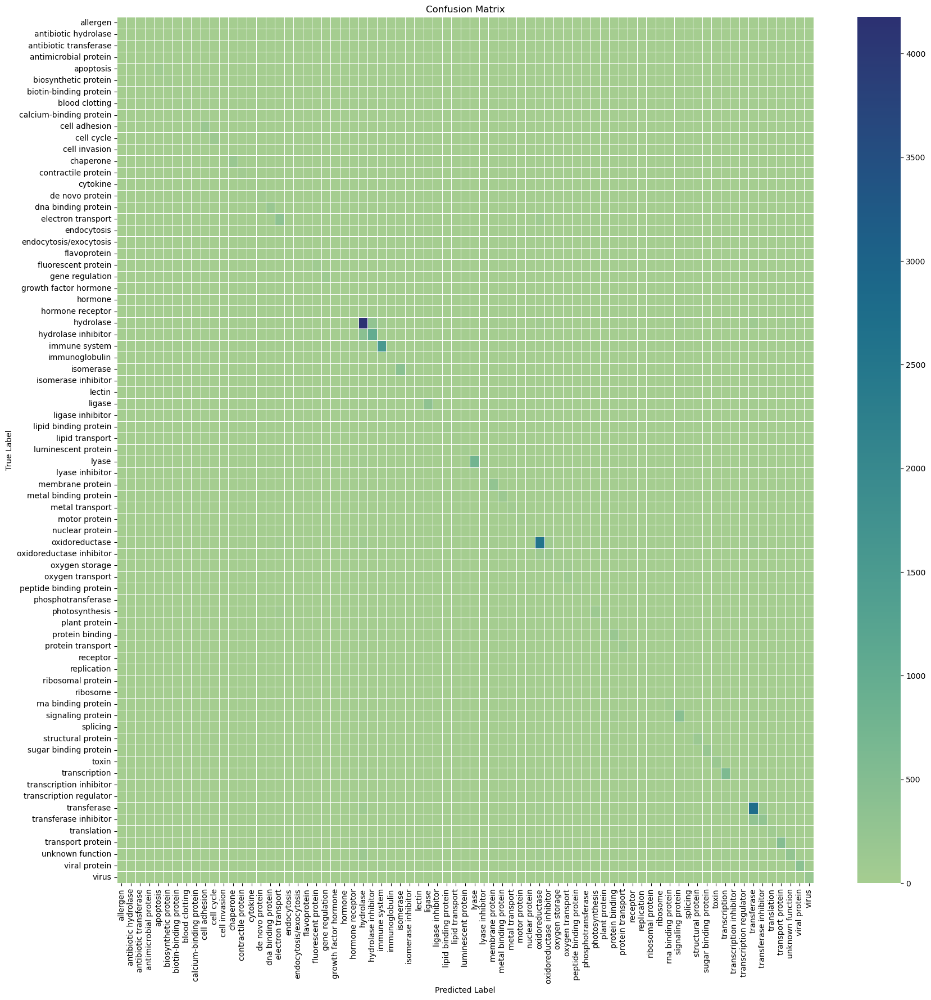

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_mlp4 = confusion_matrix(y_testing, mlp_pred4)#.astype(int)
sns.heatmap(cm_mlp4, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_mlp4 = confusion_matrix(y_testing, mlp_pred4)#.astype(int)
cm_df_mlp4 = pd.DataFrame(cm_mlp4, columns = labels, index = labels)
cm_df_mlp4

,allergen,antibiotic hydrolase,antibiotic transferase,antimicrobial protein,apoptosis,biosynthetic protein,biotin-binding protein,blood clotting,calcium-binding protein,cell adhesion,...,transcription,transcription inhibitor,transcription regulator,transferase,transferase inhibitor,translation,transport protein,unknown function,viral protein,virus
allergen,13,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
antibiotic hydrolase,0,8,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
antibiotic transferase,0,0,5,0,0,0,0,0,0,0,...,0,0,0,15,0,0,0,0,0,0
antimicrobial protein,0,0,0,12,0,0,0,0,0,0,...,1,0,0,0,0,0,2,0,0,0
apoptosis,0,0,0,0,72,0,0,0,0,0,...,3,0,0,2,0,1,0,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
translation,0,0,0,0,0,2,0,0,0,0,...,0,0,0,4,0,66,1,3,0,0
transport protein,0,0,0,0,0,0,0,0,0,3,...,5,0,0,21,0,2,477,5,1,0
unknown function,0,0,0,0,0,0,3,0,0,1,...,33,0,2,57,0,0,7,272,5,0
viral protein,0,0,0,0,0,0,0,1,0,1,...,0,0,1,17,1,0,0,1,391,21


In [ ]:
multi_cm_mlp4 = multilabel_confusion_matrix(y_testing, mlp_pred4, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
multi_cm_mlp4

array([[[27623,     2],
        [   15,    13]],

       [[27623,     4],
        [   18,     8]],

       [[27628,     5],
        [   15,     5]],

       [[27613,     3],
        [   25,    12]],

       [[27524,    22],
        [   35,    72]],

       [[27550,    20],
        [   38,    45]],

       [[27623,     6],
        [    0,    24]],

       [[27566,    20],
        [   27,    40]],

       [[27618,    11],
        [   16,     8]],

       [[27316,    50],
        [  112,   175]],

       [[27356,    63],
        [   94,   140]],

       [[27628,     4],
        [   13,     8]],

       [[27335,    50],
        [   86,   182]],

       [[27554,    20],
        [   25,    54]],

       [[27566,    25],
        [   32,    30]],

       [[27543,    12],
        [   41,    57]],

       [[27265,    84],
        [  122,   182]],

       [[27051,   121],
        [  135,   346]],

       [[27622,     5],
        [   10,    16]],

       [[27614,    11],
        [   17,    11]],



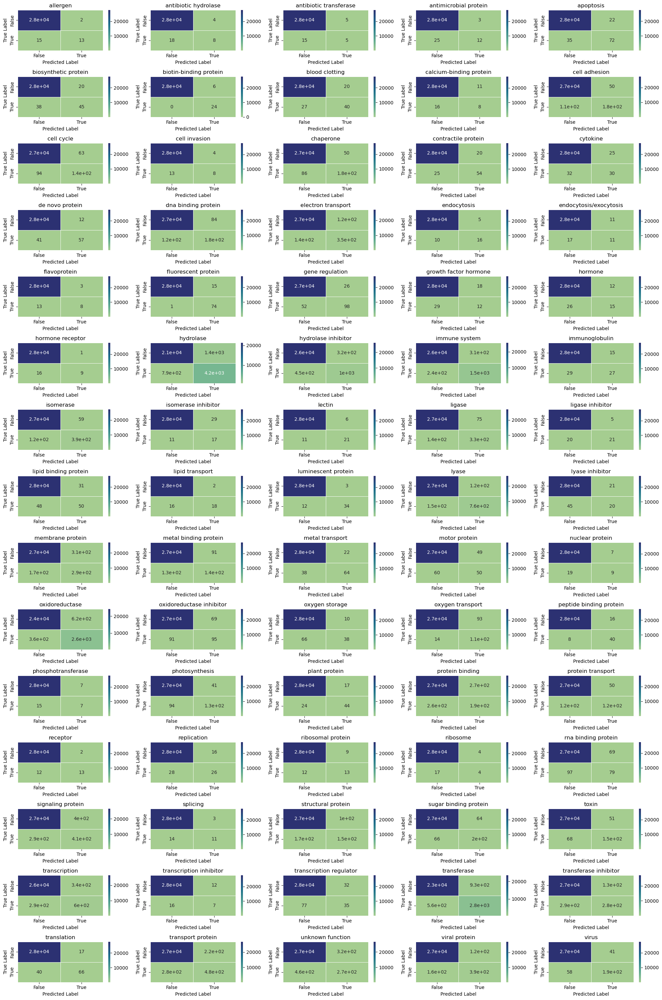

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_mlp4):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### Decision Tree Classifier

In [ ]:
#Decision Tree Classifier
# It took approximately 40 hours to train the model
params_dtc = {
    'criterion': ['gini', 'entropy', 'log_loss'],
    'splitter': ['best', 'random'],
}

dtc4 = DecisionTreeClassifier(min_samples_split = 2, class_weight = 'balanced', random_state=random_seed)
gs_dtc4 = RandomizedSearchCV(dtc4, param_distributions=params_dtc, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)

gs_dtc4.fit(X_train_4, y_training)
# Best paramete set
print('Best parameters found:\n', gs_dtc4.best_params_)
print('Best score found:\n', gs_dtc4.best_score_)

Best parameters found:
 {'splitter': 'best', 'criterion': 'gini'}
Best score found:
 0.6214650392018172


In [ ]:
# Extract the results
results = gs_dtc4.cv_results_

# Calculate mean and std for accuracy
accuracy_mean = results['mean_test_accuracy'].mean()
accuracy_std = results['std_test_accuracy'].mean()

# Calculate mean and std for weighted F1 score
f1_mean = results['mean_test_f1_weighted'].mean()
f1_std = results['std_test_f1_weighted'].mean()

# Calculate mean and std for macro F1 score
f1_macro_mean = results['mean_test_f1_macro'].mean()
f1_macro_std = results['std_test_f1_macro'].mean()


print(f"Accuracy: {accuracy_mean:.3f} ± {accuracy_std:.3f}")
print(f"F1 Score (weighted): {f1_mean:.3f} ± {f1_std:.3f}")
print(f"F1 Score (macro): {f1_macro_mean:.3f} ± {f1_macro_std:.3f}")

Accuracy: 0.621 ± 0.001
F1 Score (weighted): 0.634 ± 0.002
F1 Score (macro): 0.536 ± 0.004


In [ ]:
# best_dtc4 = DecisionTreeClassifier(criterion = 'gini', splitter = 'best', min_samples_split = 2, class_weight = 'balanced', random_state=random_seed)
# best_dtc4.fit(X_train_4, y_training)

best_dtc4 = gs_dtc4.best_estimator_
best_dtc4

DecisionTreeClassifier(class_weight='balanced', random_state=42)

In [ ]:
dtc_pred4 = best_dtc4.predict(X_test_4)
acc_dtc4 = accuracy_score(dtc_pred4, y_testing)
print('accuracy: %s' % acc_dtc4)
f1_dtc4 = f1_score(y_testing, dtc_pred4, average='weighted')
print('f1 score: %s' % f1_dtc4)
macro_f1_dtc4 = f1_score(y_testing, dtc_pred4, average='macro')

# accuracy_list4.append(acc_dtc4)
# f1_list4.append(f1_dtc4)
# macro_f1_list4.append(macro_f1_dtc4)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, dtc_pred4, target_names=labels))


accuracy: 0.6649911402017864
f1 score: 0.6714023576640737
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.74      0.61      0.67        28
    antibiotic hydrolase       0.25      0.65      0.37        26
  antibiotic transferase       0.23      0.45      0.30        20
   antimicrobial protein       0.42      0.43      0.43        37
               apoptosis       0.57      0.67      0.62       107
    biosynthetic protein       0.50      0.59      0.54        83
  biotin-binding protein       0.85      0.96      0.90        24
          blood clotting       0.33      0.75      0.46        67
 calcium-binding protein       0.25      0.67      0.36        24
           cell adhesion       0.62      0.53      0.57       287
              cell cycle       0.55      0.59      0.57       234
           cell invasion       0.38      0.38      0.38        21
               chap

In [ ]:
accuracy_list4.append(0.66)
f1_list4.append(0.67)

macro_f1_list4.append(0.55)

In [ ]:
# dtc4_report = classification_report(y_testing, dtc_pred4, target_names=labels, output_dict=True)
# dtc4_report.update({"accuracy": {"precision": None, "recall": None, "f1-score": dtc4_report["accuracy"], "support": dtc4_report['macro avg']['support']}})

# dtc4_df = pd.DataFrame(dtc4_report).transpose()
# dtc4_df.to_csv('dtc4_report.csv', index = False)

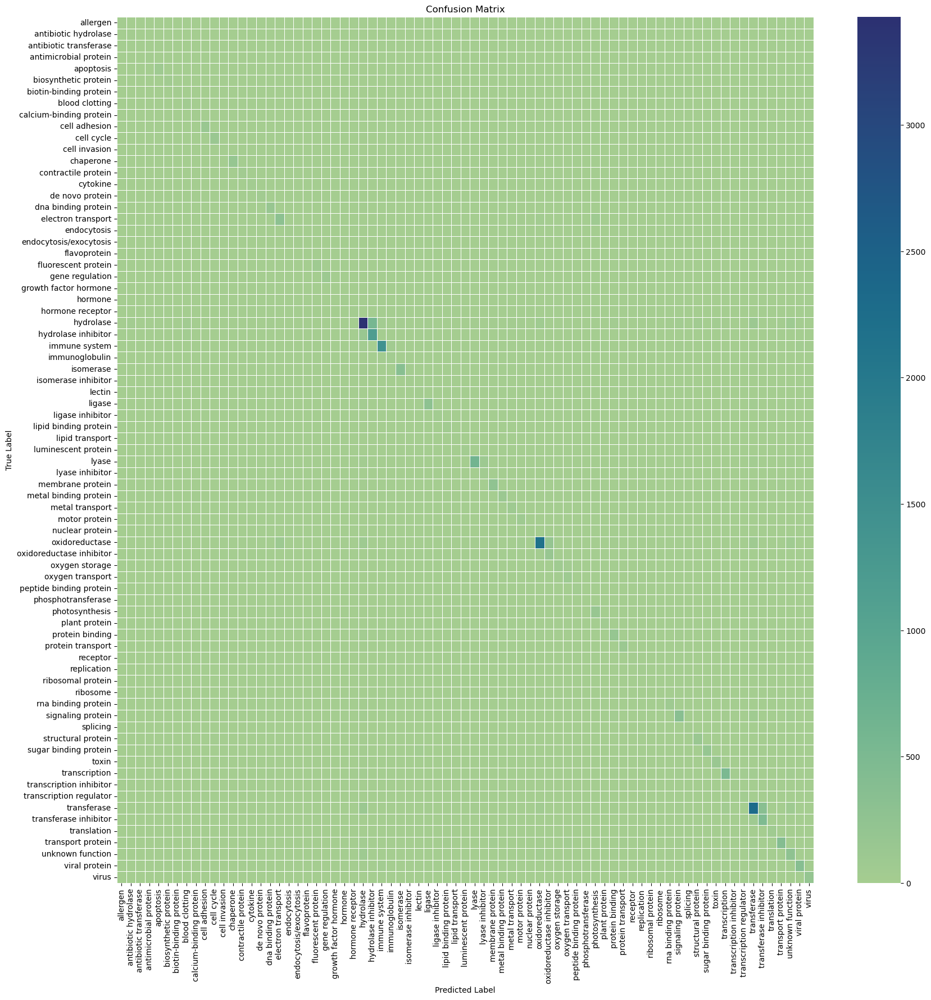

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_dtc4 = confusion_matrix(y_testing, dtc_pred4)#.astype(int)
sns.heatmap(cm_dtc4, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_dtc4 = confusion_matrix(y_testing, dtc_pred4)#.astype(int)
cm_df_dtc4 = pd.DataFrame(cm_dtc4, columns = labels, index = labels)
cm_df_dtc4

,allergen,antibiotic hydrolase,antibiotic transferase,antimicrobial protein,apoptosis,biosynthetic protein,biotin-binding protein,blood clotting,calcium-binding protein,cell adhesion,...,transcription,transcription inhibitor,transcription regulator,transferase,transferase inhibitor,translation,transport protein,unknown function,viral protein,virus
allergen,17,0,0,0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
antibiotic hydrolase,0,17,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
antibiotic transferase,0,0,9,0,0,0,0,0,0,0,...,0,2,0,8,0,0,0,0,0,0
antimicrobial protein,0,0,0,16,0,0,0,0,0,1,...,1,0,0,0,0,0,0,1,0,0
apoptosis,0,0,0,1,72,0,0,0,0,0,...,0,0,0,1,2,0,0,7,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
translation,0,0,0,0,0,0,0,0,0,0,...,3,0,0,9,0,63,0,1,0,1
transport protein,0,0,0,1,2,4,0,0,2,6,...,6,0,2,27,0,1,399,11,1,1
unknown function,1,0,0,1,2,2,1,1,1,14,...,26,0,7,61,2,0,13,268,7,2
viral protein,0,0,0,1,2,2,0,1,0,7,...,6,0,2,19,0,1,0,4,368,22


In [ ]:
multi_cm_dtc4 = multilabel_confusion_matrix(y_testing, dtc_pred4, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
multi_cm_dtc4

array([[[27619,     6],
        [   11,    17]],

       [[27577,    50],
        [    9,    17]],

       [[27602,    31],
        [   11,     9]],

       [[27594,    22],
        [   21,    16]],

       [[27492,    54],
        [   35,    72]],

       [[27521,    49],
        [   34,    49]],

       [[27625,     4],
        [    1,    23]],

       [[27485,   101],
        [   17,    50]],

       [[27581,    48],
        [    8,    16]],

       [[27274,    92],
        [  135,   152]],

       [[27307,   112],
        [   96,   138]],

       [[27619,    13],
        [   13,     8]],

       [[27320,    65],
        [   90,   178]],

       [[27535,    39],
        [   26,    53]],

       [[27546,    45],
        [   30,    32]],

       [[27514,    41],
        [   47,    51]],

       [[27223,   126],
        [  130,   174]],

       [[27016,   156],
        [  181,   300]],

       [[27621,     6],
        [   10,    16]],

       [[27605,    20],
        [   11,    17]],



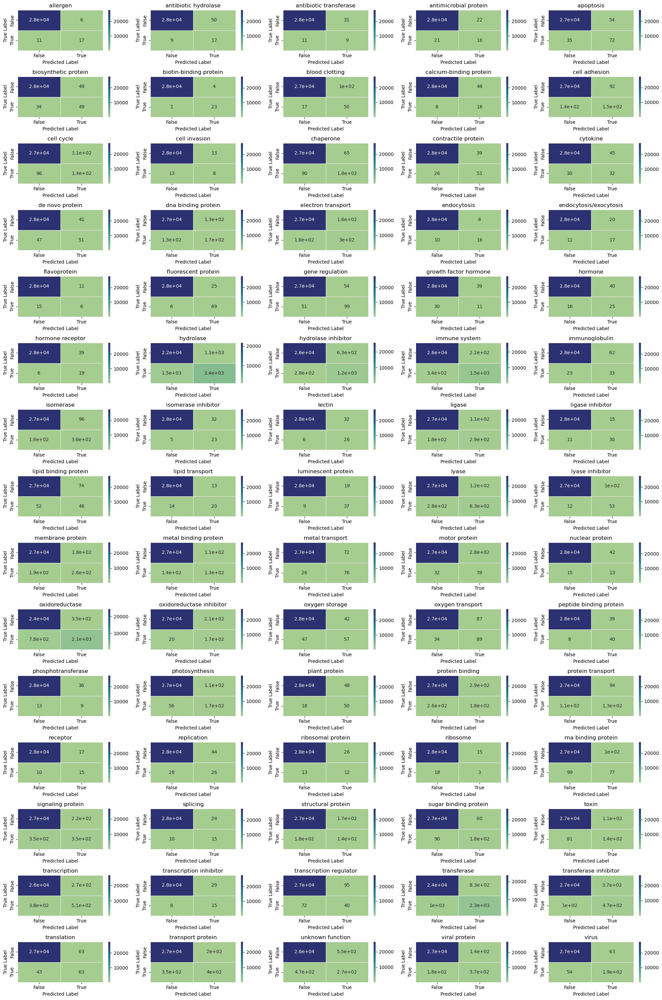

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_dtc4):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### Random Forest Classifier

In [ ]:
#Random Forest Classifier
# It took approximately 40 hours to train the model
params_rfc = {
    'n_estimators': [10,20,30,40,50,100],
     'criterion': ['gini', 'entropy'],
}

rfc4 = RandomForestClassifier(min_samples_split = 2, class_weight = 'balanced', verbose = 1, random_state=random_seed, n_jobs = -1)
gs_rfc4 = RandomizedSearchCV(rfc4, param_distributions=params_rfc, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)

gs_rfc4.fit(X_train_4, y_training)
# Best paramete set
print('Best parameters found:\n', gs_rfc4.best_params_)
print('Best score found:\n', gs_rfc4.best_score_)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed: 30.4min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapse

[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed: 141.8min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed:    5.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed: 314.2min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   19.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed: 350.8min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:   19.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed: 121.1min finished
[Parallel(n_jobs=1)]

Best parameters found:
 {'n_estimators': 100, 'criterion': 'gini'}
Best score found:
 0.6481448558309212


[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed: 218.1min finished


In [ ]:
# Extract the results
results = gs_rfc4.cv_results_

# Calculate mean and std for accuracy
accuracy_mean = results['mean_test_accuracy'].mean()
accuracy_std = results['std_test_accuracy'].mean()

# Calculate mean and std for weighted F1 score
f1_mean = results['mean_test_f1_weighted'].mean()
f1_std = results['std_test_f1_weighted'].mean()

# Calculate mean and std for macro F1 score
f1_macro_mean = results['mean_test_f1_macro'].mean()
f1_macro_std = results['std_test_f1_macro'].mean()


print(f"Accuracy: {accuracy_mean:.3f} ± {accuracy_std:.3f}")
print(f"F1 Score (weighted): {f1_mean:.3f} ± {f1_std:.3f}")
print(f"F1 Score (macro): {f1_macro_mean:.3f} ± {f1_macro_std:.3f}")

Accuracy: 0.648 ± 0.001
F1 Score (weighted): 0.653 ± 0.002
F1 Score (macro): 0.617 ± 0.002


In [ ]:
# best_rfc4 = RandomForestClassifier(n_estimators = 100, min_samples_split = 2, criterion = 'gini', verbose = 1, class_weight = 'balanced', random_state=random_seed, n_jobs = -1)
# best_rfc4.fit(X_train_4, y_training)

best_rfc4 = gs_rfc4.best_estimator_
best_rfc4

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 34.2min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 82.3min finished


RandomForestClassifier(class_weight='balanced', n_jobs=-1, random_state=42,
                       verbose=1)

In [ ]:
rfc_pred4 = best_rfc4.predict(X_test_4)
acc_rfc4 = accuracy_score(rfc_pred4, y_testing)
print('accuracy: %s' % acc_rfc4)
f1_rfc4 = f1_score(y_testing, rfc_pred4, average='weighted')
print('f1 score: %s' % f1_rfc4)
macro_f1_rfc4 = f1_score(y_testing, rfc_pred4, average='macro')

# accuracy_list4.append(acc_rfc4)
# f1_list4.append(f1_rfc4)
# macro_f1_list4.append(macro_f1_rfc4)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, rfc_pred4, target_names=labels))


[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    1.0s


accuracy: 0.7134488120637905
f1 score: 0.7179536977343127
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.90      0.64      0.75        28
    antibiotic hydrolase       0.29      0.69      0.40        26
  antibiotic transferase       0.24      0.45      0.31        20
   antimicrobial protein       0.59      0.46      0.52        37
               apoptosis       0.73      0.70      0.71       107
    biosynthetic protein       0.76      0.60      0.67        83
  biotin-binding protein       0.82      0.96      0.88        24
          blood clotting       0.40      0.76      0.52        67
 calcium-binding protein       0.44      0.75      0.55        24
           cell adhesion       0.89      0.57      0.70       287
              cell cycle       0.68      0.62      0.65       234
           cell invasion       0.89      0.38      0.53        21
               chap

[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    2.7s finished


In [ ]:
accuracy_list4.append(0.71)
f1_list4.append(0.72)

macro_f1_list4.append(0.63)

In [ ]:
# save the classification report into csv format
# rfc4_report = classification_report(y_testing, rfc_pred4, target_names=labels, output_dict=True)
# rfc4_report.update({"accuracy": {"precision": None, "recall": None, "f1-score": rfc4_report["accuracy"], "support": rfc4_report['macro avg']['support']}})

# rfc4_df = pd.DataFrame(rfc4_report).transpose()
# rfc4_df.to_csv('rfc4_report.csv', index = False)

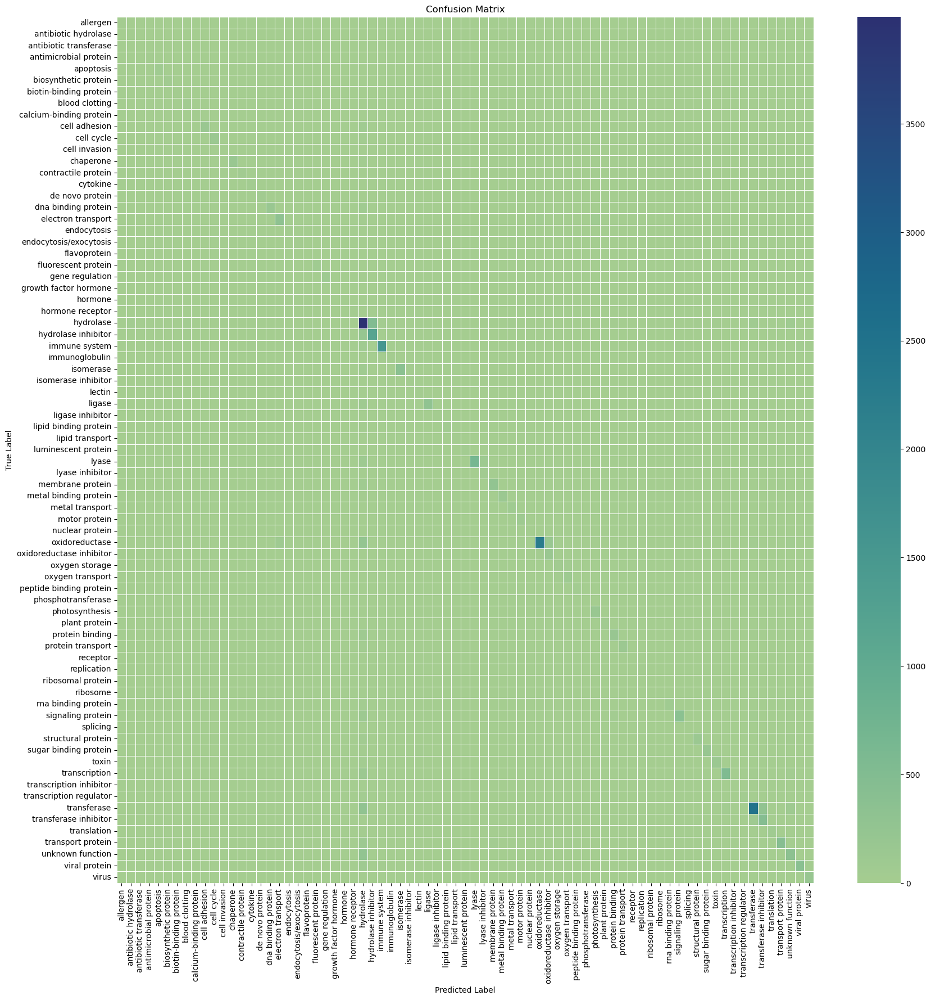

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_rfc4 = confusion_matrix(y_testing, rfc_pred4)#.astype(int)
sns.heatmap(cm_rfc4, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_rfc4 = confusion_matrix(y_testing, rfc_pred4)#.astype(int)
cm_df_rfc4 = pd.DataFrame(cm_rfc4, columns = labels, index = labels)
cm_df_rfc4

,allergen,antibiotic hydrolase,antibiotic transferase,antimicrobial protein,apoptosis,biosynthetic protein,biotin-binding protein,blood clotting,calcium-binding protein,cell adhesion,...,transcription,transcription inhibitor,transcription regulator,transferase,transferase inhibitor,translation,transport protein,unknown function,viral protein,virus
allergen,18,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
antibiotic hydrolase,0,18,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
antibiotic transferase,0,0,9,0,0,0,0,0,0,0,...,0,2,0,8,0,0,0,0,0,0
antimicrobial protein,0,0,0,17,0,0,0,0,0,0,...,0,0,0,3,0,0,0,0,0,0
apoptosis,0,0,0,0,75,0,0,0,0,0,...,0,0,0,2,1,0,0,5,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
translation,0,0,0,0,0,1,0,0,0,0,...,1,0,0,2,0,67,0,4,0,0
transport protein,0,0,0,1,0,0,0,0,0,2,...,4,0,0,15,0,1,435,14,0,0
unknown function,0,0,1,0,1,0,1,0,1,0,...,9,0,0,61,0,1,1,346,0,0
viral protein,0,0,0,0,0,0,0,0,0,0,...,1,0,0,15,1,0,0,1,385,20


In [ ]:
multi_cm_rfc4 = multilabel_confusion_matrix(y_testing, rfc_pred4, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
multi_cm_rfc4

array([[[27623,     2],
        [   10,    18]],

       [[27582,    45],
        [    8,    18]],

       [[27604,    29],
        [   11,     9]],

       [[27604,    12],
        [   20,    17]],

       [[27518,    28],
        [   32,    75]],

       [[27554,    16],
        [   33,    50]],

       [[27624,     5],
        [    1,    23]],

       [[27509,    77],
        [   16,    51]],

       [[27606,    23],
        [    6,    18]],

       [[27346,    20],
        [  123,   164]],

       [[27352,    67],
        [   90,   144]],

       [[27631,     1],
        [   13,     8]],

       [[27373,    12],
        [   86,   182]],

       [[27558,    16],
        [   22,    57]],

       [[27564,    27],
        [   27,    35]],

       [[27541,    14],
        [   41,    57]],

       [[27317,    32],
        [  123,   181]],

       [[27056,   116],
        [  166,   315]],

       [[27623,     4],
        [    9,    17]],

       [[27616,     9],
        [   12,    16]],



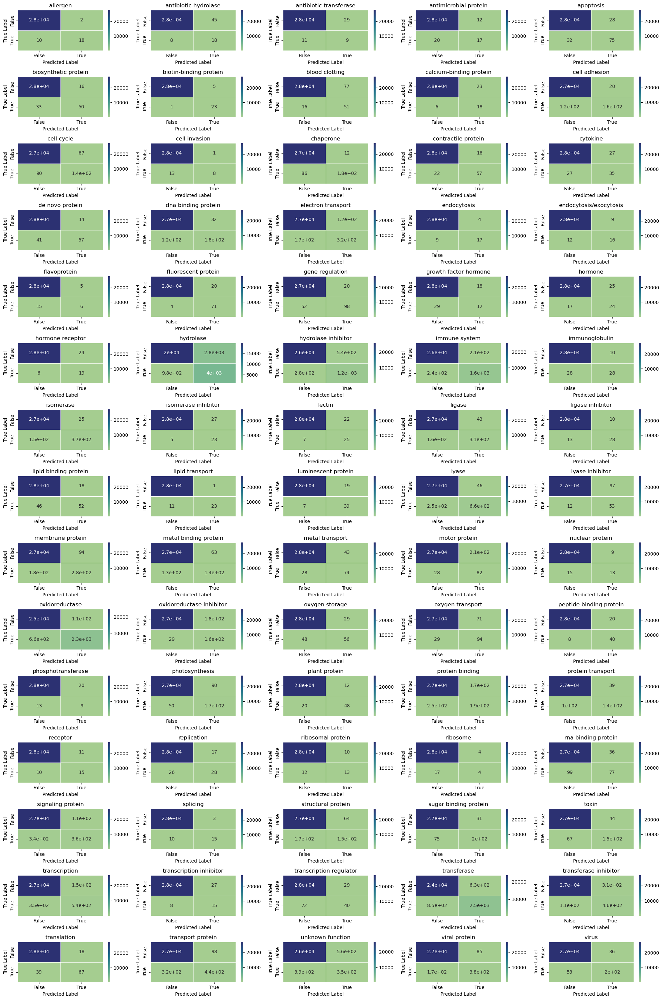

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_rfc4):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### XGB Classifier

In [ ]:
#XGBoost Classifier
# It took approximately 40 hours to train the model

params_xgb = {
    'n_estimators': [100,200,300, 400,500],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.1]
}

xgb4 = XGBClassifier(booster = 'gbtree', gamma = 0.1, tree_method = 'hist', random_state=random_seed, n_jobs = -1) # min_child_weight = 4,
gs_xgb4 = RandomizedSearchCV(xgb4, param_distributions=params_xgb, scoring=scoring, n_iter=50, cv=3, n_jobs = -1, random_state = random_seed, refit='accuracy', return_train_score=True)

gs_xgb4.fit(X_train_4, y_training)
# Best paramete set
print('Best parameters found:\n', gs_xgb4.best_params_)
print('Best score found:\n', gs_xgb4.best_score_)

Best parameters found:
 {'n_estimators': 500, 'max_depth': 7, 'learning_rate': 0.1}
Best score found:
 0.6586503809933757


In [ ]:
# Extract the results
results = gs_xgb4.cv_results_

# Calculate mean and std for accuracy
accuracy_mean = results['mean_test_accuracy'].mean()
accuracy_std = results['std_test_accuracy'].mean()

# Calculate mean and std for weighted F1 score
f1_mean = results['mean_test_f1_weighted'].mean()
f1_std = results['std_test_f1_weighted'].mean()

# Calculate mean and std for macro F1 score
f1_macro_mean = results['mean_test_f1_macro'].mean()
f1_macro_std = results['std_test_f1_macro'].mean()


print(f"Accuracy: {accuracy_mean:.3f} ± {accuracy_std:.3f}")
print(f"F1 Score (weighted): {f1_mean:.3f} ± {f1_std:.3f}")
print(f"F1 Score (macro): {f1_macro_mean:.3f} ± {f1_macro_std:.3f}")

# print(f"Accuracy: 0.658 ± 0.001")
# print(f"F1 Score (weighted): 0.664 ± 0.001")
# print(f"F1 Score (macro): 0.597 ± 0.002")

Accuracy: 0.658 ± 0.001
F1 Score (weighted): 0.664 ± 0.001
F1 Score (macro): 0.597 ± 0.002


In [ ]:
# best_xgb4 = XGBClassifier(booster = 'gbtree', n_estimators = 500, gamma = 0.1, max_depth = 7, tree_method = 'hist', learning_rate = 0.1, n_jobs = -1, random_state=random_seed)
# best_xgb4.fit(X_train_4, y_training)
best_xgb4 = gs_xgb4.best_estimator_
best_xgb4

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=500, n_jobs=-1, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)

In [ ]:
xgb_pred4 = best_xgb4.predict(X_test_4)
acc_xgb4 = accuracy_score(xgb_pred4, y_testing)
print('accuracy: %s' % acc_xgb4)
f1_xgb4 = f1_score(y_testing, xgb_pred4, average='weighted')
print('f1 score: %s' % f1_xgb4)
macro_f1_xgb4 = f1_score(y_testing, xgb_pred4, average='macro')

# accuracy_list4.append(acc_xgb4)
# f1_list4.append(f1_xgb4)
# macro_f1_list4.append(macro_f1_xgb4)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, xgb_pred4, target_names=labels))

accuracy: 0.6886052146240914
f1 score: 0.6855526837315271
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.90      0.64      0.75        28
    antibiotic hydrolase       0.48      0.46      0.47        26
  antibiotic transferase       0.46      0.30      0.36        20
   antimicrobial protein       0.88      0.38      0.53        37
               apoptosis       0.85      0.65      0.74       107
    biosynthetic protein       0.76      0.53      0.62        83
  biotin-binding protein       0.86      1.00      0.92        24
          blood clotting       0.70      0.60      0.65        67
 calcium-binding protein       0.42      0.42      0.42        24
           cell adhesion       0.86      0.54      0.66       287
              cell cycle       0.72      0.51      0.59       234
           cell invasion       1.00      0.19      0.32        21
               chap

In [ ]:
accuracy_list4.append(0.69)
f1_list4.append(0.69)

macro_f1_list4.append(0.61)

In [ ]:
# xgb4_report = classification_report(y_testing, xgb_pred4, target_names=labels, output_dict=True)
# xgb4_report.update({"accuracy": {"precision": None, "recall": None, "f1-score": xgb4_report["accuracy"], "support": xgb4_report['macro avg']['support']}})

# xgb4_df = pd.DataFrame(xgb4_report).transpose()
# xgb4_df.to_csv('xgb4_report.csv', index = False)

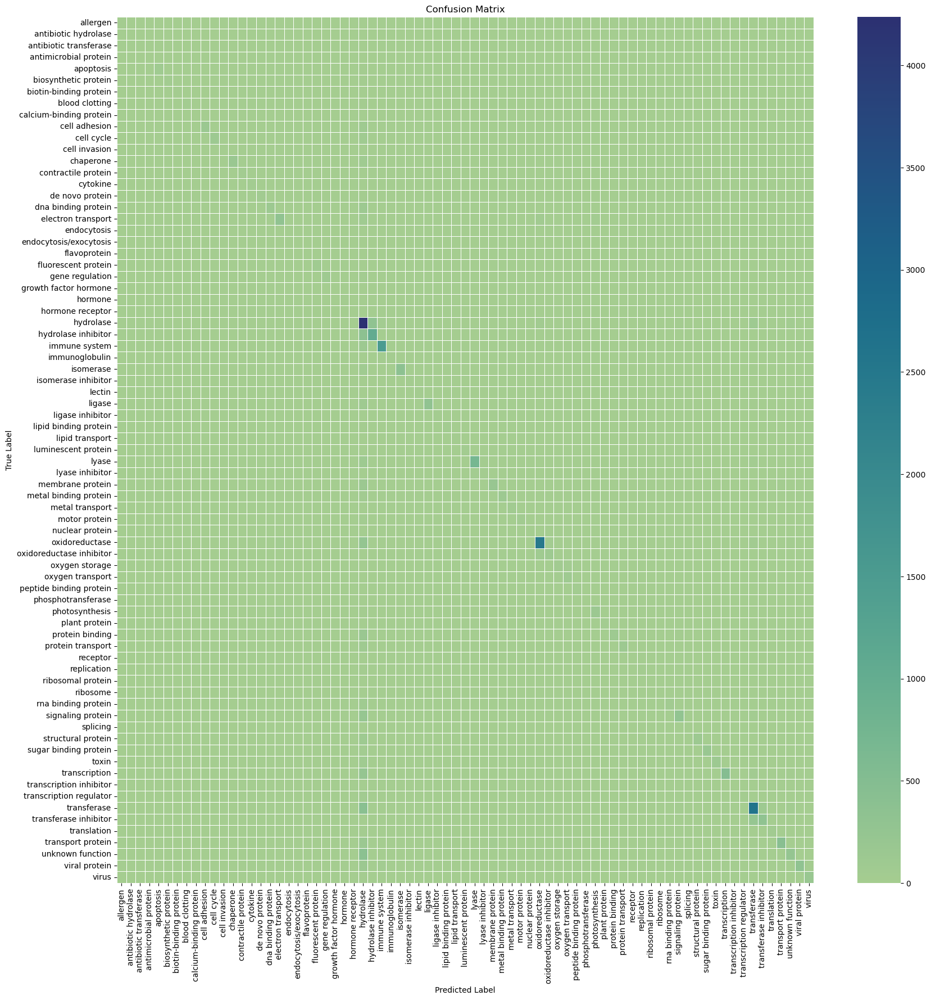

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_xgb4 = confusion_matrix(y_testing, xgb_pred4)#.astype(int)
sns.heatmap(cm_xgb4, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_xgb4 = confusion_matrix(y_testing, xgb_pred4)#.astype(int)
cm_df_xgb4 = pd.DataFrame(cm_xgb4, columns = labels, index = labels)
cm_df_xgb4

,allergen,antibiotic hydrolase,antibiotic transferase,antimicrobial protein,apoptosis,biosynthetic protein,biotin-binding protein,blood clotting,calcium-binding protein,cell adhesion,...,transcription,transcription inhibitor,transcription regulator,transferase,transferase inhibitor,translation,transport protein,unknown function,viral protein,virus
allergen,18,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
antibiotic hydrolase,0,12,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
antibiotic transferase,0,0,6,0,0,0,0,0,0,0,...,0,0,0,12,0,0,0,1,0,0
antimicrobial protein,0,0,0,14,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
apoptosis,0,0,0,0,70,0,0,0,0,0,...,1,0,0,4,0,0,0,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
translation,0,0,0,0,0,2,0,0,0,0,...,1,0,0,6,0,55,0,2,0,0
transport protein,0,0,0,1,0,0,0,0,0,0,...,0,0,0,18,0,0,426,6,0,0
unknown function,0,0,1,0,1,1,1,0,1,0,...,6,0,3,52,0,0,1,234,0,0
viral protein,0,0,0,0,1,0,0,0,0,0,...,0,0,0,15,1,0,0,0,327,24


In [ ]:
multi_cm_xgb4 = multilabel_confusion_matrix(y_testing, xgb_pred4, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
multi_cm_xgb4

array([[[27623,     2],
        [   10,    18]],

       [[27614,    13],
        [   14,    12]],

       [[27626,     7],
        [   14,     6]],

       [[27614,     2],
        [   23,    14]],

       [[27534,    12],
        [   37,    70]],

       [[27556,    14],
        [   39,    44]],

       [[27625,     4],
        [    0,    24]],

       [[27569,    17],
        [   27,    40]],

       [[27615,    14],
        [   14,    10]],

       [[27341,    25],
        [  133,   154]],

       [[27372,    47],
        [  115,   119]],

       [[27632,     0],
        [   17,     4]],

       [[27374,    11],
        [  102,   166]],

       [[27568,     6],
        [   35,    44]],

       [[27571,    20],
        [   28,    34]],

       [[27543,    12],
        [   46,    52]],

       [[27327,    22],
        [  175,   129]],

       [[27074,    98],
        [  182,   299]],

       [[27622,     5],
        [   10,    16]],

       [[27614,    11],
        [   15,    13]],



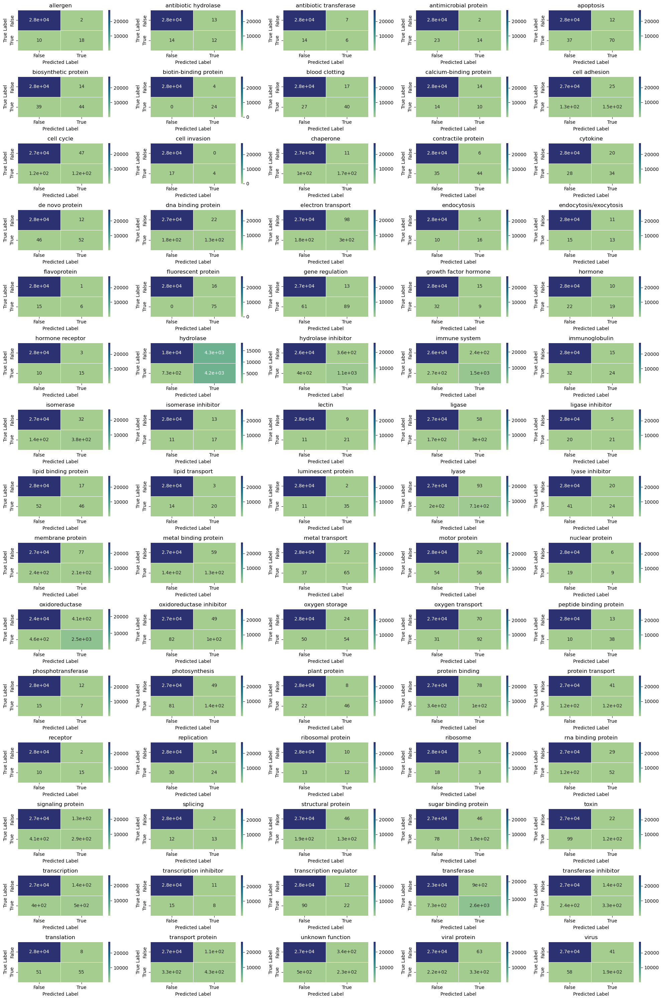

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_xgb4):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### Voting Classifier

In [ ]:
# group / ensemble of models
estimator4 = []
estimator4.append(('LR', LogisticRegression(solver = 'newton-cg', penalty = 'l2', class_weight = 'balanced', C = 1.0, random_state=random_seed, verbose = 1, n_jobs = -1)))
estimator4.append(('RFC', RandomForestClassifier(n_estimators = 100, min_samples_split = 2, criterion = 'gini', verbose = 1, class_weight = 'balanced', random_state=random_seed, n_jobs = -1)))
estimator4.append(('KNN', KNeighborsClassifier(n_neighbors=3, leaf_size = 13, weights = 'distance', n_jobs = -1)))
estimator4.append(('XGB', XGBClassifier(booster = 'gbtree', n_estimators = 500, gamma = 0.1, max_depth = 7, tree_method = 'hist', learning_rate = 0.1, random_state=random_seed, n_jobs = -1)))



In [ ]:
from sklearn.model_selection import StratifiedKFold

In [ ]:
# It took approximately 5 days to train the model
vot_soft4 = VotingClassifier(estimators = estimator4, voting ='soft')

# Initialize StratifiedKFold for splitting the data
skf = StratifiedKFold(n_splits=10)

# Lists to store the scores
accuracy_scores = []
f1_scores_weighted = []
f1_scores_macro = []

# Perform cross-validation
for train_index, test_index in skf.split(X_train_4, y_training):
    X_train_fold, X_test_fold = X_train_4[train_index], X_train_4[test_index]
    y_train_fold, y_test_fold = y_training[train_index], y_training[test_index]

    # Fit the voting classifier on the training fold
    vot_soft4.fit(X_train_fold, y_train_fold)

    # Predict on the test fold
    y_pred_fold = vot_soft4.predict(X_test_fold)

    # Calculate accuracy and F1 score on the test fold
    accuracy = accuracy_score(y_test_fold, y_pred_fold)
    f1_weighted = f1_score(y_test_fold, y_pred_fold, average='weighted')
    f1_macro = f1_score(y_test_fold, y_pred_fold, average='macro')

    # Append the scores to the lists
    accuracy_scores.append(accuracy)
    f1_scores_weighted.append(f1_weighted)
    f1_scores_macro.append(f1_macro)

# Calculate mean and standard deviation for accuracy and F1 score
mean_accuracy = np.mean(accuracy_scores)
std_accuracy = np.std(accuracy_scores)
mean_f1_weighted = np.mean(f1_scores_weighted)
std_f1_weighted = np.std(f1_scores_weighted)
mean_f1_macro = np.mean(f1_scores_macro)
std_f1_macro = np.std(f1_scores_macro)

print(f"Accuracy (mean ± std): {mean_accuracy:.3f} ± {std_accuracy:.3f}")
print(f"F1 Score (weighted) (mean ± std): {mean_f1_weighted:.3f} ± {std_f1_weighted:.3f}")
print(f"F1 Score (macro) (mean ± std): {mean_f1_macro:.3f} ± {std_f1_macro:.3f}")

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed: 526.8min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 24.4min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 60.2min finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.6s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    1.5s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed: 505.3min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 22.9min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 58.4min finished
[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent work

Accuracy (mean ± std): 0.726 ± 0.006
F1 Score (weighted) (mean ± std): 0.728 ± 0.003
F1 Score (macro) (mean ± std): 0.630 ± 0.009


In [ ]:
print(f"Accuracy (mean ± std): {mean_accuracy:.3f} ± {std_accuracy:.3f}")
print(f"F1 Score (weighted) (mean ± std): {mean_f1_weighted:.3f} ± {std_f1_weighted:.3f}")
print(f"F1 Score (macro) (mean ± std): {mean_f1_macro:.3f} ± {std_f1_macro:.3f}")

Accuracy (mean ± std): 0.726 ± 0.006
F1 Score (weighted) (mean ± std): 0.728 ± 0.003
F1 Score (macro) (mean ± std): 0.630 ± 0.009


In [ ]:
# Voting Classifier with soft voting
vot_soft4 = VotingClassifier(estimators = estimator4, voting ='soft')
vot_soft4.fit(X_train_4, y_training)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 out of   1 | elapsed: 471.0min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 29.2min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 73.4min finished


VotingClassifier(estimators=[('LR',
                              LogisticRegression(class_weight='balanced',
                                                 n_jobs=-1, random_state=42,
                                                 solver='newton-cg',
                                                 verbose=1)),
                             ('RFC',
                              RandomForestClassifier(class_weight='balanced',
                                                     n_jobs=-1, random_state=42,
                                                     verbose=1)),
                             ('KNN',
                              KNeighborsClassifier(leaf_size=13, n_jobs=-1,
                                                   n_neighbors=3,
                                                   weights='distance')),
                             ('XGB',
                              XGBClassifier(base_score=None,...
                                            gpu_id=None, grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=0.1, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=7,
                                            max_leaves=None,
                                            min_child_weight=None, missing=nan,
                                            monotone_constraints=None,
                                            n_estimators=500, n_jobs=-1,
                                            num_parallel_tree=None,
                                            predictor=None, random_state=42, ...))],
                 voting='soft')

In [ ]:
vots_pred4 = vot_soft4.predict(X_test_4)
# using accuracy_score and f1_score
acc_vots4 = accuracy_score(y_testing, vots_pred4)
print("Soft Voting Score % s" % acc_vots4)
f1_vots4 = f1_score(y_testing, vots_pred4, average='weighted')
print('f1 score weighted: %s' % f1_vots4)
macro_f1_vots4 = f1_score(y_testing, vots_pred4, average='macro')

# accuracy_list4.append(acc_vots4)
# f1_list4.append(f1_vots4)
# macro_f1_list4.append(macro_f1_vots4)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, vots_pred4, target_names=labels))

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.9s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    2.5s finished


Soft Voting Score 0.7415831916971034
f1 score weighted: 0.7411004340337863
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.91      0.71      0.80        28
    antibiotic hydrolase       0.33      0.73      0.45        26
  antibiotic transferase       0.24      0.45      0.32        20
   antimicrobial protein       0.76      0.43      0.55        37
               apoptosis       0.82      0.73      0.77       107
    biosynthetic protein       0.76      0.64      0.69        83
  biotin-binding protein       0.82      0.96      0.88        24
          blood clotting       0.54      0.75      0.62        67
 calcium-binding protein       0.40      0.71      0.52        24
           cell adhesion       0.83      0.64      0.73       287
              cell cycle       0.70      0.64      0.67       234
           cell invasion       0.80      0.38      0.52        21
  

In [ ]:
accuracy_list4.append(0.74)
f1_list4.append(0.74)

macro_f1_list4.append(0.65)

In [ ]:
# save classification report
# vots4_report = classification_report(y_testing, vots_pred4, target_names=labels, output_dict=True)
# vots4_report.update({"accuracy": {"precision": None, "recall": None, "f1-score": vots4_report["accuracy"], "support": vots4_report['macro avg']['support']}})

# vots4_df = pd.DataFrame(vots4_report).transpose()
# vots4_df.to_csv('vots4_report.csv', index = False)

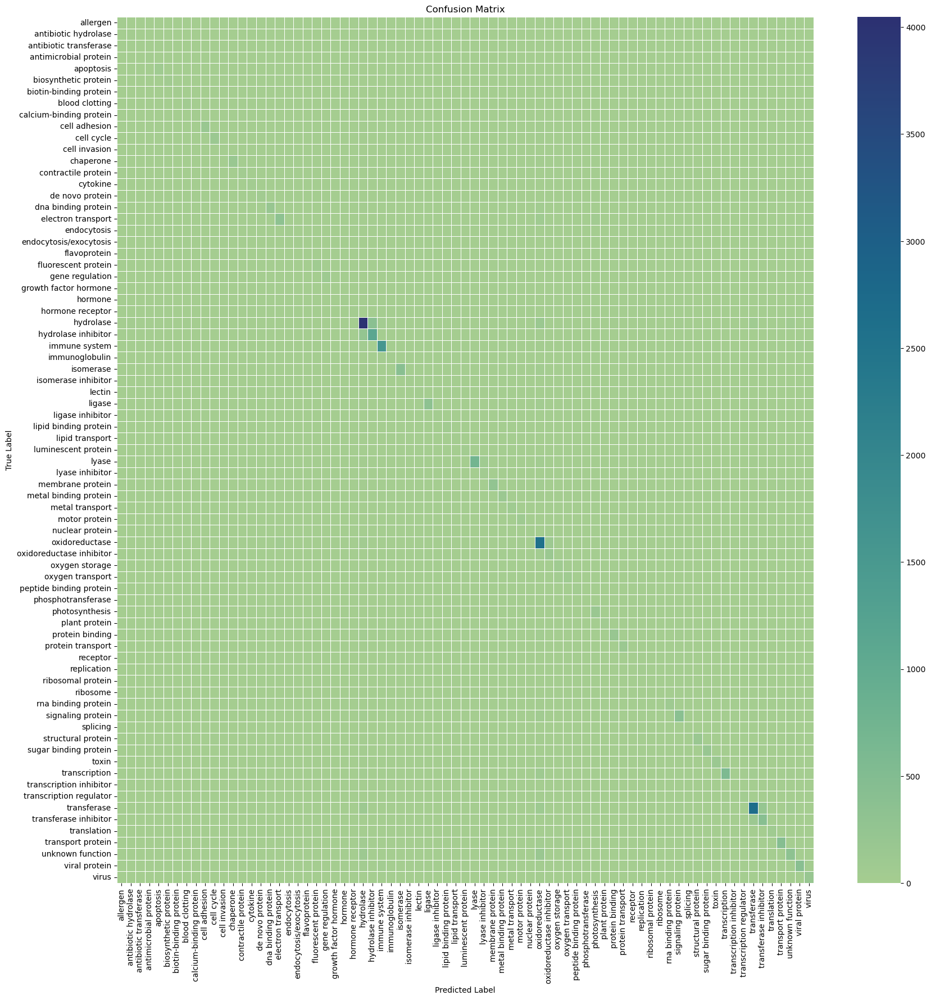

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_vots4 = confusion_matrix(y_testing, vots_pred4)#.astype(int)
sns.heatmap(cm_vots4, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_vots4 = confusion_matrix(y_testing, vots_pred4)#.astype(int)
cm_df_vots4 = pd.DataFrame(cm_vots4, columns = labels, index = labels)
cm_df_vots4

,allergen,antibiotic hydrolase,antibiotic transferase,antimicrobial protein,apoptosis,biosynthetic protein,biotin-binding protein,blood clotting,calcium-binding protein,cell adhesion,...,transcription,transcription inhibitor,transcription regulator,transferase,transferase inhibitor,translation,transport protein,unknown function,viral protein,virus
allergen,20,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
antibiotic hydrolase,0,19,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
antibiotic transferase,0,0,9,0,0,0,0,0,0,0,...,0,2,0,9,0,0,0,0,0,0
antimicrobial protein,0,0,0,16,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
apoptosis,0,0,0,0,78,0,0,0,0,0,...,1,0,0,1,0,0,0,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
translation,0,0,0,0,0,2,0,0,0,0,...,0,0,0,3,0,67,0,3,0,0
transport protein,0,0,0,1,0,0,0,0,0,2,...,5,0,0,9,0,1,458,8,0,0
unknown function,0,0,1,0,1,0,1,0,1,1,...,8,0,1,42,0,0,2,335,1,0
viral protein,0,0,0,0,0,0,0,0,0,2,...,0,0,1,10,1,0,0,1,401,23


In [ ]:
multi_cm_vots4 = multilabel_confusion_matrix(y_testing, vots_pred4, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
multi_cm_vots4

array([[[27623,     2],
        [    8,    20]],

       [[27588,    39],
        [    7,    19]],

       [[27605,    28],
        [   11,     9]],

       [[27611,     5],
        [   21,    16]],

       [[27529,    17],
        [   29,    78]],

       [[27553,    17],
        [   30,    53]],

       [[27624,     5],
        [    1,    23]],

       [[27543,    43],
        [   17,    50]],

       [[27604,    25],
        [    7,    17]],

       [[27329,    37],
        [  102,   185]],

       [[27356,    63],
        [   84,   150]],

       [[27630,     2],
        [   13,     8]],

       [[27369,    16],
        [   81,   187]],

       [[27563,    11],
        [   32,    47]],

       [[27565,    26],
        [   27,    35]],

       [[27545,    10],
        [   41,    57]],

       [[27314,    35],
        [  114,   190]],

       [[27025,   147],
        [  144,   337]],

       [[27623,     4],
        [    9,    17]],

       [[27612,    13],
        [   12,    16]],



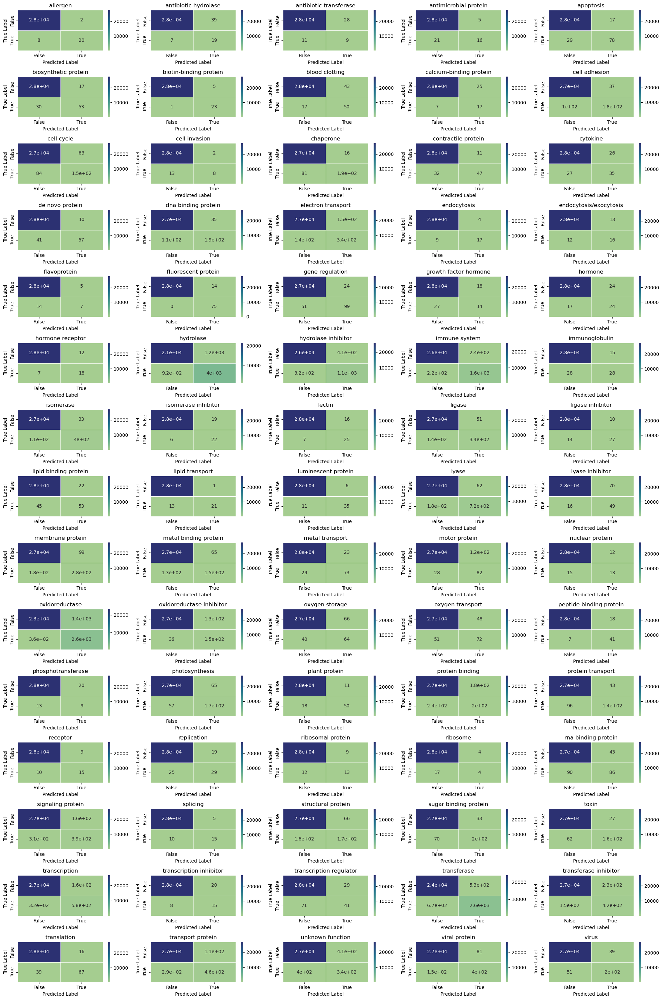

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_vots4):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

##### Stacking Classifier

In [ ]:
meta_model4 = StackingClassifier(
    estimators=[
        ('KNN', KNeighborsClassifier(n_neighbors=3, leaf_size = 13, weights = 'distance', n_jobs = -1)),
        ('RFC', RandomForestClassifier(n_estimators = 100, min_samples_split = 2, criterion = 'entropy', verbose = 1, class_weight = 'balanced', random_state=random_seed, n_jobs = -1)),
        ('XGB', XGBClassifier(booster = 'gbtree', n_estimators = 500, gamma = 0.1, max_depth = 7, tree_method = 'hist', learning_rate = 0.1, random_state=random_seed, n_jobs = -1))
    ],
    final_estimator=XGBClassifier(booster = 'gbtree', n_estimators = 500, gamma = 0.1, max_depth = 7, tree_method = 'hist', learning_rate = 0.1, random_state=random_seed, n_jobs = -1), # LogisticRegression(solver = 'newton-cg', penalty = 'l2', class_weight = 'balanced', C = 1.0, random_state=random_seed, verbose = 1, n_jobs = -1)
    stack_method = 'auto',
    cv = 3,
    n_jobs = -1
)

In [ ]:
# It took approximately 5 days to train the model

# Initialize StratifiedKFold for splitting the data
skf = StratifiedKFold(n_splits=10)

# Lists to store the scores
accuracy_scores = []
f1_scores_weighted = []
f1_scores_macro = []

# Perform cross-validation
for train_index, test_index in skf.split(X_train_4, y_training):
    X_train_fold, X_test_fold = X_train_4[train_index], X_train_4[test_index]
    y_train_fold, y_test_fold = y_training[train_index], y_training[test_index]

    # Fit the voting classifier on the training fold
    meta_model4.fit(X_train_fold, y_train_fold)

    # Predict on the test fold
    y_pred_fold = meta_model4.predict(X_test_fold)

    # Calculate accuracy and F1 score on the test fold
    accuracy = accuracy_score(y_test_fold, y_pred_fold)
    f1_weighted = f1_score(y_test_fold, y_pred_fold, average='weighted')
    f1_macro = f1_score(y_test_fold, y_pred_fold, average='macro')

    # Append the scores to the lists
    accuracy_scores.append(accuracy)
    f1_scores_weighted.append(f1_weighted)
    f1_scores_macro.append(f1_macro)

# Calculate mean and standard deviation for accuracy and F1 score
mean_accuracy = np.mean(accuracy_scores)
std_accuracy = np.std(accuracy_scores)
mean_f1_weighted = np.mean(f1_scores_weighted)
std_f1_weighted = np.std(f1_scores_weighted)
mean_f1_macro = np.mean(f1_scores_macro)
std_f1_macro = np.std(f1_scores_macro)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 25.6min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 64.5min finished
[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 169.5min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    6.3s finished
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 170.6min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    5.7s finished
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 171.5min finished
[Parallel(n_jobs=1)]: 

In [ ]:
print(f"Accuracy (mean ± std): {mean_accuracy:.3f} ± {std_accuracy:.3f}")
print(f"F1 Score (weighted) (mean ± std): {mean_f1_weighted:.3f} ± {std_f1_weighted:.3f}")
print(f"F1 Score (macro) (mean ± std): {mean_f1_macro:.3f} ± {std_f1_macro:.3f}")

Accuracy (mean ± std): 0.716 ± 0.006
F1 Score (weighted) (mean ± std): 0.718 ± 0.005
F1 Score (macro) (mean ± std): 0.620 ± 0.009


In [ ]:
meta_model4.fit(X_train_4, y_training)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed: 28.7min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 74.3min finished
[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 207.6min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    7.9s finished
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 208.9min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    6.8s finished
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 210.4min finished
[Parallel(n_jobs=1)]: 

StackingClassifier(cv=3,
                   estimators=[('KNN',
                                KNeighborsClassifier(leaf_size=13, n_jobs=-1,
                                                     n_neighbors=3,
                                                     weights='distance')),
                               ('RFC',
                                RandomForestClassifier(class_weight='balanced',
                                                       criterion='entropy',
                                                       n_jobs=-1,
                                                       random_state=42,
                                                       verbose=1)),
                               ('XGB',
                                XGBClassifier(base_score=None, booster='gbtree',
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              co...
                                                 gpu_id=None, grow_policy=None,
                                                 importance_type=None,
                                                 interaction_constraints=None,
                                                 learning_rate=0.1,
                                                 max_bin=None,
                                                 max_cat_threshold=None,
                                                 max_cat_to_onehot=None,
                                                 max_delta_step=None,
                                                 max_depth=7, max_leaves=None,
                                                 min_child_weight=None,
                                                 missing=nan,
                                                 monotone_constraints=None,
                                                 n_estimators=500, n_jobs=-1,
                                                 num_parallel_tree=None,
                                                 predictor=None,
                                                 random_state=42, ...),
                   n_jobs=-1)

In [ ]:
meta_pred4 = meta_model4.predict(X_test_4)
# using accuracy_score
acc_meta4 = accuracy_score(y_testing, meta_pred4)
print("Accuracy Score: %s" % acc_meta4)
f1_meta4 = f1_score(y_testing, meta_pred4, average='weighted')
print('f1 score weighted: %s' % f1_meta4)
macro_f1_meta4 = f1_score(y_testing, meta_pred4, average='macro')

# accuracy_list4.append(acc_meta4)
# f1_list4.append(f1_meta4)
# macro_f1_list4.append(macro_f1_meta4)

print('-'*20 + ' Classification Report ' + '-'*20)
print(classification_report(y_testing, meta_pred4, target_names=labels))

[Parallel(n_jobs=8)]: Using backend ThreadingBackend with 8 concurrent workers.
[Parallel(n_jobs=8)]: Done  34 tasks      | elapsed:    0.6s
[Parallel(n_jobs=8)]: Done 100 out of 100 | elapsed:    1.9s finished


Accuracy Score: 0.7452717607492858
f1 score weighted: 0.740726415836378
-------------------- Classification Report --------------------
                          precision    recall  f1-score   support

                allergen       0.89      0.61      0.72        28
    antibiotic hydrolase       0.75      0.35      0.47        26
  antibiotic transferase       0.67      0.20      0.31        20
   antimicrobial protein       0.75      0.41      0.53        37
               apoptosis       0.83      0.73      0.78       107
    biosynthetic protein       0.78      0.54      0.64        83
  biotin-binding protein       0.86      1.00      0.92        24
          blood clotting       0.74      0.63      0.68        67
 calcium-binding protein       0.61      0.58      0.60        24
           cell adhesion       0.83      0.62      0.71       287
              cell cycle       0.71      0.59      0.65       234
           cell invasion       0.89      0.38      0.53        21
     

In [ ]:
accuracy_list4.append(0.75)
f1_list4.append(0.74)

macro_f1_list4.append(0.64)

In [ ]:
# save classification report
# meta4_report = classification_report(y_testing, meta_pred4, target_names=labels, output_dict=True)
# meta4_report.update({"accuracy": {"precision": None, "recall": None, "f1-score": meta4_report["accuracy"], "support": meta4_report['macro avg']['support']}})

# meta4_df = pd.DataFrame(meta4_report).transpose()
# meta4_df.to_csv('meta4_report.csv', index = False)

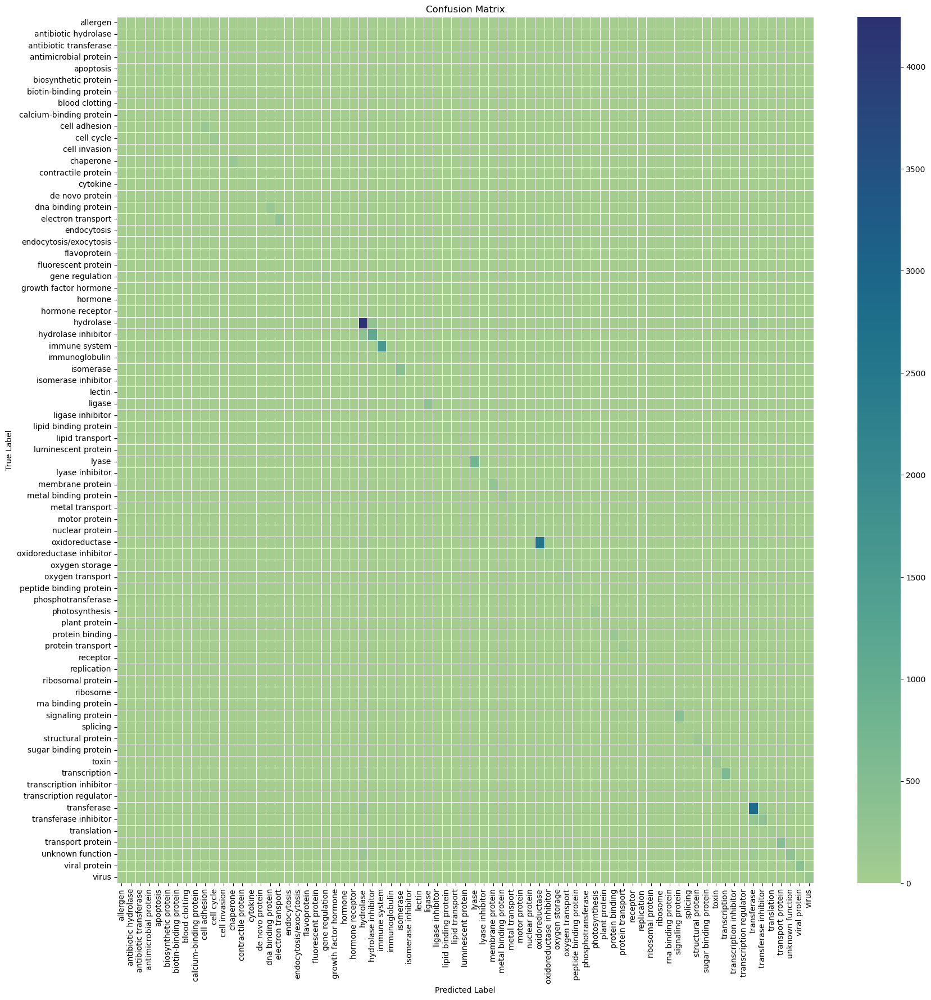

In [ ]:
# Plotting a confusion matrix
plt.figure(figsize=(20, 20))
cm_meta4 = confusion_matrix(y_testing, meta_pred4)#.astype(int)
sns.heatmap(cm_meta4, annot=False, cmap='crest', linewidth=.5,
xticklabels=labels, yticklabels=labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

In [ ]:
# confusion matrix
cm_meta4 = confusion_matrix(y_testing, meta_pred4)#.astype(int)
cm_df_meta4 = pd.DataFrame(cm_meta4, columns = labels, index = labels)
cm_df_meta4

,allergen,antibiotic hydrolase,antibiotic transferase,antimicrobial protein,apoptosis,biosynthetic protein,biotin-binding protein,blood clotting,calcium-binding protein,cell adhesion,...,transcription,transcription inhibitor,transcription regulator,transferase,transferase inhibitor,translation,transport protein,unknown function,viral protein,virus
allergen,17,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
antibiotic hydrolase,0,9,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
antibiotic transferase,0,0,4,0,0,0,0,0,0,0,...,0,0,0,15,0,0,0,0,0,0
antimicrobial protein,0,0,0,15,0,0,0,0,0,0,...,2,0,0,2,0,0,0,4,0,0
apoptosis,0,0,0,0,78,0,0,0,0,0,...,1,0,0,2,0,0,0,4,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
translation,0,0,0,0,0,3,0,0,0,0,...,1,0,0,10,0,62,0,5,0,0
transport protein,0,0,0,1,0,0,0,0,0,2,...,5,0,0,25,0,1,479,9,0,0
unknown function,0,0,0,0,2,0,1,0,0,1,...,22,0,0,99,0,0,3,318,1,1
viral protein,0,0,0,0,0,0,0,1,0,0,...,2,0,0,17,1,0,1,6,394,23


In [ ]:
multi_cm_meta4 = multilabel_confusion_matrix(y_testing, meta_pred4, labels=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74])
multi_cm_meta4

array([[[27623,     2],
        [   11,    17]],

       [[27624,     3],
        [   17,     9]],

       [[27631,     2],
        [   16,     4]],

       [[27611,     5],
        [   22,    15]],

       [[27530,    16],
        [   29,    78]],

       [[27557,    13],
        [   38,    45]],

       [[27625,     4],
        [    0,    24]],

       [[27571,    15],
        [   25,    42]],

       [[27620,     9],
        [   10,    14]],

       [[27330,    36],
        [  108,   179]],

       [[27361,    58],
        [   95,   139]],

       [[27631,     1],
        [   13,     8]],

       [[27368,    17],
        [   78,   190]],

       [[27566,     8],
        [   34,    45]],

       [[27570,    21],
        [   32,    30]],

       [[27540,    15],
        [   43,    55]],

       [[27307,    42],
        [  114,   190]],

       [[27090,    82],
        [  155,   326]],

       [[27622,     5],
        [    9,    17]],

       [[27615,    10],
        [   14,    14]],



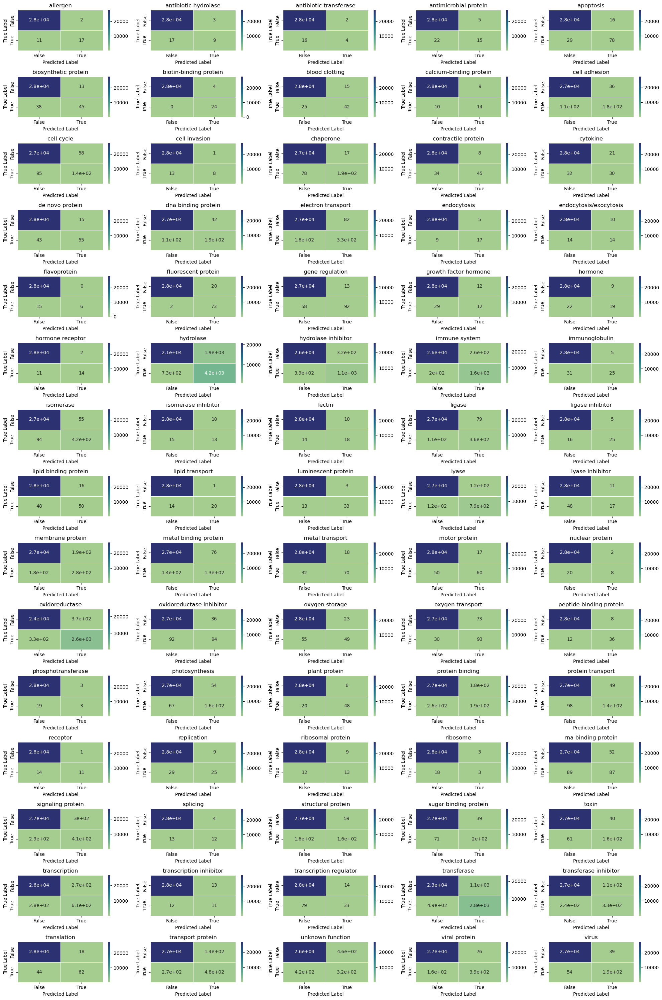

In [ ]:
# plot confusion matrix for each class

fig, axs = plt.subplots(15, 5, figsize=(20, 30))
axs = axs.ravel()
for i, cm in enumerate(multi_cm_meta4):
    df_cm = pd.DataFrame(cm, index=['False', 'True'],
                         columns=['False', 'True'])
    sns.heatmap(df_cm, annot=True, cmap='crest', linewidth=.5, ax=axs[i])
    axs[i].set_title(labels[i])
    axs[i].set_xlabel("Predicted Label")
    axs[i].set_ylabel("True Label")

plt.tight_layout()
plt.show()

### Comparison of machine learning models

In [ ]:
print(accuracy_list1)
print(f1_list1)
print(macro_f1_list1)
print(accuracy_list2)
print(f1_list2)
print(macro_f1_list2)
print(accuracy_list3)
print(f1_list3)
print(macro_f1_list3)
print(accuracy_list4)
print(f1_list4)
print(macro_f1_list4)

[0.72, 0.17, 0.1, 0.57, 0.65, 0.71, 0.71, 0.73, 0.73]
[0.71, 0.17, 0.09, 0.55, 0.65, 0.71, 0.7, 0.73, 0.73]
[0.6, 0.1, 0.09, 0.4, 0.53, 0.62, 0.61, 0.63, 0.61]
[0.73, 0.25, 0.32, 0.65, 0.65, 0.71, 0.73, 0.74, 0.75]
[0.73, 0.26, 0.32, 0.65, 0.65, 0.71, 0.73, 0.74, 0.74]
[0.6, 0.24, 0.29, 0.49, 0.53, 0.63, 0.64, 0.64, 0.62]
[0.7, 0.46, 0.66, 0.71, 0.66, 0.71, 0.73, 0.73, 0.74]
[0.74, 0.48, 0.67, 0.71, 0.66, 0.71, 0.72, 0.73, 0.74]
[0.63, 0.47, 0.59, 0.6, 0.55, 0.63, 0.64, 0.64, 0.62]
[0.69, 0.62, 0.71, 0.73, 0.66, 0.71, 0.69, 0.74, 0.75]
[0.74, 0.65, 0.72, 0.72, 0.67, 0.72, 0.69, 0.74, 0.74]
[0.63, 0.55, 0.62, 0.6, 0.55, 0.63, 0.61, 0.65, 0.64]


In [ ]:
model_list = ['KNN', 'multinomialNB', 'Logistic Regression', 'MLP', 'Decision Tree', 'Random Forest', 'XGBoost', 'Voting Classifier', 'Stacking Classifier']
model_df4 = pd.DataFrame({'uni-gram accuracy': accuracy_list1, 'uni-gram f1-score': f1_list1, 'bi-gram accuracy': accuracy_list2, 'bi-gram f1-score': f1_list2, 'tri-gram accuracy': accuracy_list3, 'tri-gram f1-score': f1_list3, '4-gram accuracy': accuracy_list4, '4-gram f1-score': f1_list4}, index=model_list)

model_df4

,uni-gram accuracy,uni-gram f1-score,bi-gram accuracy,bi-gram f1-score,tri-gram accuracy,tri-gram f1-score,4-gram accuracy,4-gram f1-score
KNN,0.72,0.71,0.73,0.73,0.70,0.74,0.69,0.74
multinomialNB,0.17,0.17,0.25,0.26,0.46,0.48,0.62,0.65
Logistic Regression,0.10,0.09,0.32,0.32,0.66,0.67,0.71,0.72
MLP,0.57,0.55,0.65,0.65,0.71,0.71,0.73,0.72
Decision Tree,0.65,0.65,0.65,0.65,0.66,0.66,0.66,0.67
Random Forest,0.71,0.71,0.71,0.71,0.71,0.71,0.71,0.72
XGBoost,0.71,0.70,0.73,0.73,0.73,0.72,0.69,0.69
Voting Classifier,0.73,0.73,0.74,0.74,0.73,0.73,0.74,0.74
Stacking Classifier,0.73,0.73,0.75,0.74,0.74,0.74,0.75,0.74


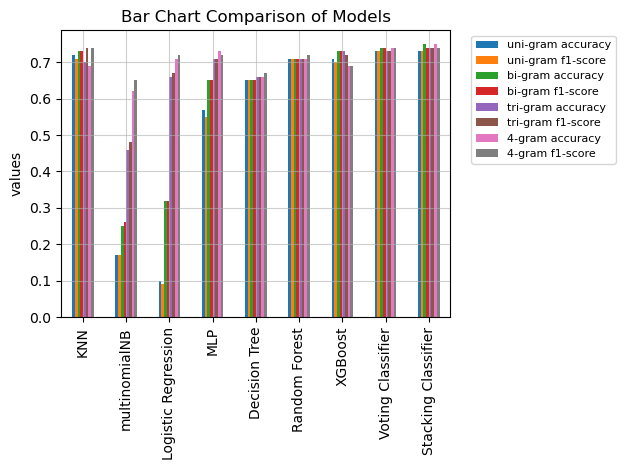

In [ ]:
# plt.figure(figsize = (10,6))
ax = model_df4.plot(kind = 'bar')
ax.legend(
    bbox_to_anchor=(1.04, 1),
    prop={'size': 8}
)
plt.grid(alpha = 0.6)
plt.title("Bar Chart Comparison of Models",fontsize=12)
plt.ylabel('values')
plt.tight_layout()
# plt.savefig('pics/pdb_comparison_ml_models7.jpg', dpi = 300, bbox_inches='tight')
plt.show()

In [ ]:
model_list = ['KNN', 'multinomialNB', 'Logistic Regression', 'MLP', 'Decision Tree', 'Random Forest', 'XGBoost', 'Voting Classifier', 'Stacking Classifier']
model_df5 = pd.DataFrame({'uni-gram accuracy': accuracy_list1, 'uni-gram macro f1-score': macro_f1_list1, 'bi-gram accuracy': accuracy_list2, 'bi-gram macro f1-score': macro_f1_list2, 'tri-gram accuracy': accuracy_list3, 'tri-gram macro f1-score': macro_f1_list3, '4-gram accuracy': accuracy_list4, '4-gram macro f1-score': macro_f1_list4}, index=model_list)

model_df5

,uni-gram accuracy,uni-gram macro f1-score,bi-gram accuracy,bi-gram macro f1-score,tri-gram accuracy,tri-gram macro f1-score,4-gram accuracy,4-gram macro f1-score
KNN,0.72,0.60,0.73,0.60,0.70,0.63,0.69,0.63
multinomialNB,0.17,0.10,0.25,0.24,0.46,0.47,0.62,0.55
Logistic Regression,0.10,0.09,0.32,0.29,0.66,0.59,0.71,0.62
MLP,0.57,0.40,0.65,0.49,0.71,0.60,0.73,0.60
Decision Tree,0.65,0.53,0.65,0.53,0.66,0.55,0.66,0.55
Random Forest,0.71,0.62,0.71,0.63,0.71,0.63,0.71,0.63
XGBoost,0.71,0.61,0.73,0.64,0.73,0.64,0.69,0.61
Voting Classifier,0.73,0.63,0.74,0.64,0.73,0.64,0.74,0.65
Stacking Classifier,0.73,0.61,0.75,0.62,0.74,0.62,0.75,0.64


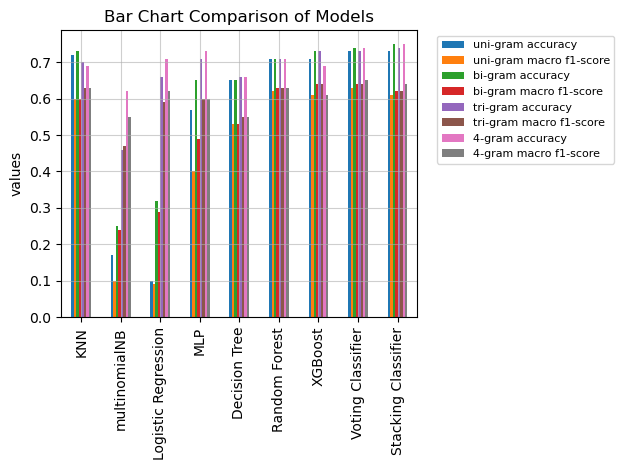

In [ ]:
# plt.figure(figsize = (10,6))
ax = model_df5.plot(kind = 'bar')
ax.legend(
    bbox_to_anchor=(1.04, 1),
    prop={'size': 8}
)
plt.grid(alpha = 0.6)
plt.title("Bar Chart Comparison of Models",fontsize=12)
plt.ylabel('values')
plt.tight_layout()
# plt.savefig('pics/pdb_comparison_ml_models8.jpg', dpi = 300, bbox_inches='tight')
plt.show()

In [ ]:
KNN_f1 = [0.60,0.60,0.63,0.63]
multinomialNB_f1 = [0.10,0.24,0.47,0.55]
LogisticRegression_f1 = [0.09,0.29,0.59,0.62]
MLP_f1 = [0.40,0.49,0.60,0.60]
DecisionTree_f1 = [0.53,0.53,0.55,0.55]
RandomForest_f1 = [0.62,0.63,0.63,0.63]
XGB_f1 = [0.61, 0.64, 0.64, 0.61]
Voting_f1 = [0.63, 0.64, 0.64, 0.65]
Stacking_f1 = [0.61, 0.62, 0.62, 0.64]

In [ ]:
kmer_list = [1,2,3,4]
f1_df2 = pd.DataFrame({'KNN': KNN_f1, 'multinomialNB': multinomialNB_f1, 'Logistic Regression': LogisticRegression_f1,
                      'MLP': MLP_f1, 'Decision Tree': DecisionTree_f1, 'Random Forest': RandomForest_f1,
                      'XGBoost': XGB_f1, 'Voting Classifier': Voting_f1, 'Stacking Classifier': Stacking_f1}, index=kmer_list)

f1_df2

,KNN,multinomialNB,Logistic Regression,MLP,Decision Tree,Random Forest,XGBoost,Voting Classifier,Stacking Classifier
1,0.60,0.10,0.09,0.40,0.53,0.62,0.61,0.63,0.61
2,0.60,0.24,0.29,0.49,0.53,0.63,0.64,0.64,0.62
3,0.63,0.47,0.59,0.60,0.55,0.63,0.64,0.64,0.62
4,0.63,0.55,0.62,0.60,0.55,0.63,0.61,0.65,0.64


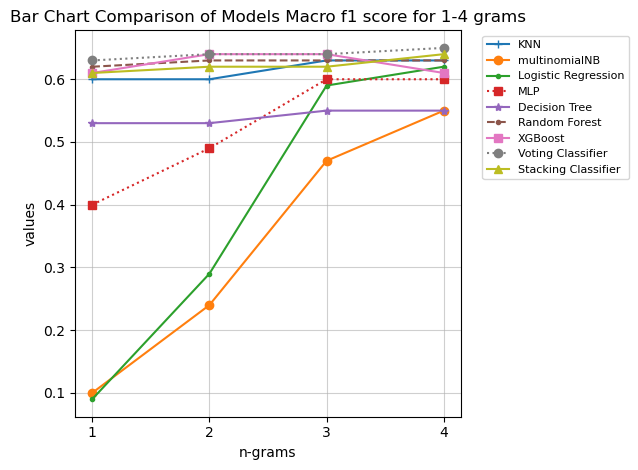

In [ ]:
# plt.figure(figsize = (10,6))
ax = f1_df2.plot(kind = 'line', style=['+-','o-','.-','s:', '*-', '.--', 's-','o:','^-'])
ax.legend(
    bbox_to_anchor=(1.04, 1),
    prop={'size': 8}
)
plt.grid(alpha = 0.6)
plt.xticks([1,2,3,4])
plt.title("Comparison of Models Macro f1 score for 1-4 grams",fontsize=12)
plt.xlabel('n-grams')
plt.ylabel('values')
plt.tight_layout()
# plt.savefig('pics/pdb_comparison_ml_models9.jpg', dpi = 300, bbox_inches='tight')
plt.show()

### Saving best model

In [ ]:
import joblib

In [ ]:
# new
model = {'voting_soft': vot_soft4, 'vect': vect_4}
joblib.dump(model, 'voting_soft_model.joblib')

['voting_soft_model.joblib']